# Dementia Project

Linear Regression
Logistic Regression
SVM
Neural Networks

In [12]:
# Run this code cell using Shift + Enter before moving further
import numpy as np
import pandas as pd
from sklearn import datasets, linear_model, preprocessing
import matplotlib.pyplot as plt
%matplotlib inline 

# Loading the data set.

In [25]:
# After completing the code in this code cell, run this code cell before moving further.

df = pd.read_csv('oasis_cross-sectional.csv',na_values='?') 
print(df.shape)
print(df)

(436, 12)
                ID M/F Hand  Age  Educ  SES  MMSE  CDR  eTIV   nWBV    ASF  \
0    OAS1_0001_MR1   F    R   74   2.0  3.0  29.0  0.0  1344  0.743  1.306   
1    OAS1_0002_MR1   F    R   55   4.0  1.0  29.0  0.0  1147  0.810  1.531   
2    OAS1_0003_MR1   F    R   73   4.0  3.0  27.0  0.5  1454  0.708  1.207   
3    OAS1_0004_MR1   M    R   28   NaN  NaN   NaN  NaN  1588  0.803  1.105   
4    OAS1_0005_MR1   M    R   18   NaN  NaN   NaN  NaN  1737  0.848  1.010   
..             ...  ..  ...  ...   ...  ...   ...  ...   ...    ...    ...   
431  OAS1_0285_MR2   M    R   20   NaN  NaN   NaN  NaN  1469  0.847  1.195   
432  OAS1_0353_MR2   M    R   22   NaN  NaN   NaN  NaN  1684  0.790  1.042   
433  OAS1_0368_MR2   M    R   22   NaN  NaN   NaN  NaN  1580  0.856  1.111   
434  OAS1_0379_MR2   F    R   20   NaN  NaN   NaN  NaN  1262  0.861  1.390   
435  OAS1_0395_MR2   F    R   26   NaN  NaN   NaN  NaN  1283  0.834  1.368   

     Delay  
0      NaN  
1      NaN  
2      NaN  
3

Now, instead of taking just 1 feature i.e 'RM' as we did in Simple Linear Regression, we will use 4 features which are 'LSTAT', 'DIS', 'RM' and 'INDUS'. We choose only these features because they are almost on similar scale. So, there is no need for feature scaling. Fetching the values of 5 columns into a smaller dataframe (say) df1 from df. This step is also same as done in programming_assignment_1b.There we fetched only 2 columns but here we need 5 columns.We need the values in the 'PRICE', 'LSTAT', 'DIS', 'RM' and 'INDUS' columns.

(235, 2)
     Age  CDR
0     74  0.0
1     55  0.0
2     73  0.5
8     74  0.0
9     52  0.0
..   ...  ...
411   70  0.5
412   73  0.5
413   61  0.0
414   61  0.0
415   62  0.0

[235 rows x 2 columns]


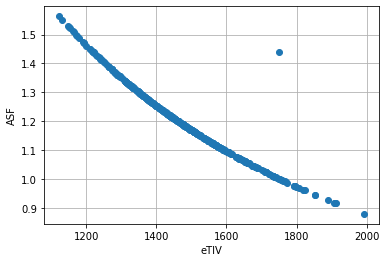

In [26]:
# TODO - Save values from columns 'PRICE', 'LSTAT', 'DIS', 'RM', 'INDUS' into df1 from df - 5 points
df1= df[['Age','CDR']]

# TODO - Remove nan values from df1 and save into df2 - 5 points
df2= df1.dropna()

# Check the shape of df2. It should be (506,5)
print(df2.shape)
print(df2)

x = df[['eTIV']]
y = df[['ASF']]
plt.plot(x,y,'o')
plt.xlabel('eTIV')
plt.ylabel('ASF')
plt.grid(True)

In [41]:
from sklearn.linear_model import LinearRegression

df1 = df[['M/F', 'Age', 'Educ', 'SES', 'MMSE', 'CDR', 'eTIV', 'nWBV', 'ASF']]
df2 = df1.dropna()

x = df2[['Age', 'Educ', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF']]
y = df2[['CDR']]
reg = LinearRegression().fit(x, y)
print(reg.score(x,y))
print(reg.coef_)
print(reg.intercept_)

validationcosts = []
traincosts = []
for d in range(1,10):
    thetas = np.polyfit(X_tr, y_tr, d)
    yhatTrain = np.polyval(thetas, X_tr)
    yhatVal = np.polyval(thetas, X_val)
    costTrain = (.5)*np.mean((yhatTrain - y_tr)**2)
    costVal = (.5)*np.mean((yhatVal - y_tr)**2)
    traincosts.append(costTrain)
    validationcosts.append(costVal)

#reg.predict

     Age  Educ  SES  MMSE  eTIV   nWBV    ASF
0     74   2.0  3.0  29.0  1344  0.743  1.306
1     55   4.0  1.0  29.0  1147  0.810  1.531
2     73   4.0  3.0  27.0  1454  0.708  1.207
8     74   5.0  2.0  30.0  1636  0.689  1.073
9     52   3.0  2.0  30.0  1321  0.827  1.329
..   ...   ...  ...   ...   ...    ...    ...
411   70   1.0  4.0  29.0  1295  0.748  1.355
412   73   3.0  2.0  23.0  1536  0.730  1.142
413   61   2.0  4.0  28.0  1354  0.825  1.297
414   61   5.0  2.0  30.0  1637  0.780  1.072
415   62   3.0  3.0  26.0  1372  0.766  1.279

[216 rows x 7 columns]
     CDR
0    0.0
1    0.0
2    0.5
8    0.0
9    0.0
..   ...
411  0.5
412  0.5
413  0.0
414  0.0
415  0.0

[216 rows x 1 columns]
0.6296513062193055
[[-1.19914127e-03 -7.58467416e-04  4.07664779e-03 -7.76937194e-02
  -2.56521833e-04 -1.37630398e+00 -5.43411387e-01]]
[4.53216736]


In [40]:
# TODO - Create a vector y having the values of 'PRICE' column and matrix x having the values of
# LSTAT', 'DIS', 'RM' and 'INDUS' columns - 5 points
x = np.array(df2[['LSTAT', 'DIS', 'RM', 'INDUS']])
y = np.array(df2['PRICE'])

# Check the shape of x and y vectors.
print(x.shape)
print(y.shape)

KeyError: "None of [Index(['LSTAT', 'DIS', 'RM', 'INDUS'], dtype='object')] are in the [columns]"

Reshape y to be rank 2. After checking the shape of x and y in the above code cell, we see that x is already rank 2 and y are rank 1 matrix. Before moving ahead, convert y to be rank 2 matrix. For example, I would use the command y=y.reshape(y.shape[0],1) to reshape.

In [5]:
# TODO - Reshape y into a rank 2 matrix - 5 points
y = y.reshape(y.shape[0],1)
print(y.shape)

(506, 1)


Calculating the value of n i.e. number of training examples. 
Hint: Value of n is equal to the number of rows in either x or y matrix which can be accessed using numpy shape command.

In [6]:
# TODO - Save number of training examples into n and print it - 5 points
n = y.shape[0]
print(n)

506


In [7]:
# TODO - Append a column of ones in x. Use hstack - 5 points
a = np.ones((n,1))
x=np.hstack((a,x))
print(x)

# Shape of x should be (506,5)
print(x.shape)

[[ 1.      4.98    4.09    6.575   2.31  ]
 [ 1.      9.14    4.9671  6.421   7.07  ]
 [ 1.      4.03    4.9671  7.185   7.07  ]
 ...
 [ 1.      5.64    2.1675  6.976  11.93  ]
 [ 1.      6.48    2.3889  6.794  11.93  ]
 [ 1.      7.88    2.505   6.03   11.93  ]]
(506, 5)


# Cost Function.
Compute the cost: Write the code to compute the cost inside the function. Do not change the function name or function parameters.

In [8]:
def compute_cost(x, y, w, n):
    # Write your code in place of None. Cost can be calculated using a single line of code.
    # Remember w is a vector here.
    
    # TODO - Write the cost function - 10 points
    cost=.5*np.mean((np.dot(x,w)-y)**2)
    
    return cost

Before moving ahead, ensure that the code you have written to compute the cost is correct. Just run the below cell.

In [9]:
w_testcase=np.zeros((5,1))
cost_verify= compute_cost(x, y, w_testcase, n)
print(cost_verify)

296.0734584980237


Your output should be equal to 296.073458498. If it's equal to this, then move ahead. Else, re-check your code and re-verify.

# Gradient Descent
Write the code to perform gradient descent in the function below

In [10]:
def gradient_descent(x , y , learning_rate , w , n , num_iters):
    # In place of None, write the updated value of w0 in temp0 and of w1 in temp1
    # TODO - Finish the gradient descent function - 10 points
    for i in range(num_iters):
        # derivative vector is given by : X_train.Transpose *  (( X_train * w)- y )
        temp =  w - learning_rate * ((np.dot(x.T,(np.dot(x,w) - y)))/n)
        w = temp
       
        
        if(i%100==0):
            # In place of None, call the cost you just coded above
            cost= compute_cost(x,y,w,n)
            print("Cost")
            print(cost)
             
    return w      

Before moving ahead, ensure that your code to update w is correct. Run the code cell below.

In [11]:
w_testcase=np.zeros((5,1))
g=gradient_descent(x , y , 0.0049 , w_testcase , n , 100000)
print(g[0])

[[-0.11041075]
 [-1.16011043]
 [-0.44268376]
 [-0.71586557]
 [-1.08036362]]
Cost
267.23946864871743
[[0.05128969]
 [1.30452604]
 [0.08520161]
 [0.27530119]
 [1.10818099]]
[[-0.10037814]
 [-1.09290577]
 [-0.38953445]
 [-0.64878795]
 [-1.01787418]]
[[0.0506424 ]
 [1.21375093]
 [0.10214993]
 [0.27660781]
 [1.03090435]]
[[-0.0915326 ]
 [-1.02911228]
 [-0.3441127 ]
 [-0.58993132]
 [-0.95765425]]
[[0.04954606]
 [1.1296756 ]
 [0.11411309]
 [0.27429062]
 [0.96013076]]
[[-0.08369986]
 [-0.96860061]
 [-0.30513201]
 [-0.53806444]
 [-0.89995849]]
[[0.04811812]
 [1.05178064]
 [0.12212423]
 [0.26921849]
 [0.89508839]]
[[-0.07673472]
 [-0.91124665]
 [-0.27153509]
 [-0.49216245]
 [-0.84493688]]
[[0.04645235]
 [0.97958409]
 [0.12701802]
 [0.26208944]
 [0.83513328]]
[[-0.07051585]
 [-0.85692947]
 [-0.2424517 ]
 [-0.45137033]
 [-0.79266048]]
[[0.04462335]
 [0.91264042]
 [0.12946806]
 [0.25346262]
 [0.77972427]]
[[-0.0649416 ]
 [-0.80552996]
 [-0.21716438]
 [-0.41497303]
 [-0.74314141]]
[[0.04269016]
 [0.

[[-1.68444233e-04]
 [ 1.22093995e-06]
 [ 2.47989208e-05]
 [-1.05191947e-06]
 [ 5.56239406e-06]]
[[-1.68426856e-04]
 [ 1.22218258e-06]
 [ 2.46515428e-05]
 [-9.07251267e-07]
 [ 5.52976082e-06]]
[[-1.68409574e-04]
 [ 1.22341632e-06]
 [ 2.45051952e-05]
 [-7.63598147e-07]
 [ 5.49735576e-06]]
[[-1.68392388e-04]
 [ 1.22464119e-06]
 [ 2.43598708e-05]
 [-6.20953030e-07]
 [ 5.46517723e-06]]
[[-1.68375296e-04]
 [ 1.22585730e-06]
 [ 2.42155624e-05]
 [-4.79308843e-07]
 [ 5.43322369e-06]]
[[-1.68358297e-04]
 [ 1.22706467e-06]
 [ 2.40722631e-05]
 [-3.38658605e-07]
 [ 5.40149353e-06]]
[[-1.68341392e-04]
 [ 1.22826339e-06]
 [ 2.39299656e-05]
 [-1.98995342e-07]
 [ 5.36998523e-06]]
[[-1.68324580e-04]
 [ 1.22945348e-06]
 [ 2.37886630e-05]
 [-6.03121681e-08]
 [ 5.33869718e-06]]
[[-1.68307859e-04]
 [ 1.23063506e-06]
 [ 2.36483483e-05]
 [ 7.73977899e-08]
 [ 5.30762789e-06]]
[[-1.68291230e-04]
 [ 1.23180813e-06]
 [ 2.35090146e-05]
 [ 2.14141325e-07]
 [ 5.27677580e-06]]
[[-1.68274691e-04]
 [ 1.23297280e-06]
 [

 [ 9.03304085e-07]]
[[-1.63606782e-04]
 [ 1.37795775e-06]
 [ 3.76146981e-06]
 [ 1.92670672e-05]
 [ 9.03155360e-07]]
[[-1.63603099e-04]
 [ 1.37793217e-06]
 [ 3.76080923e-06]
 [ 1.92672082e-05]
 [ 9.03007538e-07]]
[[-1.63599416e-04]
 [ 1.37790655e-06]
 [ 3.76015270e-06]
 [ 1.92673453e-05]
 [ 9.02860613e-07]]
[[-1.63595733e-04]
 [ 1.37788090e-06]
 [ 3.75950020e-06]
 [ 1.92674785e-05]
 [ 9.02714580e-07]]
[[-1.63592051e-04]
 [ 1.37785522e-06]
 [ 3.75885169e-06]
 [ 1.92676077e-05]
 [ 9.02569431e-07]]
[[-1.63588369e-04]
 [ 1.37782950e-06]
 [ 3.75820715e-06]
 [ 1.92677330e-05]
 [ 9.02425160e-07]]
[[-1.63584688e-04]
 [ 1.37780375e-06]
 [ 3.75756655e-06]
 [ 1.92678544e-05]
 [ 9.02281762e-07]]
[[-1.63581007e-04]
 [ 1.37777796e-06]
 [ 3.75692986e-06]
 [ 1.92679720e-05]
 [ 9.02139230e-07]]
[[-1.63577327e-04]
 [ 1.37775215e-06]
 [ 3.75629706e-06]
 [ 1.92680858e-05]
 [ 9.01997559e-07]]
[[-1.63573647e-04]
 [ 1.37772630e-06]
 [ 3.75566812e-06]
 [ 1.92681958e-05]
 [ 9.01856741e-07]]
[[-1.63569967e-04]
 

[[-1.60546261e-04]
 [ 1.35294475e-06]
 [ 3.61027635e-06]
 [ 1.89873306e-05]
 [ 8.68366882e-07]]
[[-1.60542698e-04]
 [ 1.35291475e-06]
 [ 3.61019476e-06]
 [ 1.89869108e-05]
 [ 8.68347287e-07]]
[[-1.60539136e-04]
 [ 1.35288474e-06]
 [ 3.61011318e-06]
 [ 1.89864910e-05]
 [ 8.68327693e-07]]
[[-1.60535574e-04]
 [ 1.35285474e-06]
 [ 3.61003162e-06]
 [ 1.89860712e-05]
 [ 8.68308103e-07]]
[[-1.60532012e-04]
 [ 1.35282474e-06]
 [ 3.60995006e-06]
 [ 1.89856514e-05]
 [ 8.68288515e-07]]
[[-1.60528451e-04]
 [ 1.35279474e-06]
 [ 3.60986852e-06]
 [ 1.89852316e-05]
 [ 8.68268930e-07]]
[[-1.60524889e-04]
 [ 1.35276473e-06]
 [ 3.60978699e-06]
 [ 1.89848118e-05]
 [ 8.68249347e-07]]
[[-1.60521327e-04]
 [ 1.35273473e-06]
 [ 3.60970548e-06]
 [ 1.89843920e-05]
 [ 8.68229768e-07]]
[[-1.60517766e-04]
 [ 1.35270473e-06]
 [ 3.60962397e-06]
 [ 1.89839721e-05]
 [ 8.68210190e-07]]
[[-1.60514204e-04]
 [ 1.35267473e-06]
 [ 3.60954248e-06]
 [ 1.89835523e-05]
 [ 8.68190616e-07]]
[[-1.60510643e-04]
 [ 1.35264473e-06]
 [

 [ 8.53327308e-07]]
[[-1.57770732e-04]
 [ 1.32955697e-06]
 [ 3.54765329e-06]
 [ 1.86592852e-05]
 [ 8.53308374e-07]]
[[-1.57767231e-04]
 [ 1.32952747e-06]
 [ 3.54757457e-06]
 [ 1.86588712e-05]
 [ 8.53289440e-07]]
[[-1.57763731e-04]
 [ 1.32949798e-06]
 [ 3.54749585e-06]
 [ 1.86584572e-05]
 [ 8.53270507e-07]]
[[-1.57760231e-04]
 [ 1.32946848e-06]
 [ 3.54741714e-06]
 [ 1.86580432e-05]
 [ 8.53251575e-07]]
[[-1.57756731e-04]
 [ 1.32943898e-06]
 [ 3.54733843e-06]
 [ 1.86576293e-05]
 [ 8.53232642e-07]]
[[-1.57753230e-04]
 [ 1.32940949e-06]
 [ 3.54725972e-06]
 [ 1.86572153e-05]
 [ 8.53213711e-07]]
[[-1.57749730e-04]
 [ 1.32937999e-06]
 [ 3.54718101e-06]
 [ 1.86568014e-05]
 [ 8.53194779e-07]]
[[-1.57746230e-04]
 [ 1.32935050e-06]
 [ 3.54710230e-06]
 [ 1.86563875e-05]
 [ 8.53175848e-07]]
[[-1.57742731e-04]
 [ 1.32932100e-06]
 [ 3.54702360e-06]
 [ 1.86559735e-05]
 [ 8.53156918e-07]]
[[-1.57739231e-04]
 [ 1.32929151e-06]
 [ 3.54694490e-06]
 [ 1.86555596e-05]
 [ 8.53137987e-07]]
[[-1.57735731e-04]
 

[[-1.54699590e-04]
 [ 1.30367603e-06]
 [ 3.47859436e-06]
 [ 1.82960671e-05]
 [ 8.36697817e-07]]
[[-1.54696158e-04]
 [ 1.30364710e-06]
 [ 3.47851718e-06]
 [ 1.82956612e-05]
 [ 8.36679252e-07]]
[[-1.54692726e-04]
 [ 1.30361818e-06]
 [ 3.47844001e-06]
 [ 1.82952553e-05]
 [ 8.36660689e-07]]
[[-1.54689294e-04]
 [ 1.30358925e-06]
 [ 3.47836283e-06]
 [ 1.82948494e-05]
 [ 8.36642125e-07]]
Cost
14.457059952293207
[[-1.54685862e-04]
 [ 1.30356033e-06]
 [ 3.47828566e-06]
 [ 1.82944435e-05]
 [ 8.36623564e-07]]
[[-1.54682430e-04]
 [ 1.30353141e-06]
 [ 3.47820848e-06]
 [ 1.82940376e-05]
 [ 8.36605001e-07]]
[[-1.54678998e-04]
 [ 1.30350249e-06]
 [ 3.47813131e-06]
 [ 1.82936317e-05]
 [ 8.36586440e-07]]
[[-1.54675566e-04]
 [ 1.30347357e-06]
 [ 3.47805414e-06]
 [ 1.82932258e-05]
 [ 8.36567878e-07]]
[[-1.54672134e-04]
 [ 1.30344465e-06]
 [ 3.47797698e-06]
 [ 1.82928199e-05]
 [ 8.36549318e-07]]
[[-1.54668702e-04]
 [ 1.30341573e-06]
 [ 3.47789981e-06]
 [ 1.82924141e-05]
 [ 8.36530757e-07]]
[[-1.54665271e-0

 [ 8.23949690e-07]]
[[-1.52339171e-04]
 [ 1.28378443e-06]
 [ 3.42551767e-06]
 [ 1.80169042e-05]
 [ 8.23931410e-07]]
[[-1.52335791e-04]
 [ 1.28375594e-06]
 [ 3.42544167e-06]
 [ 1.80165045e-05]
 [ 8.23913129e-07]]
[[-1.52332411e-04]
 [ 1.28372746e-06]
 [ 3.42536567e-06]
 [ 1.80161047e-05]
 [ 8.23894850e-07]]
[[-1.52329031e-04]
 [ 1.28369898e-06]
 [ 3.42528967e-06]
 [ 1.80157050e-05]
 [ 8.23876569e-07]]
[[-1.52325652e-04]
 [ 1.28367050e-06]
 [ 3.42521368e-06]
 [ 1.80153053e-05]
 [ 8.23858290e-07]]
[[-1.52322272e-04]
 [ 1.28364202e-06]
 [ 3.42513768e-06]
 [ 1.80149056e-05]
 [ 8.23840011e-07]]
[[-1.52318893e-04]
 [ 1.28361354e-06]
 [ 3.42506169e-06]
 [ 1.80145059e-05]
 [ 8.23821733e-07]]
[[-1.52315513e-04]
 [ 1.28358506e-06]
 [ 3.42498570e-06]
 [ 1.80141062e-05]
 [ 8.23803454e-07]]
[[-1.52312134e-04]
 [ 1.28355658e-06]
 [ 3.42490971e-06]
 [ 1.80137065e-05]
 [ 8.23785177e-07]]
[[-1.52308754e-04]
 [ 1.28352810e-06]
 [ 3.42483372e-06]
 [ 1.80133069e-05]
 [ 8.23766900e-07]]
[[-1.52305375e-04]
 

 [ 8.07140392e-07]]
[[-1.49231318e-04]
 [ 1.25759410e-06]
 [ 3.35563410e-06]
 [ 1.76493435e-05]
 [ 8.07122485e-07]]
[[-1.49228007e-04]
 [ 1.25756619e-06]
 [ 3.35555965e-06]
 [ 1.76489519e-05]
 [ 8.07104576e-07]]
[[-1.49224696e-04]
 [ 1.25753829e-06]
 [ 3.35548520e-06]
 [ 1.76485604e-05]
 [ 8.07086671e-07]]
[[-1.49221385e-04]
 [ 1.25751039e-06]
 [ 3.35541075e-06]
 [ 1.76481688e-05]
 [ 8.07068762e-07]]
[[-1.49218075e-04]
 [ 1.25748249e-06]
 [ 3.35533631e-06]
 [ 1.76477772e-05]
 [ 8.07050857e-07]]
[[-1.49214764e-04]
 [ 1.25745459e-06]
 [ 3.35526186e-06]
 [ 1.76473857e-05]
 [ 8.07032950e-07]]
[[-1.49211453e-04]
 [ 1.25742669e-06]
 [ 3.35518742e-06]
 [ 1.76469942e-05]
 [ 8.07015045e-07]]
[[-1.49208143e-04]
 [ 1.25739879e-06]
 [ 3.35511298e-06]
 [ 1.76466026e-05]
 [ 8.06997140e-07]]
[[-1.49204832e-04]
 [ 1.25737090e-06]
 [ 3.35503854e-06]
 [ 1.76462111e-05]
 [ 8.06979235e-07]]
[[-1.49201522e-04]
 [ 1.25734300e-06]
 [ 3.35496410e-06]
 [ 1.76458196e-05]
 [ 8.06961331e-07]]
[[-1.49198212e-04]
 

[[-1.46820714e-04]
 [ 1.23727959e-06]
 [ 3.30142897e-06]
 [ 1.73642454e-05]
 [ 7.94084655e-07]]
[[-1.46817457e-04]
 [ 1.23725214e-06]
 [ 3.30135572e-06]
 [ 1.73638601e-05]
 [ 7.94067038e-07]]
[[-1.46814199e-04]
 [ 1.23722468e-06]
 [ 3.30128247e-06]
 [ 1.73634749e-05]
 [ 7.94049419e-07]]
[[-1.46810942e-04]
 [ 1.23719723e-06]
 [ 3.30120923e-06]
 [ 1.73630896e-05]
 [ 7.94031803e-07]]
[[-1.46807685e-04]
 [ 1.23716978e-06]
 [ 3.30113598e-06]
 [ 1.73627044e-05]
 [ 7.94014184e-07]]
[[-1.46804428e-04]
 [ 1.23714234e-06]
 [ 3.30106274e-06]
 [ 1.73623192e-05]
 [ 7.93996569e-07]]
[[-1.46801171e-04]
 [ 1.23711489e-06]
 [ 3.30098950e-06]
 [ 1.73619340e-05]
 [ 7.93978951e-07]]
[[-1.46797913e-04]
 [ 1.23708744e-06]
 [ 3.30091626e-06]
 [ 1.73615488e-05]
 [ 7.93961337e-07]]
[[-1.46794656e-04]
 [ 1.23705999e-06]
 [ 3.30084303e-06]
 [ 1.73611636e-05]
 [ 7.93943720e-07]]
[[-1.46791400e-04]
 [ 1.23703255e-06]
 [ 3.30076979e-06]
 [ 1.73607784e-05]
 [ 7.93926106e-07]]
[[-1.46788143e-04]
 [ 1.23700510e-06]
 [

 [ 7.80650983e-07]]
[[-1.44333720e-04]
 [ 1.21632132e-06]
 [ 3.24550609e-06]
 [ 1.70701126e-05]
 [ 7.80633663e-07]]
[[-1.44330517e-04]
 [ 1.21629433e-06]
 [ 3.24543409e-06]
 [ 1.70697339e-05]
 [ 7.80616343e-07]]
[[-1.44327315e-04]
 [ 1.21626735e-06]
 [ 3.24536208e-06]
 [ 1.70693551e-05]
 [ 7.80599024e-07]]
[[-1.44324113e-04]
 [ 1.21624036e-06]
 [ 3.24529007e-06]
 [ 1.70689764e-05]
 [ 7.80581705e-07]]
[[-1.44320911e-04]
 [ 1.21621338e-06]
 [ 3.24521807e-06]
 [ 1.70685977e-05]
 [ 7.80564386e-07]]
[[-1.44317709e-04]
 [ 1.21618639e-06]
 [ 3.24514607e-06]
 [ 1.70682190e-05]
 [ 7.80547068e-07]]
[[-1.44314507e-04]
 [ 1.21615941e-06]
 [ 3.24507407e-06]
 [ 1.70678403e-05]
 [ 7.80529750e-07]]
[[-1.44311305e-04]
 [ 1.21613243e-06]
 [ 3.24500207e-06]
 [ 1.70674616e-05]
 [ 7.80512432e-07]]
[[-1.44308103e-04]
 [ 1.21610544e-06]
 [ 3.24493008e-06]
 [ 1.70670830e-05]
 [ 7.80495115e-07]]
[[-1.44304901e-04]
 [ 1.21607846e-06]
 [ 3.24485808e-06]
 [ 1.70667043e-05]
 [ 7.80477799e-07]]
[[-1.44301700e-04]
 

[[-1.42002229e-04]
 [ 1.19667351e-06]
 [ 3.19307991e-06]
 [ 1.67943710e-05]
 [ 7.68023721e-07]]
[[-1.41999079e-04]
 [ 1.19664696e-06]
 [ 3.19300906e-06]
 [ 1.67939984e-05]
 [ 7.68006680e-07]]
[[-1.41995928e-04]
 [ 1.19662041e-06]
 [ 3.19293822e-06]
 [ 1.67936258e-05]
 [ 7.67989642e-07]]
[[-1.41992778e-04]
 [ 1.19659386e-06]
 [ 3.19286738e-06]
 [ 1.67932532e-05]
 [ 7.67972601e-07]]
[[-1.41989627e-04]
 [ 1.19656731e-06]
 [ 3.19279654e-06]
 [ 1.67928806e-05]
 [ 7.67955563e-07]]
[[-1.41986477e-04]
 [ 1.19654076e-06]
 [ 3.19272570e-06]
 [ 1.67925081e-05]
 [ 7.67938524e-07]]
[[-1.41983327e-04]
 [ 1.19651422e-06]
 [ 3.19265486e-06]
 [ 1.67921355e-05]
 [ 7.67921486e-07]]
[[-1.41980177e-04]
 [ 1.19648767e-06]
 [ 3.19258403e-06]
 [ 1.67917629e-05]
 [ 7.67904448e-07]]
[[-1.41977027e-04]
 [ 1.19646112e-06]
 [ 3.19251320e-06]
 [ 1.67913904e-05]
 [ 7.67887411e-07]]
[[-1.41973877e-04]
 [ 1.19643458e-06]
 [ 3.19244236e-06]
 [ 1.67910178e-05]
 [ 7.67870373e-07]]
[[-1.41970727e-04]
 [ 1.19640803e-06]
 [

[[-1.39142300e-04]
 [ 1.17257247e-06]
 [ 3.12877118e-06]
 [ 1.64561319e-05]
 [ 7.52555700e-07]]
[[-1.39139213e-04]
 [ 1.17254645e-06]
 [ 3.12870176e-06]
 [ 1.64557668e-05]
 [ 7.52539002e-07]]
[[-1.39136126e-04]
 [ 1.17252044e-06]
 [ 3.12863235e-06]
 [ 1.64554017e-05]
 [ 7.52522306e-07]]
[[-1.39133039e-04]
 [ 1.17249442e-06]
 [ 3.12856293e-06]
 [ 1.64550366e-05]
 [ 7.52505610e-07]]
[[-1.39129952e-04]
 [ 1.17246841e-06]
 [ 3.12849352e-06]
 [ 1.64546715e-05]
 [ 7.52488915e-07]]
[[-1.39126865e-04]
 [ 1.17244239e-06]
 [ 3.12842411e-06]
 [ 1.64543064e-05]
 [ 7.52472219e-07]]
[[-1.39123778e-04]
 [ 1.17241638e-06]
 [ 3.12835470e-06]
 [ 1.64539414e-05]
 [ 7.52455524e-07]]
[[-1.39120692e-04]
 [ 1.17239037e-06]
 [ 3.12828529e-06]
 [ 1.64535763e-05]
 [ 7.52438829e-07]]
[[-1.39117605e-04]
 [ 1.17236436e-06]
 [ 3.12821588e-06]
 [ 1.64532112e-05]
 [ 7.52422135e-07]]
[[-1.39114518e-04]
 [ 1.17233835e-06]
 [ 3.12814648e-06]
 [ 1.64528462e-05]
 [ 7.52405441e-07]]
[[-1.39111432e-04]
 [ 1.17231234e-06]
 [

[[-1.36603399e-04]
 [ 1.15117677e-06]
 [ 3.07168112e-06]
 [ 1.61558602e-05]
 [ 7.38823967e-07]]
[[-1.36600368e-04]
 [ 1.15115123e-06]
 [ 3.07161297e-06]
 [ 1.61555017e-05]
 [ 7.38807576e-07]]
[[-1.36597337e-04]
 [ 1.15112569e-06]
 [ 3.07154482e-06]
 [ 1.61551433e-05]
 [ 7.38791183e-07]]
[[-1.36594306e-04]
 [ 1.15110015e-06]
 [ 3.07147668e-06]
 [ 1.61547849e-05]
 [ 7.38774792e-07]]
[[-1.36591276e-04]
 [ 1.15107461e-06]
 [ 3.07140853e-06]
 [ 1.61544264e-05]
 [ 7.38758400e-07]]
[[-1.36588245e-04]
 [ 1.15104908e-06]
 [ 3.07134038e-06]
 [ 1.61540680e-05]
 [ 7.38742011e-07]]
[[-1.36585215e-04]
 [ 1.15102354e-06]
 [ 3.07127224e-06]
 [ 1.61537096e-05]
 [ 7.38725619e-07]]
[[-1.36582184e-04]
 [ 1.15099800e-06]
 [ 3.07120410e-06]
 [ 1.61533512e-05]
 [ 7.38709230e-07]]
[[-1.36579154e-04]
 [ 1.15097246e-06]
 [ 3.07113596e-06]
 [ 1.61529928e-05]
 [ 7.38692839e-07]]
[[-1.36576124e-04]
 [ 1.15094693e-06]
 [ 3.07106782e-06]
 [ 1.61526344e-05]
 [ 7.38676451e-07]]
[[-1.36573093e-04]
 [ 1.15092139e-06]
 [

 [ 7.24844075e-07]]
[[-1.34015640e-04]
 [ 1.12936936e-06]
 [ 3.01349247e-06]
 [ 1.58498103e-05]
 [ 7.24827993e-07]]
[[-1.34012667e-04]
 [ 1.12934430e-06]
 [ 3.01342561e-06]
 [ 1.58494586e-05]
 [ 7.24811911e-07]]
[[-1.34009694e-04]
 [ 1.12931925e-06]
 [ 3.01335875e-06]
 [ 1.58491070e-05]
 [ 7.24795830e-07]]
[[-1.34006720e-04]
 [ 1.12929419e-06]
 [ 3.01329190e-06]
 [ 1.58487553e-05]
 [ 7.24779749e-07]]
[[-1.34003747e-04]
 [ 1.12926913e-06]
 [ 3.01322504e-06]
 [ 1.58484037e-05]
 [ 7.24763668e-07]]
[[-1.34000774e-04]
 [ 1.12924408e-06]
 [ 3.01315819e-06]
 [ 1.58480521e-05]
 [ 7.24747588e-07]]
[[-1.33997801e-04]
 [ 1.12921902e-06]
 [ 3.01309133e-06]
 [ 1.58477004e-05]
 [ 7.24731508e-07]]
[[-1.33994828e-04]
 [ 1.12919397e-06]
 [ 3.01302448e-06]
 [ 1.58473488e-05]
 [ 7.24715428e-07]]
[[-1.33991855e-04]
 [ 1.12916892e-06]
 [ 3.01295763e-06]
 [ 1.58469972e-05]
 [ 7.24699349e-07]]
[[-1.33988882e-04]
 [ 1.12914386e-06]
 [ 3.01289079e-06]
 [ 1.58466456e-05]
 [ 7.24683270e-07]]
[[-1.33985910e-04]
 

 [ 7.10387533e-07]]
[[-1.31342786e-04]
 [ 1.10684482e-06]
 [ 2.95339033e-06]
 [ 1.55336961e-05]
 [ 7.10371770e-07]]
[[-1.31339872e-04]
 [ 1.10682027e-06]
 [ 2.95332480e-06]
 [ 1.55333515e-05]
 [ 7.10356011e-07]]
[[-1.31336958e-04]
 [ 1.10679571e-06]
 [ 2.95325928e-06]
 [ 1.55330069e-05]
 [ 7.10340248e-07]]
[[-1.31334044e-04]
 [ 1.10677115e-06]
 [ 2.95319375e-06]
 [ 1.55326622e-05]
 [ 7.10324490e-07]]
[[-1.31331130e-04]
 [ 1.10674660e-06]
 [ 2.95312823e-06]
 [ 1.55323176e-05]
 [ 7.10308729e-07]]
[[-1.31328216e-04]
 [ 1.10672204e-06]
 [ 2.95306271e-06]
 [ 1.55319730e-05]
 [ 7.10292970e-07]]
[[-1.31325302e-04]
 [ 1.10669749e-06]
 [ 2.95299719e-06]
 [ 1.55316284e-05]
 [ 7.10277210e-07]]
[[-1.31322389e-04]
 [ 1.10667293e-06]
 [ 2.95293167e-06]
 [ 1.55312838e-05]
 [ 7.10261452e-07]]
[[-1.31319475e-04]
 [ 1.10664838e-06]
 [ 2.95286616e-06]
 [ 1.55309392e-05]
 [ 7.10245693e-07]]
[[-1.31316561e-04]
 [ 1.10662383e-06]
 [ 2.95280064e-06]
 [ 1.55305946e-05]
 [ 7.10229935e-07]]
[[-1.31313648e-04]
 

 [ 6.97347868e-07]]
[[-1.28931897e-04]
 [ 1.08652791e-06]
 [ 2.89917877e-06]
 [ 1.52485642e-05]
 [ 6.97332397e-07]]
[[-1.28929036e-04]
 [ 1.08650380e-06]
 [ 2.89911445e-06]
 [ 1.52482259e-05]
 [ 6.97316925e-07]]
[[-1.28926175e-04]
 [ 1.08647970e-06]
 [ 2.89905012e-06]
 [ 1.52478876e-05]
 [ 6.97301454e-07]]
[[-1.28923315e-04]
 [ 1.08645559e-06]
 [ 2.89898580e-06]
 [ 1.52475493e-05]
 [ 6.97285982e-07]]
[[-1.28920455e-04]
 [ 1.08643148e-06]
 [ 2.89892148e-06]
 [ 1.52472110e-05]
 [ 6.97270513e-07]]
[[-1.28917594e-04]
 [ 1.08640738e-06]
 [ 2.89885716e-06]
 [ 1.52468727e-05]
 [ 6.97255042e-07]]
[[-1.28914734e-04]
 [ 1.08638328e-06]
 [ 2.89879285e-06]
 [ 1.52465344e-05]
 [ 6.97239572e-07]]
[[-1.28911874e-04]
 [ 1.08635917e-06]
 [ 2.89872853e-06]
 [ 1.52461961e-05]
 [ 6.97224102e-07]]
[[-1.28909014e-04]
 [ 1.08633507e-06]
 [ 2.89866422e-06]
 [ 1.52458579e-05]
 [ 6.97208634e-07]]
[[-1.28906153e-04]
 [ 1.08631097e-06]
 [ 2.89859991e-06]
 [ 1.52455196e-05]
 [ 6.97193164e-07]]
[[-1.28903293e-04]
 

 [ 6.85353003e-07]]
[[-1.26714179e-04]
 [ 1.06783888e-06]
 [ 2.84931089e-06]
 [ 1.49862784e-05]
 [ 6.85337797e-07]]
[[-1.26711367e-04]
 [ 1.06781518e-06]
 [ 2.84924767e-06]
 [ 1.49859459e-05]
 [ 6.85322592e-07]]
[[-1.26708556e-04]
 [ 1.06779149e-06]
 [ 2.84918446e-06]
 [ 1.49856134e-05]
 [ 6.85307387e-07]]
[[-1.26705745e-04]
 [ 1.06776780e-06]
 [ 2.84912124e-06]
 [ 1.49852809e-05]
 [ 6.85292182e-07]]
[[-1.26702934e-04]
 [ 1.06774411e-06]
 [ 2.84905803e-06]
 [ 1.49849484e-05]
 [ 6.85276977e-07]]
[[-1.26700122e-04]
 [ 1.06772042e-06]
 [ 2.84899482e-06]
 [ 1.49846159e-05]
 [ 6.85261773e-07]]
[[-1.26697311e-04]
 [ 1.06769673e-06]
 [ 2.84893161e-06]
 [ 1.49842835e-05]
 [ 6.85246569e-07]]
[[-1.26694500e-04]
 [ 1.06767304e-06]
 [ 2.84886840e-06]
 [ 1.49839510e-05]
 [ 6.85231366e-07]]
[[-1.26691689e-04]
 [ 1.06764935e-06]
 [ 2.84880519e-06]
 [ 1.49836186e-05]
 [ 6.85216162e-07]]
[[-1.26688878e-04]
 [ 1.06762567e-06]
 [ 2.84874198e-06]
 [ 1.49832861e-05]
 [ 6.85200960e-07]]
Cost
14.420297451292

[[-1.24002476e-04]
 [ 1.04498696e-06]
 [ 2.78833519e-06]
 [ 1.46655697e-05]
 [ 6.70671461e-07]]
[[-1.23999724e-04]
 [ 1.04496377e-06]
 [ 2.78827333e-06]
 [ 1.46652443e-05]
 [ 6.70656581e-07]]
[[-1.23996973e-04]
 [ 1.04494059e-06]
 [ 2.78821146e-06]
 [ 1.46649189e-05]
 [ 6.70641701e-07]]
[[-1.23994222e-04]
 [ 1.04491740e-06]
 [ 2.78814960e-06]
 [ 1.46645935e-05]
 [ 6.70626822e-07]]
[[-1.23991471e-04]
 [ 1.04489422e-06]
 [ 2.78808774e-06]
 [ 1.46642682e-05]
 [ 6.70611942e-07]]
[[-1.23988720e-04]
 [ 1.04487104e-06]
 [ 2.78802588e-06]
 [ 1.46639428e-05]
 [ 6.70597064e-07]]
[[-1.23985969e-04]
 [ 1.04484785e-06]
 [ 2.78796402e-06]
 [ 1.46636175e-05]
 [ 6.70582185e-07]]
[[-1.23983218e-04]
 [ 1.04482467e-06]
 [ 2.78790217e-06]
 [ 1.46632921e-05]
 [ 6.70567307e-07]]
[[-1.23980467e-04]
 [ 1.04480149e-06]
 [ 2.78784031e-06]
 [ 1.46629668e-05]
 [ 6.70552430e-07]]
[[-1.23977717e-04]
 [ 1.04477831e-06]
 [ 2.78777846e-06]
 [ 1.46626415e-05]
 [ 6.70537552e-07]]
[[-1.23974966e-04]
 [ 1.04475513e-06]
 [

[[-1.21818183e-04]
 [ 1.02657961e-06]
 [ 2.73921892e-06]
 [ 1.44072370e-05]
 [ 6.58857644e-07]]
[[-1.21815480e-04]
 [ 1.02655683e-06]
 [ 2.73915815e-06]
 [ 1.44069173e-05]
 [ 6.58843027e-07]]
[[-1.21812778e-04]
 [ 1.02653405e-06]
 [ 2.73909737e-06]
 [ 1.44065977e-05]
 [ 6.58828409e-07]]
[[-1.21810075e-04]
 [ 1.02651128e-06]
 [ 2.73903660e-06]
 [ 1.44062780e-05]
 [ 6.58813791e-07]]
[[-1.21807372e-04]
 [ 1.02648850e-06]
 [ 2.73897583e-06]
 [ 1.44059584e-05]
 [ 6.58799174e-07]]
[[-1.21804670e-04]
 [ 1.02646573e-06]
 [ 2.73891506e-06]
 [ 1.44056388e-05]
 [ 6.58784558e-07]]
[[-1.21801968e-04]
 [ 1.02644295e-06]
 [ 2.73885429e-06]
 [ 1.44053192e-05]
 [ 6.58769941e-07]]
[[-1.21799265e-04]
 [ 1.02642018e-06]
 [ 2.73879353e-06]
 [ 1.44049996e-05]
 [ 6.58755325e-07]]
[[-1.21796563e-04]
 [ 1.02639741e-06]
 [ 2.73873276e-06]
 [ 1.44046800e-05]
 [ 6.58740710e-07]]
[[-1.21793860e-04]
 [ 1.02637464e-06]
 [ 2.73867200e-06]
 [ 1.44043604e-05]
 [ 6.58726094e-07]]
[[-1.21791158e-04]
 [ 1.02635186e-06]
 [

[[-1.19975441e-04]
 [ 1.01105055e-06]
 [ 2.69778280e-06]
 [ 1.41892989e-05]
 [ 6.48891116e-07]]
[[-1.19972780e-04]
 [ 1.01102812e-06]
 [ 2.69772294e-06]
 [ 1.41889841e-05]
 [ 6.48876718e-07]]
[[-1.19970118e-04]
 [ 1.01100569e-06]
 [ 2.69766309e-06]
 [ 1.41886693e-05]
 [ 6.48862322e-07]]
[[-1.19967456e-04]
 [ 1.01098326e-06]
 [ 2.69760324e-06]
 [ 1.41883545e-05]
 [ 6.48847926e-07]]
[[-1.19964794e-04]
 [ 1.01096083e-06]
 [ 2.69754339e-06]
 [ 1.41880397e-05]
 [ 6.48833530e-07]]
[[-1.19962133e-04]
 [ 1.01093840e-06]
 [ 2.69748354e-06]
 [ 1.41877249e-05]
 [ 6.48819134e-07]]
[[-1.19959471e-04]
 [ 1.01091597e-06]
 [ 2.69742369e-06]
 [ 1.41874101e-05]
 [ 6.48804739e-07]]
[[-1.19956810e-04]
 [ 1.01089354e-06]
 [ 2.69736384e-06]
 [ 1.41870954e-05]
 [ 6.48790344e-07]]
[[-1.19954148e-04]
 [ 1.01087111e-06]
 [ 2.69730399e-06]
 [ 1.41867806e-05]
 [ 6.48775950e-07]]
[[-1.19951487e-04]
 [ 1.01084868e-06]
 [ 2.69724415e-06]
 [ 1.41864658e-05]
 [ 6.48761555e-07]]
[[-1.19948825e-04]
 [ 1.01082626e-06]
 [

[[-1.17974585e-04]
 [ 9.94189041e-07]
 [ 2.65279128e-06]
 [ 1.39526609e-05]
 [ 6.38069415e-07]]
[[-1.17971967e-04]
 [ 9.94166983e-07]
 [ 2.65273242e-06]
 [ 1.39523513e-05]
 [ 6.38055259e-07]]
[[-1.17969350e-04]
 [ 9.94144925e-07]
 [ 2.65267357e-06]
 [ 1.39520417e-05]
 [ 6.38041102e-07]]
[[-1.17966732e-04]
 [ 9.94122869e-07]
 [ 2.65261471e-06]
 [ 1.39517322e-05]
 [ 6.38026946e-07]]
[[-1.17964115e-04]
 [ 9.94100812e-07]
 [ 2.65255586e-06]
 [ 1.39514226e-05]
 [ 6.38012790e-07]]
[[-1.17961498e-04]
 [ 9.94078756e-07]
 [ 2.65249701e-06]
 [ 1.39511131e-05]
 [ 6.37998635e-07]]
[[-1.17958881e-04]
 [ 9.94056700e-07]
 [ 2.65243816e-06]
 [ 1.39508036e-05]
 [ 6.37984479e-07]]
[[-1.17956263e-04]
 [ 9.94034646e-07]
 [ 2.65237931e-06]
 [ 1.39504941e-05]
 [ 6.37970325e-07]]
[[-1.17953646e-04]
 [ 9.94012591e-07]
 [ 2.65232046e-06]
 [ 1.39501845e-05]
 [ 6.37956170e-07]]
[[-1.17951029e-04]
 [ 9.93990537e-07]
 [ 2.65226161e-06]
 [ 1.39498750e-05]
 [ 6.37942016e-07]]
[[-1.17948412e-04]
 [ 9.93968483e-07]
 [

 [ 6.25163194e-07]]
[[-1.15585750e-04]
 [ 9.74057979e-07]
 [ 2.59907564e-06]
 [ 1.36701373e-05]
 [ 6.25149322e-07]]
[[-1.15583185e-04]
 [ 9.74036369e-07]
 [ 2.59901797e-06]
 [ 1.36698340e-05]
 [ 6.25135453e-07]]
[[-1.15580621e-04]
 [ 9.74014757e-07]
 [ 2.59896031e-06]
 [ 1.36695307e-05]
 [ 6.25121582e-07]]
[[-1.15578056e-04]
 [ 9.73993148e-07]
 [ 2.59890265e-06]
 [ 1.36692274e-05]
 [ 6.25107714e-07]]
[[-1.15575492e-04]
 [ 9.73971537e-07]
 [ 2.59884498e-06]
 [ 1.36689241e-05]
 [ 6.25093844e-07]]
[[-1.15572928e-04]
 [ 9.73949928e-07]
 [ 2.59878732e-06]
 [ 1.36686208e-05]
 [ 6.25079975e-07]]
[[-1.15570364e-04]
 [ 9.73928319e-07]
 [ 2.59872967e-06]
 [ 1.36683176e-05]
 [ 6.25066107e-07]]
[[-1.15567799e-04]
 [ 9.73906711e-07]
 [ 2.59867201e-06]
 [ 1.36680143e-05]
 [ 6.25052239e-07]]
[[-1.15565235e-04]
 [ 9.73885103e-07]
 [ 2.59861435e-06]
 [ 1.36677111e-05]
 [ 6.25038370e-07]]
[[-1.15562671e-04]
 [ 9.73863495e-07]
 [ 2.59855670e-06]
 [ 1.36674078e-05]
 [ 6.25024503e-07]]
[[-1.15560107e-04]
 

 [ 6.14450851e-07]]
[[-1.13605156e-04]
 [ 9.57367230e-07]
 [ 2.55453977e-06]
 [ 1.34358957e-05]
 [ 6.14437218e-07]]
[[-1.13602636e-04]
 [ 9.57345989e-07]
 [ 2.55448309e-06]
 [ 1.34355976e-05]
 [ 6.14423586e-07]]
[[-1.13600115e-04]
 [ 9.57324749e-07]
 [ 2.55442641e-06]
 [ 1.34352995e-05]
 [ 6.14409954e-07]]
[[-1.13597595e-04]
 [ 9.57303509e-07]
 [ 2.55436974e-06]
 [ 1.34350015e-05]
 [ 6.14396322e-07]]
[[-1.13595074e-04]
 [ 9.57282269e-07]
 [ 2.55431307e-06]
 [ 1.34347034e-05]
 [ 6.14382691e-07]]
[[-1.13592554e-04]
 [ 9.57261030e-07]
 [ 2.55425639e-06]
 [ 1.34344053e-05]
 [ 6.14369059e-07]]
[[-1.13590034e-04]
 [ 9.57239791e-07]
 [ 2.55419972e-06]
 [ 1.34341072e-05]
 [ 6.14355428e-07]]
[[-1.13587514e-04]
 [ 9.57218553e-07]
 [ 2.55414305e-06]
 [ 1.34338092e-05]
 [ 6.14341798e-07]]
[[-1.13584993e-04]
 [ 9.57197316e-07]
 [ 2.55408638e-06]
 [ 1.34335111e-05]
 [ 6.14328167e-07]]
[[-1.13582473e-04]
 [ 9.57176078e-07]
 [ 2.55402972e-06]
 [ 1.34332131e-05]
 [ 6.14314537e-07]]
[[-1.13579953e-04]
 

[[-1.11675844e-04]
 [ 9.41108634e-07]
 [ 2.51115701e-06]
 [ 1.32077191e-05]
 [ 6.04002470e-07]]
[[-1.11673366e-04]
 [ 9.41087753e-07]
 [ 2.51110129e-06]
 [ 1.32074261e-05]
 [ 6.03989068e-07]]
[[-1.11670888e-04]
 [ 9.41066874e-07]
 [ 2.51104558e-06]
 [ 1.32071331e-05]
 [ 6.03975668e-07]]
[[-1.11668411e-04]
 [ 9.41045994e-07]
 [ 2.51098987e-06]
 [ 1.32068400e-05]
 [ 6.03962267e-07]]
[[-1.11665933e-04]
 [ 9.41025116e-07]
 [ 2.51093416e-06]
 [ 1.32065470e-05]
 [ 6.03948868e-07]]
[[-1.11663456e-04]
 [ 9.41004237e-07]
 [ 2.51087845e-06]
 [ 1.32062540e-05]
 [ 6.03935468e-07]]
[[-1.11660978e-04]
 [ 9.40983359e-07]
 [ 2.51082274e-06]
 [ 1.32059610e-05]
 [ 6.03922068e-07]]
[[-1.11658501e-04]
 [ 9.40962481e-07]
 [ 2.51076703e-06]
 [ 1.32056680e-05]
 [ 6.03908669e-07]]
[[-1.11656024e-04]
 [ 9.40941604e-07]
 [ 2.51071133e-06]
 [ 1.32053750e-05]
 [ 6.03895270e-07]]
[[-1.11653546e-04]
 [ 9.40920728e-07]
 [ 2.51065562e-06]
 [ 1.32050820e-05]
 [ 6.03881872e-07]]
[[-1.11651069e-04]
 [ 9.40899852e-07]
 [

[[-1.09735463e-04]
 [ 9.24756758e-07]
 [ 2.46752535e-06]
 [ 1.29782334e-05]
 [ 5.93507854e-07]]
[[-1.09733028e-04]
 [ 9.24736241e-07]
 [ 2.46747061e-06]
 [ 1.29779455e-05]
 [ 5.93494686e-07]]
[[-1.09730593e-04]
 [ 9.24715723e-07]
 [ 2.46741586e-06]
 [ 1.29776575e-05]
 [ 5.93481518e-07]]
[[-1.09728159e-04]
 [ 9.24695207e-07]
 [ 2.46736112e-06]
 [ 1.29773696e-05]
 [ 5.93468351e-07]]
[[-1.09725724e-04]
 [ 9.24674691e-07]
 [ 2.46730637e-06]
 [ 1.29770817e-05]
 [ 5.93455183e-07]]
[[-1.09723290e-04]
 [ 9.24654175e-07]
 [ 2.46725163e-06]
 [ 1.29767937e-05]
 [ 5.93442017e-07]]
[[-1.09720855e-04]
 [ 9.24633660e-07]
 [ 2.46719689e-06]
 [ 1.29765058e-05]
 [ 5.93428850e-07]]
[[-1.09718421e-04]
 [ 9.24613145e-07]
 [ 2.46714215e-06]
 [ 1.29762179e-05]
 [ 5.93415683e-07]]
[[-1.09715987e-04]
 [ 9.24592631e-07]
 [ 2.46708741e-06]
 [ 1.29759300e-05]
 [ 5.93402517e-07]]
[[-1.09713552e-04]
 [ 9.24572117e-07]
 [ 2.46703268e-06]
 [ 1.29756421e-05]
 [ 5.93389352e-07]]
[[-1.09711118e-04]
 [ 9.24551604e-07]
 [

[[-1.07943693e-04]
 [ 9.09657252e-07]
 [ 2.42723539e-06]
 [ 1.27663237e-05]
 [ 5.83817008e-07]]
[[-1.07941298e-04]
 [ 9.09637069e-07]
 [ 2.42718154e-06]
 [ 1.27660405e-05]
 [ 5.83804054e-07]]
[[-1.07938903e-04]
 [ 9.09616888e-07]
 [ 2.42712769e-06]
 [ 1.27657572e-05]
 [ 5.83791102e-07]]
[[-1.07936508e-04]
 [ 9.09596705e-07]
 [ 2.42707384e-06]
 [ 1.27654740e-05]
 [ 5.83778149e-07]]
[[-1.07934113e-04]
 [ 9.09576525e-07]
 [ 2.42701999e-06]
 [ 1.27651908e-05]
 [ 5.83765197e-07]]
[[-1.07931719e-04]
 [ 9.09556344e-07]
 [ 2.42696614e-06]
 [ 1.27649076e-05]
 [ 5.83752245e-07]]
[[-1.07929324e-04]
 [ 9.09536164e-07]
 [ 2.42691229e-06]
 [ 1.27646244e-05]
 [ 5.83739294e-07]]
[[-1.07926929e-04]
 [ 9.09515984e-07]
 [ 2.42685845e-06]
 [ 1.27643411e-05]
 [ 5.83726342e-07]]
[[-1.07924535e-04]
 [ 9.09495805e-07]
 [ 2.42680460e-06]
 [ 1.27640579e-05]
 [ 5.83713391e-07]]
[[-1.07922140e-04]
 [ 9.09475625e-07]
 [ 2.42675076e-06]
 [ 1.27637747e-05]
 [ 5.83700440e-07]]
[[-1.07919746e-04]
 [ 9.09455448e-07]
 [

 [ 5.71538765e-07]]
[[-1.05671187e-04]
 [ 8.90506513e-07]
 [ 2.37613554e-06]
 [ 1.24975582e-05]
 [ 5.71526085e-07]]
[[-1.05668842e-04]
 [ 8.90486755e-07]
 [ 2.37608282e-06]
 [ 1.24972809e-05]
 [ 5.71513404e-07]]
[[-1.05666498e-04]
 [ 8.90466999e-07]
 [ 2.37603010e-06]
 [ 1.24970036e-05]
 [ 5.71500725e-07]]
[[-1.05664154e-04]
 [ 8.90447241e-07]
 [ 2.37597739e-06]
 [ 1.24967264e-05]
 [ 5.71488044e-07]]
[[-1.05661809e-04]
 [ 8.90427486e-07]
 [ 2.37592467e-06]
 [ 1.24964491e-05]
 [ 5.71475365e-07]]
[[-1.05659465e-04]
 [ 8.90407729e-07]
 [ 2.37587196e-06]
 [ 1.24961718e-05]
 [ 5.71462686e-07]]
[[-1.05657121e-04]
 [ 8.90387974e-07]
 [ 2.37581924e-06]
 [ 1.24958946e-05]
 [ 5.71450007e-07]]
[[-1.05654776e-04]
 [ 8.90368219e-07]
 [ 2.37576653e-06]
 [ 1.24956173e-05]
 [ 5.71437328e-07]]
[[-1.05652432e-04]
 [ 8.90348465e-07]
 [ 2.37571382e-06]
 [ 1.24953401e-05]
 [ 5.71424650e-07]]
[[-1.05650088e-04]
 [ 8.90328711e-07]
 [ 2.37566111e-06]
 [ 1.24950629e-05]
 [ 5.71411972e-07]]
[[-1.05647744e-04]
 

[[-1.03575133e-04]
 [ 8.72842765e-07]
 [ 2.32900342e-06]
 [ 1.22496614e-05]
 [ 5.60189511e-07]]
[[-1.03572835e-04]
 [ 8.72823399e-07]
 [ 2.32895175e-06]
 [ 1.22493896e-05]
 [ 5.60177082e-07]]
[[-1.03570538e-04]
 [ 8.72804034e-07]
 [ 2.32890008e-06]
 [ 1.22491178e-05]
 [ 5.60164654e-07]]
[[-1.03568240e-04]
 [ 8.72784669e-07]
 [ 2.32884840e-06]
 [ 1.22488460e-05]
 [ 5.60152225e-07]]
[[-1.03565942e-04]
 [ 8.72765305e-07]
 [ 2.32879673e-06]
 [ 1.22485743e-05]
 [ 5.60139798e-07]]
[[-1.03563644e-04]
 [ 8.72745940e-07]
 [ 2.32874507e-06]
 [ 1.22483025e-05]
 [ 5.60127369e-07]]
[[-1.03561346e-04]
 [ 8.72726578e-07]
 [ 2.32869340e-06]
 [ 1.22480308e-05]
 [ 5.60114943e-07]]
[[-1.03559048e-04]
 [ 8.72707214e-07]
 [ 2.32864173e-06]
 [ 1.22477590e-05]
 [ 5.60102514e-07]]
[[-1.03556751e-04]
 [ 8.72687852e-07]
 [ 2.32859007e-06]
 [ 1.22474873e-05]
 [ 5.60090089e-07]]
[[-1.03554453e-04]
 [ 8.72668489e-07]
 [ 2.32853840e-06]
 [ 1.22472156e-05]
 [ 5.60077661e-07]]
[[-1.03552156e-04]
 [ 8.72649128e-07]
 [

 [ 5.50932666e-07]]
[[-1.01861347e-04]
 [ 8.58400439e-07]
 [ 2.29046701e-06]
 [ 1.20469747e-05]
 [ 5.50920442e-07]]
[[-1.01859087e-04]
 [ 8.58381394e-07]
 [ 2.29041619e-06]
 [ 1.20467074e-05]
 [ 5.50908220e-07]]
[[-1.01856827e-04]
 [ 8.58362348e-07]
 [ 2.29036538e-06]
 [ 1.20464401e-05]
 [ 5.50895996e-07]]
[[-1.01854568e-04]
 [ 8.58343305e-07]
 [ 2.29031456e-06]
 [ 1.20461729e-05]
 [ 5.50883774e-07]]
[[-1.01852308e-04]
 [ 8.58324260e-07]
 [ 2.29026374e-06]
 [ 1.20459056e-05]
 [ 5.50871551e-07]]
[[-1.01850048e-04]
 [ 8.58305218e-07]
 [ 2.29021293e-06]
 [ 1.20456383e-05]
 [ 5.50859330e-07]]
[[-1.01847788e-04]
 [ 8.58286174e-07]
 [ 2.29016212e-06]
 [ 1.20453711e-05]
 [ 5.50847107e-07]]
[[-1.01845529e-04]
 [ 8.58267132e-07]
 [ 2.29011131e-06]
 [ 1.20451038e-05]
 [ 5.50834886e-07]]
[[-1.01843269e-04]
 [ 8.58248089e-07]
 [ 2.29006050e-06]
 [ 1.20448366e-05]
 [ 5.50822664e-07]]
[[-1.01841009e-04]
 [ 8.58229047e-07]
 [ 2.29000969e-06]
 [ 1.20445693e-05]
 [ 5.50810443e-07]]
[[-1.01838750e-04]
 

 [ 5.40699930e-07]]
[[-9.99694278e-05]
 [ 8.42456956e-07]
 [ 2.24792507e-06]
 [ 1.18232205e-05]
 [ 5.40687933e-07]]
[[-9.99672098e-05]
 [ 8.42438266e-07]
 [ 2.24787520e-06]
 [ 1.18229581e-05]
 [ 5.40675938e-07]]
[[-9.99649918e-05]
 [ 8.42419574e-07]
 [ 2.24782532e-06]
 [ 1.18226958e-05]
 [ 5.40663941e-07]]
[[-9.99627739e-05]
 [ 8.42400884e-07]
 [ 2.24777545e-06]
 [ 1.18224335e-05]
 [ 5.40651946e-07]]
[[-9.99605560e-05]
 [ 8.42382193e-07]
 [ 2.24772558e-06]
 [ 1.18221712e-05]
 [ 5.40639950e-07]]
[[-9.99583382e-05]
 [ 8.42363504e-07]
 [ 2.24767571e-06]
 [ 1.18219089e-05]
 [ 5.40627956e-07]]
[[-9.99561205e-05]
 [ 8.42344813e-07]
 [ 2.24762584e-06]
 [ 1.18216466e-05]
 [ 5.40615960e-07]]
[[-9.99539027e-05]
 [ 8.42326125e-07]
 [ 2.24757597e-06]
 [ 1.18213843e-05]
 [ 5.40603966e-07]]
[[-9.99516851e-05]
 [ 8.42307436e-07]
 [ 2.24752611e-06]
 [ 1.18211221e-05]
 [ 5.40591971e-07]]
[[-9.99494675e-05]
 [ 8.42288748e-07]
 [ 2.24747624e-06]
 [ 1.18208598e-05]
 [ 5.40579978e-07]]
[[-9.99472499e-05]
 

[[-9.81257096e-05]
 [ 8.26919675e-07]
 [ 2.20646699e-06]
 [ 1.16051669e-05]
 [ 5.30716123e-07]]
[[-9.81235325e-05]
 [ 8.26901328e-07]
 [ 2.20641804e-06]
 [ 1.16049095e-05]
 [ 5.30704348e-07]]
[[-9.81213555e-05]
 [ 8.26882982e-07]
 [ 2.20636909e-06]
 [ 1.16046520e-05]
 [ 5.30692574e-07]]
[[-9.81191785e-05]
 [ 8.26864636e-07]
 [ 2.20632013e-06]
 [ 1.16043945e-05]
 [ 5.30680799e-07]]
[[-9.81170015e-05]
 [ 8.26846291e-07]
 [ 2.20627118e-06]
 [ 1.16041370e-05]
 [ 5.30669025e-07]]
[[-9.81148246e-05]
 [ 8.26827945e-07]
 [ 2.20622223e-06]
 [ 1.16038796e-05]
 [ 5.30657251e-07]]
[[-9.81126477e-05]
 [ 8.26809601e-07]
 [ 2.20617328e-06]
 [ 1.16036221e-05]
 [ 5.30645478e-07]]
[[-9.81104709e-05]
 [ 8.26791256e-07]
 [ 2.20612433e-06]
 [ 1.16033647e-05]
 [ 5.30633704e-07]]
[[-9.81082942e-05]
 [ 8.26772913e-07]
 [ 2.20607539e-06]
 [ 1.16031072e-05]
 [ 5.30621931e-07]]
[[-9.81061174e-05]
 [ 8.26754568e-07]
 [ 2.20602644e-06]
 [ 1.16028498e-05]
 [ 5.30610158e-07]]
[[-9.81039408e-05]
 [ 8.26736226e-07]
 [

 [ 5.22038963e-07]]
[[-9.65192217e-05]
 [ 8.13381567e-07]
 [ 2.17034331e-06]
 [ 1.14151702e-05]
 [ 5.22027381e-07]]
[[-9.65170803e-05]
 [ 8.13363520e-07]
 [ 2.17029515e-06]
 [ 1.14149170e-05]
 [ 5.22015798e-07]]
[[-9.65149388e-05]
 [ 8.13345474e-07]
 [ 2.17024700e-06]
 [ 1.14146637e-05]
 [ 5.22004217e-07]]
[[-9.65127975e-05]
 [ 8.13327429e-07]
 [ 2.17019885e-06]
 [ 1.14144105e-05]
 [ 5.21992635e-07]]
[[-9.65106562e-05]
 [ 8.13309384e-07]
 [ 2.17015070e-06]
 [ 1.14141572e-05]
 [ 5.21981054e-07]]
[[-9.65085149e-05]
 [ 8.13291339e-07]
 [ 2.17010255e-06]
 [ 1.14139040e-05]
 [ 5.21969472e-07]]
[[-9.65063737e-05]
 [ 8.13273294e-07]
 [ 2.17005440e-06]
 [ 1.14136507e-05]
 [ 5.21957891e-07]]
[[-9.65042325e-05]
 [ 8.13255250e-07]
 [ 2.17000626e-06]
 [ 1.14133975e-05]
 [ 5.21946311e-07]]
[[-9.65020914e-05]
 [ 8.13237207e-07]
 [ 2.16995811e-06]
 [ 1.14131443e-05]
 [ 5.21934731e-07]]
[[-9.64999503e-05]
 [ 8.13219163e-07]
 [ 2.16990997e-06]
 [ 1.14128910e-05]
 [ 5.21923150e-07]]
[[-9.64978092e-05]
 

[[-9.49032323e-05]
 [ 7.99763387e-07]
 [ 2.13400596e-06]
 [ 1.12240498e-05]
 [ 5.13287248e-07]]
[[-9.49011267e-05]
 [ 7.99745644e-07]
 [ 2.13395862e-06]
 [ 1.12238008e-05]
 [ 5.13275861e-07]]
[[-9.48990211e-05]
 [ 7.99727899e-07]
 [ 2.13391127e-06]
 [ 1.12235518e-05]
 [ 5.13264472e-07]]
[[-9.48969156e-05]
 [ 7.99710157e-07]
 [ 2.13386393e-06]
 [ 1.12233028e-05]
 [ 5.13253085e-07]]
[[-9.48948102e-05]
 [ 7.99692413e-07]
 [ 2.13381658e-06]
 [ 1.12230538e-05]
 [ 5.13241696e-07]]
[[-9.48927047e-05]
 [ 7.99674672e-07]
 [ 2.13376924e-06]
 [ 1.12228047e-05]
 [ 5.13230311e-07]]
[[-9.48905994e-05]
 [ 7.99656927e-07]
 [ 2.13372190e-06]
 [ 1.12225557e-05]
 [ 5.13218922e-07]]
[[-9.48884940e-05]
 [ 7.99639187e-07]
 [ 2.13367456e-06]
 [ 1.12223068e-05]
 [ 5.13207537e-07]]
[[-9.48863887e-05]
 [ 7.99621444e-07]
 [ 2.13362722e-06]
 [ 1.12220578e-05]
 [ 5.13196149e-07]]
[[-9.48842835e-05]
 [ 7.99603705e-07]
 [ 2.13357988e-06]
 [ 1.12218088e-05]
 [ 5.13184764e-07]]
[[-9.48821783e-05]
 [ 7.99585962e-07]
 [

[[-9.29774369e-05]
 [ 7.83534429e-07]
 [ 2.09070229e-06]
 [ 1.09962892e-05]
 [ 5.02871521e-07]]
[[-9.29753740e-05]
 [ 7.83517045e-07]
 [ 2.09065590e-06]
 [ 1.09960452e-05]
 [ 5.02860364e-07]]
[[-9.29733112e-05]
 [ 7.83499661e-07]
 [ 2.09060952e-06]
 [ 1.09958012e-05]
 [ 5.02849207e-07]]
[[-9.29712484e-05]
 [ 7.83482278e-07]
 [ 2.09056313e-06]
 [ 1.09955572e-05]
 [ 5.02838050e-07]]
[[-9.29691856e-05]
 [ 7.83464894e-07]
 [ 2.09051675e-06]
 [ 1.09953133e-05]
 [ 5.02826894e-07]]
[[-9.29671229e-05]
 [ 7.83447512e-07]
 [ 2.09047037e-06]
 [ 1.09950693e-05]
 [ 5.02815737e-07]]
[[-9.29650603e-05]
 [ 7.83430130e-07]
 [ 2.09042399e-06]
 [ 1.09948254e-05]
 [ 5.02804582e-07]]
[[-9.29629977e-05]
 [ 7.83412747e-07]
 [ 2.09037761e-06]
 [ 1.09945815e-05]
 [ 5.02793426e-07]]
[[-9.29609351e-05]
 [ 7.83395366e-07]
 [ 2.09033123e-06]
 [ 1.09943375e-05]
 [ 5.02782271e-07]]
[[-9.29588726e-05]
 [ 7.83377985e-07]
 [ 2.09028485e-06]
 [ 1.09940936e-05]
 [ 5.02771115e-07]]
[[-9.29568101e-05]
 [ 7.83360604e-07]
 [

[[-9.12383757e-05]
 [ 7.68879107e-07]
 [ 2.05159754e-06]
 [ 1.07906132e-05]
 [ 4.93465751e-07]]
[[-9.12363514e-05]
 [ 7.68862048e-07]
 [ 2.05155202e-06]
 [ 1.07903738e-05]
 [ 4.93454803e-07]]
[[-9.12343272e-05]
 [ 7.68844989e-07]
 [ 2.05150650e-06]
 [ 1.07901344e-05]
 [ 4.93443855e-07]]
[[-9.12323030e-05]
 [ 7.68827931e-07]
 [ 2.05146099e-06]
 [ 1.07898950e-05]
 [ 4.93432907e-07]]
[[-9.12302788e-05]
 [ 7.68810873e-07]
 [ 2.05141547e-06]
 [ 1.07896556e-05]
 [ 4.93421959e-07]]
[[-9.12282547e-05]
 [ 7.68793815e-07]
 [ 2.05136996e-06]
 [ 1.07894162e-05]
 [ 4.93411012e-07]]
Cost
14.384240589983506
[[-9.12262306e-05]
 [ 7.68776758e-07]
 [ 2.05132444e-06]
 [ 1.07891769e-05]
 [ 4.93400064e-07]]
[[-9.12242066e-05]
 [ 7.68759701e-07]
 [ 2.05127893e-06]
 [ 1.07889375e-05]
 [ 4.93389117e-07]]
[[-9.12221826e-05]
 [ 7.68742645e-07]
 [ 2.05123342e-06]
 [ 1.07886981e-05]
 [ 4.93378171e-07]]
[[-9.12201587e-05]
 [ 7.68725589e-07]
 [ 2.05118791e-06]
 [ 1.07884587e-05]
 [ 4.93367224e-07]]
[[-9.12181348e-0

[[-8.96232657e-05]
 [ 7.55268340e-07]
 [ 2.01527998e-06]
 [ 1.05995968e-05]
 [ 4.84730376e-07]]
Cost
14.38288619798715
[[-8.96212773e-05]
 [ 7.55251582e-07]
 [ 2.01523526e-06]
 [ 1.05993617e-05]
 [ 4.84719621e-07]]
[[-8.96192889e-05]
 [ 7.55234826e-07]
 [ 2.01519055e-06]
 [ 1.05991265e-05]
 [ 4.84708868e-07]]
[[-8.96173005e-05]
 [ 7.55218069e-07]
 [ 2.01514584e-06]
 [ 1.05988913e-05]
 [ 4.84698112e-07]]
[[-8.96153122e-05]
 [ 7.55201314e-07]
 [ 2.01510113e-06]
 [ 1.05986562e-05]
 [ 4.84687359e-07]]
[[-8.96133239e-05]
 [ 7.55184557e-07]
 [ 2.01505642e-06]
 [ 1.05984210e-05]
 [ 4.84676605e-07]]
[[-8.96113356e-05]
 [ 7.55167803e-07]
 [ 2.01501171e-06]
 [ 1.05981859e-05]
 [ 4.84665852e-07]]
[[-8.96093474e-05]
 [ 7.55151047e-07]
 [ 2.01496701e-06]
 [ 1.05979507e-05]
 [ 4.84655098e-07]]
[[-8.96073593e-05]
 [ 7.55134294e-07]
 [ 2.01492230e-06]
 [ 1.05977156e-05]
 [ 4.84644346e-07]]
[[-8.96053712e-05]
 [ 7.55117539e-07]
 [ 2.01487760e-06]
 [ 1.05974805e-05]
 [ 4.84633593e-07]]
[[-8.96033831e-05

[[-8.77890288e-05]
 [ 7.39810957e-07]
 [ 1.97403509e-06]
 [ 1.03826646e-05]
 [ 4.74809845e-07]]
[[-8.77870810e-05]
 [ 7.39794543e-07]
 [ 1.97399130e-06]
 [ 1.03824343e-05]
 [ 4.74799311e-07]]
[[-8.77851333e-05]
 [ 7.39778129e-07]
 [ 1.97394750e-06]
 [ 1.03822039e-05]
 [ 4.74788776e-07]]
[[-8.77831856e-05]
 [ 7.39761715e-07]
 [ 1.97390370e-06]
 [ 1.03819736e-05]
 [ 4.74778242e-07]]
[[-8.77812380e-05]
 [ 7.39745303e-07]
 [ 1.97385991e-06]
 [ 1.03817432e-05]
 [ 4.74767708e-07]]
[[-8.77792904e-05]
 [ 7.39728890e-07]
 [ 1.97381611e-06]
 [ 1.03815129e-05]
 [ 4.74757175e-07]]
[[-8.77773428e-05]
 [ 7.39712478e-07]
 [ 1.97377232e-06]
 [ 1.03812825e-05]
 [ 4.74746641e-07]]
[[-8.77753953e-05]
 [ 7.39696066e-07]
 [ 1.97372853e-06]
 [ 1.03810522e-05]
 [ 4.74736108e-07]]
[[-8.77734478e-05]
 [ 7.39679654e-07]
 [ 1.97368474e-06]
 [ 1.03808219e-05]
 [ 4.74725575e-07]]
[[-8.77715004e-05]
 [ 7.39663243e-07]
 [ 1.97364095e-06]
 [ 1.03805916e-05]
 [ 4.74715043e-07]]
[[-8.77695531e-05]
 [ 7.39646832e-07]
 [

[[-8.61814235e-05]
 [ 7.26263433e-07]
 [ 1.93788628e-06]
 [ 1.01925358e-05]
 [ 4.66115060e-07]]
[[-8.61795114e-05]
 [ 7.26247318e-07]
 [ 1.93784328e-06]
 [ 1.01923096e-05]
 [ 4.66104717e-07]]
[[-8.61775993e-05]
 [ 7.26231206e-07]
 [ 1.93780029e-06]
 [ 1.01920835e-05]
 [ 4.66094376e-07]]
[[-8.61756873e-05]
 [ 7.26215093e-07]
 [ 1.93775730e-06]
 [ 1.01918574e-05]
 [ 4.66084035e-07]]
[[-8.61737753e-05]
 [ 7.26198980e-07]
 [ 1.93771430e-06]
 [ 1.01916312e-05]
 [ 4.66073694e-07]]
[[-8.61718634e-05]
 [ 7.26182868e-07]
 [ 1.93767131e-06]
 [ 1.01914051e-05]
 [ 4.66063353e-07]]
[[-8.61699515e-05]
 [ 7.26166757e-07]
 [ 1.93762832e-06]
 [ 1.01911790e-05]
 [ 4.66053013e-07]]
[[-8.61680397e-05]
 [ 7.26150645e-07]
 [ 1.93758533e-06]
 [ 1.01909529e-05]
 [ 4.66042673e-07]]
[[-8.61661279e-05]
 [ 7.26134534e-07]
 [ 1.93754234e-06]
 [ 1.01907268e-05]
 [ 4.66032333e-07]]
[[-8.61642161e-05]
 [ 7.26118423e-07]
 [ 1.93749935e-06]
 [ 1.01905007e-05]
 [ 4.66021993e-07]]
[[-8.61623044e-05]
 [ 7.26102313e-07]
 [

[[-8.45113288e-05]
 [ 7.12189301e-07]
 [ 1.90033232e-06]
 [ 9.99501642e-06]
 [ 4.57082297e-07]]
[[-8.45094537e-05]
 [ 7.12173499e-07]
 [ 1.90029016e-06]
 [ 9.99479466e-06]
 [ 4.57072156e-07]]
[[-8.45075787e-05]
 [ 7.12157699e-07]
 [ 1.90024800e-06]
 [ 9.99457291e-06]
 [ 4.57062015e-07]]
[[-8.45057038e-05]
 [ 7.12141898e-07]
 [ 1.90020584e-06]
 [ 9.99435116e-06]
 [ 4.57051874e-07]]
[[-8.45038288e-05]
 [ 7.12126098e-07]
 [ 1.90016368e-06]
 [ 9.99412941e-06]
 [ 4.57041734e-07]]
[[-8.45019540e-05]
 [ 7.12110298e-07]
 [ 1.90012152e-06]
 [ 9.99390767e-06]
 [ 4.57031593e-07]]
[[-8.45000791e-05]
 [ 7.12094498e-07]
 [ 1.90007936e-06]
 [ 9.99368594e-06]
 [ 4.57021453e-07]]
[[-8.44982043e-05]
 [ 7.12078699e-07]
 [ 1.90003720e-06]
 [ 9.99346421e-06]
 [ 4.57011313e-07]]
[[-8.44963296e-05]
 [ 7.12062900e-07]
 [ 1.89999505e-06]
 [ 9.99324249e-06]
 [ 4.57001174e-07]]
[[-8.44944549e-05]
 [ 7.12047102e-07]
 [ 1.89995289e-06]
 [ 9.99302077e-06]
 [ 4.56991034e-07]]
[[-8.44925802e-05]
 [ 7.12031303e-07]
 [

[[-8.27817131e-05]
 [ 6.97613577e-07]
 [ 1.86143997e-06]
 [ 9.79045761e-06]
 [ 4.47727614e-07]]
[[-8.27798764e-05]
 [ 6.97598099e-07]
 [ 1.86139867e-06]
 [ 9.79024039e-06]
 [ 4.47717681e-07]]
[[-8.27780398e-05]
 [ 6.97582621e-07]
 [ 1.86135737e-06]
 [ 9.79002317e-06]
 [ 4.47707747e-07]]
[[-8.27762032e-05]
 [ 6.97567145e-07]
 [ 1.86131607e-06]
 [ 9.78980596e-06]
 [ 4.47697814e-07]]
[[-8.27743667e-05]
 [ 6.97551667e-07]
 [ 1.86127477e-06]
 [ 9.78958876e-06]
 [ 4.47687880e-07]]
[[-8.27725302e-05]
 [ 6.97536191e-07]
 [ 1.86123348e-06]
 [ 9.78937156e-06]
 [ 4.47677948e-07]]
[[-8.27706937e-05]
 [ 6.97520715e-07]
 [ 1.86119218e-06]
 [ 9.78915436e-06]
 [ 4.47668015e-07]]
[[-8.27688573e-05]
 [ 6.97505239e-07]
 [ 1.86115089e-06]
 [ 9.78893717e-06]
 [ 4.47658083e-07]]
[[-8.27670209e-05]
 [ 6.97489763e-07]
 [ 1.86110960e-06]
 [ 9.78871998e-06]
 [ 4.47648151e-07]]
[[-8.27651846e-05]
 [ 6.97474289e-07]
 [ 1.86106830e-06]
 [ 9.78850280e-06]
 [ 4.47638219e-07]]
[[-8.27633483e-05]
 [ 6.97458813e-07]
 [

[[-8.12946565e-05]
 [ 6.85081934e-07]
 [ 1.82800183e-06]
 [ 9.61458586e-06]
 [ 4.39684820e-07]]
[[-8.12928528e-05]
 [ 6.85066734e-07]
 [ 1.82796127e-06]
 [ 9.61437254e-06]
 [ 4.39675064e-07]]
[[-8.12910492e-05]
 [ 6.85051535e-07]
 [ 1.82792071e-06]
 [ 9.61415923e-06]
 [ 4.39665310e-07]]
[[-8.12892456e-05]
 [ 6.85036335e-07]
 [ 1.82788016e-06]
 [ 9.61394592e-06]
 [ 4.39655554e-07]]
[[-8.12874421e-05]
 [ 6.85021137e-07]
 [ 1.82783960e-06]
 [ 9.61373262e-06]
 [ 4.39645800e-07]]
Cost
14.376238550758853
[[-8.12856385e-05]
 [ 6.85005938e-07]
 [ 1.82779905e-06]
 [ 9.61351932e-06]
 [ 4.39636046e-07]]
[[-8.12838351e-05]
 [ 6.84990740e-07]
 [ 1.82775849e-06]
 [ 9.61330602e-06]
 [ 4.39626291e-07]]
[[-8.12820316e-05]
 [ 6.84975542e-07]
 [ 1.82771794e-06]
 [ 9.61309273e-06]
 [ 4.39616538e-07]]
[[-8.12802282e-05]
 [ 6.84960345e-07]
 [ 1.82767739e-06]
 [ 9.61287945e-06]
 [ 4.39606784e-07]]
[[-8.12784249e-05]
 [ 6.84945148e-07]
 [ 1.82763684e-06]
 [ 9.61266617e-06]
 [ 4.39597031e-07]]
[[-8.12766216e-0

 [ 4.31796083e-07]]
[[-7.98343128e-05]
 [ 6.72775405e-07]
 [ 1.79516435e-06]
 [ 9.44187340e-06]
 [ 4.31786503e-07]]
[[-7.98325415e-05]
 [ 6.72760477e-07]
 [ 1.79512452e-06]
 [ 9.44166391e-06]
 [ 4.31776923e-07]]
[[-7.98307703e-05]
 [ 6.72745551e-07]
 [ 1.79508470e-06]
 [ 9.44145443e-06]
 [ 4.31767343e-07]]
[[-7.98289991e-05]
 [ 6.72730625e-07]
 [ 1.79504487e-06]
 [ 9.44124496e-06]
 [ 4.31757763e-07]]
[[-7.98272279e-05]
 [ 6.72715699e-07]
 [ 1.79500504e-06]
 [ 9.44103548e-06]
 [ 4.31748184e-07]]
[[-7.98254568e-05]
 [ 6.72700774e-07]
 [ 1.79496522e-06]
 [ 9.44082602e-06]
 [ 4.31738605e-07]]
[[-7.98236857e-05]
 [ 6.72685849e-07]
 [ 1.79492539e-06]
 [ 9.44061655e-06]
 [ 4.31729026e-07]]
[[-7.98219147e-05]
 [ 6.72670924e-07]
 [ 1.79488557e-06]
 [ 9.44040710e-06]
 [ 4.31719447e-07]]
[[-7.98201437e-05]
 [ 6.72655999e-07]
 [ 1.79484575e-06]
 [ 9.44019764e-06]
 [ 4.31709869e-07]]
[[-7.98183727e-05]
 [ 6.72641075e-07]
 [ 1.79480592e-06]
 [ 9.43998819e-06]
 [ 4.31700290e-07]]
[[-7.98166018e-05]
 

[[-7.81362471e-05]
 [ 6.58465556e-07]
 [ 1.75698144e-06]
 [ 9.24104595e-06]
 [ 4.22602458e-07]]
[[-7.81345135e-05]
 [ 6.58450948e-07]
 [ 1.75694245e-06]
 [ 9.24084092e-06]
 [ 4.22593083e-07]]
[[-7.81327799e-05]
 [ 6.58436338e-07]
 [ 1.75690347e-06]
 [ 9.24063589e-06]
 [ 4.22583705e-07]]
[[-7.81310464e-05]
 [ 6.58421730e-07]
 [ 1.75686449e-06]
 [ 9.24043087e-06]
 [ 4.22574331e-07]]
[[-7.81293129e-05]
 [ 6.58407121e-07]
 [ 1.75682551e-06]
 [ 9.24022585e-06]
 [ 4.22564954e-07]]
[[-7.81275794e-05]
 [ 6.58392514e-07]
 [ 1.75678653e-06]
 [ 9.24002084e-06]
 [ 4.22555580e-07]]
[[-7.81258460e-05]
 [ 6.58377905e-07]
 [ 1.75674756e-06]
 [ 9.23981583e-06]
 [ 4.22546204e-07]]
[[-7.81241127e-05]
 [ 6.58363299e-07]
 [ 1.75670858e-06]
 [ 9.23961083e-06]
 [ 4.22536829e-07]]
[[-7.81223793e-05]
 [ 6.58348691e-07]
 [ 1.75666960e-06]
 [ 9.23940583e-06]
 [ 4.22527454e-07]]
[[-7.81206460e-05]
 [ 6.58334085e-07]
 [ 1.75663063e-06]
 [ 9.23920084e-06]
 [ 4.22518080e-07]]
[[-7.81189128e-05]
 [ 6.58319478e-07]
 [

[[-7.66509643e-05]
 [ 6.45948862e-07]
 [ 1.72358318e-06]
 [ 9.06538398e-06]
 [ 4.14569258e-07]]
[[-7.66492636e-05]
 [ 6.45934530e-07]
 [ 1.72354494e-06]
 [ 9.06518285e-06]
 [ 4.14560059e-07]]
[[-7.66475630e-05]
 [ 6.45920200e-07]
 [ 1.72350670e-06]
 [ 9.06498172e-06]
 [ 4.14550862e-07]]
[[-7.66458624e-05]
 [ 6.45905867e-07]
 [ 1.72346846e-06]
 [ 9.06478060e-06]
 [ 4.14541664e-07]]
[[-7.66441619e-05]
 [ 6.45891538e-07]
 [ 1.72343022e-06]
 [ 9.06457948e-06]
 [ 4.14532467e-07]]
[[-7.66424614e-05]
 [ 6.45877206e-07]
 [ 1.72339198e-06]
 [ 9.06437837e-06]
 [ 4.14523269e-07]]
[[-7.66407610e-05]
 [ 6.45862878e-07]
 [ 1.72335375e-06]
 [ 9.06417726e-06]
 [ 4.14514073e-07]]
[[-7.66390605e-05]
 [ 6.45848547e-07]
 [ 1.72331551e-06]
 [ 9.06397615e-06]
 [ 4.14504876e-07]]
[[-7.66373602e-05]
 [ 6.45834218e-07]
 [ 1.72327728e-06]
 [ 9.06377505e-06]
 [ 4.14495680e-07]]
[[-7.66356598e-05]
 [ 6.45819889e-07]
 [ 1.72323904e-06]
 [ 9.06357395e-06]
 [ 4.14486483e-07]]
[[-7.66339595e-05]
 [ 6.45805561e-07]
 [

[[-7.52556689e-05]
 [ 6.34190504e-07]
 [ 1.69220839e-06]
 [ 8.90036469e-06]
 [ 4.07022757e-07]]
[[-7.52539992e-05]
 [ 6.34176434e-07]
 [ 1.69217085e-06]
 [ 8.90016721e-06]
 [ 4.07013726e-07]]
[[-7.52523296e-05]
 [ 6.34162363e-07]
 [ 1.69213331e-06]
 [ 8.89996975e-06]
 [ 4.07004696e-07]]
[[-7.52506599e-05]
 [ 6.34148293e-07]
 [ 1.69209576e-06]
 [ 8.89977228e-06]
 [ 4.06995666e-07]]
[[-7.52489904e-05]
 [ 6.34134223e-07]
 [ 1.69205822e-06]
 [ 8.89957483e-06]
 [ 4.06986636e-07]]
[[-7.52473208e-05]
 [ 6.34120154e-07]
 [ 1.69202068e-06]
 [ 8.89937737e-06]
 [ 4.06977606e-07]]
[[-7.52456513e-05]
 [ 6.34106084e-07]
 [ 1.69198314e-06]
 [ 8.89917992e-06]
 [ 4.06968576e-07]]
[[-7.52439819e-05]
 [ 6.34092016e-07]
 [ 1.69194560e-06]
 [ 8.89898248e-06]
 [ 4.06959547e-07]]
[[-7.52423124e-05]
 [ 6.34077947e-07]
 [ 1.69190806e-06]
 [ 8.89878504e-06]
 [ 4.06950518e-07]]
[[-7.52406430e-05]
 [ 6.34063879e-07]
 [ 1.69187052e-06]
 [ 8.89858760e-06]
 [ 4.06941489e-07]]
[[-7.52389737e-05]
 [ 6.34049811e-07]
 [

[[-7.39448113e-05]
 [ 6.23143716e-07]
 [ 1.66273229e-06]
 [ 8.74533170e-06]
 [ 3.99932941e-07]]
[[-7.39431707e-05]
 [ 6.23129890e-07]
 [ 1.66269539e-06]
 [ 8.74513767e-06]
 [ 3.99924067e-07]]
[[-7.39415301e-05]
 [ 6.23116065e-07]
 [ 1.66265850e-06]
 [ 8.74494364e-06]
 [ 3.99915194e-07]]
[[-7.39398896e-05]
 [ 6.23102239e-07]
 [ 1.66262162e-06]
 [ 8.74474962e-06]
 [ 3.99906321e-07]]
[[-7.39382491e-05]
 [ 6.23088415e-07]
 [ 1.66258473e-06]
 [ 8.74455560e-06]
 [ 3.99897449e-07]]
[[-7.39366086e-05]
 [ 6.23074591e-07]
 [ 1.66254784e-06]
 [ 8.74436159e-06]
 [ 3.99888576e-07]]
[[-7.39349682e-05]
 [ 6.23060767e-07]
 [ 1.66251095e-06]
 [ 8.74416758e-06]
 [ 3.99879704e-07]]
[[-7.39333278e-05]
 [ 6.23046943e-07]
 [ 1.66247407e-06]
 [ 8.74397357e-06]
 [ 3.99870831e-07]]
[[-7.39316875e-05]
 [ 6.23033119e-07]
 [ 1.66243718e-06]
 [ 8.74377957e-06]
 [ 3.99861960e-07]]
[[-7.39300471e-05]
 [ 6.23019296e-07]
 [ 1.66240030e-06]
 [ 8.74358557e-06]
 [ 3.99853088e-07]]
[[-7.39284069e-05]
 [ 6.23005473e-07]
 [

[[-7.23447223e-05]
 [ 6.09659532e-07]
 [ 1.62675248e-06]
 [ 8.55609180e-06]
 [ 3.91278806e-07]]
[[-7.23431172e-05]
 [ 6.09646006e-07]
 [ 1.62671639e-06]
 [ 8.55590196e-06]
 [ 3.91270125e-07]]
[[-7.23415121e-05]
 [ 6.09632479e-07]
 [ 1.62668030e-06]
 [ 8.55571213e-06]
 [ 3.91261444e-07]]
[[-7.23399071e-05]
 [ 6.09618953e-07]
 [ 1.62664421e-06]
 [ 8.55552231e-06]
 [ 3.91252763e-07]]
[[-7.23383021e-05]
 [ 6.09605428e-07]
 [ 1.62660812e-06]
 [ 8.55533249e-06]
 [ 3.91244083e-07]]
[[-7.23366971e-05]
 [ 6.09591903e-07]
 [ 1.62657203e-06]
 [ 8.55514267e-06]
 [ 3.91235402e-07]]
[[-7.23350922e-05]
 [ 6.09578378e-07]
 [ 1.62653594e-06]
 [ 8.55495286e-06]
 [ 3.91226722e-07]]
[[-7.23334873e-05]
 [ 6.09564853e-07]
 [ 1.62649985e-06]
 [ 8.55476305e-06]
 [ 3.91218042e-07]]
[[-7.23318824e-05]
 [ 6.09551329e-07]
 [ 1.62646377e-06]
 [ 8.55457325e-06]
 [ 3.91209362e-07]]
[[-7.23302776e-05]
 [ 6.09537805e-07]
 [ 1.62642768e-06]
 [ 8.55438345e-06]
 [ 3.91200682e-07]]
[[-7.23286728e-05]
 [ 6.09524281e-07]
 [

[[-7.09411926e-05]
 [ 5.97831783e-07]
 [ 1.59519254e-06]
 [ 8.39009864e-06]
 [ 3.83687770e-07]]
[[-7.09396186e-05]
 [ 5.97818518e-07]
 [ 1.59515715e-06]
 [ 8.38991249e-06]
 [ 3.83679257e-07]]
[[-7.09380447e-05]
 [ 5.97805255e-07]
 [ 1.59512176e-06]
 [ 8.38972634e-06]
 [ 3.83670744e-07]]
[[-7.09364708e-05]
 [ 5.97791991e-07]
 [ 1.59508636e-06]
 [ 8.38954020e-06]
 [ 3.83662232e-07]]
[[-7.09348969e-05]
 [ 5.97778728e-07]
 [ 1.59505097e-06]
 [ 8.38935406e-06]
 [ 3.83653720e-07]]
[[-7.09333231e-05]
 [ 5.97765465e-07]
 [ 1.59501559e-06]
 [ 8.38916793e-06]
 [ 3.83645208e-07]]
[[-7.09317493e-05]
 [ 5.97752203e-07]
 [ 1.59498020e-06]
 [ 8.38898180e-06]
 [ 3.83636696e-07]]
[[-7.09301756e-05]
 [ 5.97738940e-07]
 [ 1.59494481e-06]
 [ 8.38879567e-06]
 [ 3.83628184e-07]]
[[-7.09286018e-05]
 [ 5.97725679e-07]
 [ 1.59490942e-06]
 [ 8.38860955e-06]
 [ 3.83619673e-07]]
[[-7.09270282e-05]
 [ 5.97712417e-07]
 [ 1.59487404e-06]
 [ 8.38842343e-06]
 [ 3.83611161e-07]]
[[-7.09254545e-05]
 [ 5.97699156e-07]
 [

[[-6.96529242e-05]
 [ 5.86975357e-07]
 [ 1.56622438e-06]
 [ 8.23773725e-06]
 [ 3.76720128e-07]]
[[-6.96513789e-05]
 [ 5.86962335e-07]
 [ 1.56618963e-06]
 [ 8.23755448e-06]
 [ 3.76711771e-07]]
[[-6.96498335e-05]
 [ 5.86949310e-07]
 [ 1.56615488e-06]
 [ 8.23737172e-06]
 [ 3.76703411e-07]]
[[-6.96482882e-05]
 [ 5.86936289e-07]
 [ 1.56612013e-06]
 [ 8.23718896e-06]
 [ 3.76695055e-07]]
[[-6.96467429e-05]
 [ 5.86923266e-07]
 [ 1.56608538e-06]
 [ 8.23700620e-06]
 [ 3.76686696e-07]]
[[-6.96451977e-05]
 [ 5.86910245e-07]
 [ 1.56605064e-06]
 [ 8.23682344e-06]
 [ 3.76678339e-07]]
[[-6.96436525e-05]
 [ 5.86897222e-07]
 [ 1.56601589e-06]
 [ 8.23664069e-06]
 [ 3.76669981e-07]]
[[-6.96421073e-05]
 [ 5.86884202e-07]
 [ 1.56598114e-06]
 [ 8.23645795e-06]
 [ 3.76661625e-07]]
[[-6.96405621e-05]
 [ 5.86871180e-07]
 [ 1.56594640e-06]
 [ 8.23627521e-06]
 [ 3.76653267e-07]]
[[-6.96390170e-05]
 [ 5.86858159e-07]
 [ 1.56591166e-06]
 [ 8.23609247e-06]
 [ 3.76644911e-07]]
[[-6.96374720e-05]
 [ 5.86845138e-07]
 [

[[-6.84669974e-05]
 [ 5.76981379e-07]
 [ 1.53955748e-06]
 [ 8.09747963e-06]
 [ 3.70306004e-07]]
[[-6.84654783e-05]
 [ 5.76968577e-07]
 [ 1.53952332e-06]
 [ 8.09729997e-06]
 [ 3.70297788e-07]]
[[-6.84639593e-05]
 [ 5.76955776e-07]
 [ 1.53948916e-06]
 [ 8.09712031e-06]
 [ 3.70289572e-07]]
[[-6.84624403e-05]
 [ 5.76942975e-07]
 [ 1.53945500e-06]
 [ 8.09694066e-06]
 [ 3.70281356e-07]]
[[-6.84609213e-05]
 [ 5.76930175e-07]
 [ 1.53942085e-06]
 [ 8.09676102e-06]
 [ 3.70273141e-07]]
[[-6.84594024e-05]
 [ 5.76917374e-07]
 [ 1.53938669e-06]
 [ 8.09658138e-06]
 [ 3.70264926e-07]]
[[-6.84578835e-05]
 [ 5.76904574e-07]
 [ 1.53935254e-06]
 [ 8.09640174e-06]
 [ 3.70256711e-07]]
[[-6.84563646e-05]
 [ 5.76891774e-07]
 [ 1.53931839e-06]
 [ 8.09622210e-06]
 [ 3.70248496e-07]]
[[-6.84548458e-05]
 [ 5.76878975e-07]
 [ 1.53928423e-06]
 [ 8.09604247e-06]
 [ 3.70240282e-07]]
[[-6.84533270e-05]
 [ 5.76866176e-07]
 [ 1.53925008e-06]
 [ 8.09586285e-06]
 [ 3.70232067e-07]]
[[-6.84518082e-05]
 [ 5.76853377e-07]
 [

 [ 3.64025317e-07]]
[[-6.73042489e-05]
 [ 5.67182727e-07]
 [ 1.51341177e-06]
 [ 7.95996327e-06]
 [ 3.64017241e-07]]
[[-6.73027556e-05]
 [ 5.67170143e-07]
 [ 1.51337819e-06]
 [ 7.95978666e-06]
 [ 3.64009164e-07]]
[[-6.73012624e-05]
 [ 5.67157560e-07]
 [ 1.51334461e-06]
 [ 7.95961006e-06]
 [ 3.64001088e-07]]
[[-6.72997692e-05]
 [ 5.67144976e-07]
 [ 1.51331104e-06]
 [ 7.95943346e-06]
 [ 3.63993012e-07]]
[[-6.72982760e-05]
 [ 5.67132393e-07]
 [ 1.51327746e-06]
 [ 7.95925686e-06]
 [ 3.63984936e-07]]
[[-6.72967829e-05]
 [ 5.67119810e-07]
 [ 1.51324389e-06]
 [ 7.95908027e-06]
 [ 3.63976861e-07]]
[[-6.72952898e-05]
 [ 5.67107227e-07]
 [ 1.51321031e-06]
 [ 7.95890368e-06]
 [ 3.63968785e-07]]
[[-6.72937967e-05]
 [ 5.67094646e-07]
 [ 1.51317674e-06]
 [ 7.95872710e-06]
 [ 3.63960710e-07]]
[[-6.72923037e-05]
 [ 5.67082062e-07]
 [ 1.51314317e-06]
 [ 7.95855052e-06]
 [ 3.63952634e-07]]
[[-6.72908106e-05]
 [ 5.67069482e-07]
 [ 1.51310959e-06]
 [ 7.95837395e-06]
 [ 3.63944560e-07]]
[[-6.72893177e-05]
 

 [ 3.57486116e-07]]
[[-6.60952231e-05]
 [ 5.56994091e-07]
 [ 1.48622546e-06]
 [ 7.81697377e-06]
 [ 3.57478185e-07]]
[[-6.60937567e-05]
 [ 5.56981732e-07]
 [ 1.48619249e-06]
 [ 7.81680033e-06]
 [ 3.57470253e-07]]
[[-6.60922902e-05]
 [ 5.56969376e-07]
 [ 1.48615951e-06]
 [ 7.81662690e-06]
 [ 3.57462323e-07]]
[[-6.60908239e-05]
 [ 5.56957017e-07]
 [ 1.48612654e-06]
 [ 7.81645347e-06]
 [ 3.57454391e-07]]
[[-6.60893575e-05]
 [ 5.56944661e-07]
 [ 1.48609357e-06]
 [ 7.81628005e-06]
 [ 3.57446461e-07]]
[[-6.60878912e-05]
 [ 5.56932303e-07]
 [ 1.48606060e-06]
 [ 7.81610663e-06]
 [ 3.57438529e-07]]
[[-6.60864249e-05]
 [ 5.56919948e-07]
 [ 1.48602763e-06]
 [ 7.81593322e-06]
 [ 3.57430600e-07]]
[[-6.60849586e-05]
 [ 5.56907590e-07]
 [ 1.48599465e-06]
 [ 7.81575981e-06]
 [ 3.57422669e-07]]
[[-6.60834924e-05]
 [ 5.56895235e-07]
 [ 1.48596169e-06]
 [ 7.81558640e-06]
 [ 3.57414740e-07]]
[[-6.60820262e-05]
 [ 5.56882878e-07]
 [ 1.48592872e-06]
 [ 7.81541300e-06]
 [ 3.57406809e-07]]
[[-6.60805601e-05]
 

 [ 3.50939779e-07]]
[[-6.48848779e-05]
 [ 5.46794335e-07]
 [ 1.45900949e-06]
 [ 7.67382822e-06]
 [ 3.50931993e-07]]
[[-6.48834383e-05]
 [ 5.46782203e-07]
 [ 1.45897712e-06]
 [ 7.67365796e-06]
 [ 3.50924207e-07]]
[[-6.48819987e-05]
 [ 5.46770072e-07]
 [ 1.45894475e-06]
 [ 7.67348771e-06]
 [ 3.50916421e-07]]
[[-6.48805592e-05]
 [ 5.46757940e-07]
 [ 1.45891238e-06]
 [ 7.67331746e-06]
 [ 3.50908635e-07]]
[[-6.48791197e-05]
 [ 5.46745810e-07]
 [ 1.45888001e-06]
 [ 7.67314721e-06]
 [ 3.50900850e-07]]
[[-6.48776802e-05]
 [ 5.46733679e-07]
 [ 1.45884764e-06]
 [ 7.67297697e-06]
 [ 3.50893064e-07]]
[[-6.48762408e-05]
 [ 5.46721549e-07]
 [ 1.45881527e-06]
 [ 7.67280673e-06]
 [ 3.50885279e-07]]
[[-6.48748014e-05]
 [ 5.46709419e-07]
 [ 1.45878291e-06]
 [ 7.67263649e-06]
 [ 3.50877494e-07]]
[[-6.48733620e-05]
 [ 5.46697289e-07]
 [ 1.45875054e-06]
 [ 7.67246626e-06]
 [ 3.50869709e-07]]
[[-6.48719227e-05]
 [ 5.46685160e-07]
 [ 1.45871818e-06]
 [ 7.67229603e-06]
 [ 3.50861925e-07]]
[[-6.48704834e-05]
 

[[-6.37843783e-05]
 [ 5.37520265e-07]
 [ 1.43426352e-06]
 [ 7.54367394e-06]
 [ 3.44979906e-07]]
[[-6.37829632e-05]
 [ 5.37508338e-07]
 [ 1.43423170e-06]
 [ 7.54350657e-06]
 [ 3.44972250e-07]]
[[-6.37815480e-05]
 [ 5.37496414e-07]
 [ 1.43419988e-06]
 [ 7.54333920e-06]
 [ 3.44964598e-07]]
[[-6.37801329e-05]
 [ 5.37484487e-07]
 [ 1.43416805e-06]
 [ 7.54317184e-06]
 [ 3.44956943e-07]]
[[-6.37787178e-05]
 [ 5.37472563e-07]
 [ 1.43413623e-06]
 [ 7.54300448e-06]
 [ 3.44949291e-07]]
[[-6.37773028e-05]
 [ 5.37460637e-07]
 [ 1.43410442e-06]
 [ 7.54283713e-06]
 [ 3.44941636e-07]]
[[-6.37758877e-05]
 [ 5.37448713e-07]
 [ 1.43407260e-06]
 [ 7.54266977e-06]
 [ 3.44933984e-07]]
[[-6.37744728e-05]
 [ 5.37436788e-07]
 [ 1.43404078e-06]
 [ 7.54250242e-06]
 [ 3.44926330e-07]]
[[-6.37730578e-05]
 [ 5.37424865e-07]
 [ 1.43400896e-06]
 [ 7.54233508e-06]
 [ 3.44918678e-07]]
[[-6.37716429e-05]
 [ 5.37412940e-07]
 [ 1.43397715e-06]
 [ 7.54216774e-06]
 [ 3.44911024e-07]]
[[-6.37702280e-05]
 [ 5.37401018e-07]
 [

 [ 3.39098674e-07]]
[[-6.26955886e-05]
 [ 5.28344874e-07]
 [ 1.40978085e-06]
 [ 7.41490456e-06]
 [ 3.39091149e-07]]
[[-6.26941976e-05]
 [ 5.28333152e-07]
 [ 1.40974958e-06]
 [ 7.41474005e-06]
 [ 3.39083627e-07]]
[[-6.26928066e-05]
 [ 5.28321429e-07]
 [ 1.40971830e-06]
 [ 7.41457554e-06]
 [ 3.39076103e-07]]
[[-6.26914156e-05]
 [ 5.28309709e-07]
 [ 1.40968702e-06]
 [ 7.41441103e-06]
 [ 3.39068581e-07]]
[[-6.26900247e-05]
 [ 5.28297986e-07]
 [ 1.40965574e-06]
 [ 7.41424653e-06]
 [ 3.39061057e-07]]
[[-6.26886338e-05]
 [ 5.28286266e-07]
 [ 1.40962447e-06]
 [ 7.41408203e-06]
 [ 3.39053535e-07]]
[[-6.26872429e-05]
 [ 5.28274544e-07]
 [ 1.40959319e-06]
 [ 7.41391753e-06]
 [ 3.39046012e-07]]
[[-6.26858521e-05]
 [ 5.28262824e-07]
 [ 1.40956192e-06]
 [ 7.41375304e-06]
 [ 3.39038490e-07]]
[[-6.26844613e-05]
 [ 5.28251102e-07]
 [ 1.40953065e-06]
 [ 7.41358855e-06]
 [ 3.39030967e-07]]
[[-6.26830705e-05]
 [ 5.28239383e-07]
 [ 1.40949937e-06]
 [ 7.41342407e-06]
 [ 3.39023446e-07]]
[[-6.26816798e-05]
 

[[-6.15406705e-05]
 [ 5.18612210e-07]
 [ 1.38381122e-06]
 [ 7.27831429e-06]
 [ 3.32844737e-07]]
[[-6.15393051e-05]
 [ 5.18600706e-07]
 [ 1.38378052e-06]
 [ 7.27815281e-06]
 [ 3.32837354e-07]]
[[-6.15379398e-05]
 [ 5.18589198e-07]
 [ 1.38374982e-06]
 [ 7.27799133e-06]
 [ 3.32829968e-07]]
[[-6.15365744e-05]
 [ 5.18577694e-07]
 [ 1.38371912e-06]
 [ 7.27782986e-06]
 [ 3.32822585e-07]]
[[-6.15352091e-05]
 [ 5.18566187e-07]
 [ 1.38368842e-06]
 [ 7.27766838e-06]
 [ 3.32815199e-07]]
[[-6.15338439e-05]
 [ 5.18554683e-07]
 [ 1.38365772e-06]
 [ 7.27750691e-06]
 [ 3.32807816e-07]]
[[-6.15324786e-05]
 [ 5.18543176e-07]
 [ 1.38362702e-06]
 [ 7.27734545e-06]
 [ 3.32800431e-07]]
[[-6.15311134e-05]
 [ 5.18531673e-07]
 [ 1.38359632e-06]
 [ 7.27718399e-06]
 [ 3.32793048e-07]]
[[-6.15297482e-05]
 [ 5.18520167e-07]
 [ 1.38356562e-06]
 [ 7.27702253e-06]
 [ 3.32785663e-07]]
[[-6.15283831e-05]
 [ 5.18508664e-07]
 [ 1.38353493e-06]
 [ 7.27686108e-06]
 [ 3.32778281e-07]]
[[-6.15270179e-05]
 [ 5.18497158e-07]
 [

[[-6.04526133e-05]
 [ 5.09442994e-07]
 [ 1.35934503e-06]
 [ 7.14963155e-06]
 [ 3.26959944e-07]]
[[-6.04512720e-05]
 [ 5.09431691e-07]
 [ 1.35931487e-06]
 [ 7.14947292e-06]
 [ 3.26952690e-07]]
[[-6.04499308e-05]
 [ 5.09420389e-07]
 [ 1.35928471e-06]
 [ 7.14931429e-06]
 [ 3.26945436e-07]]
[[-6.04485896e-05]
 [ 5.09409086e-07]
 [ 1.35925455e-06]
 [ 7.14915567e-06]
 [ 3.26938182e-07]]
[[-6.04472484e-05]
 [ 5.09397784e-07]
 [ 1.35922440e-06]
 [ 7.14899705e-06]
 [ 3.26930929e-07]]
[[-6.04459073e-05]
 [ 5.09386481e-07]
 [ 1.35919424e-06]
 [ 7.14883844e-06]
 [ 3.26923674e-07]]
[[-6.04445662e-05]
 [ 5.09375181e-07]
 [ 1.35916408e-06]
 [ 7.14867983e-06]
 [ 3.26916422e-07]]
[[-6.04432251e-05]
 [ 5.09363878e-07]
 [ 1.35913393e-06]
 [ 7.14852122e-06]
 [ 3.26909168e-07]]
[[-6.04418841e-05]
 [ 5.09352578e-07]
 [ 1.35910377e-06]
 [ 7.14836262e-06]
 [ 3.26901915e-07]]
[[-6.04405430e-05]
 [ 5.09341276e-07]
 [ 1.35907362e-06]
 [ 7.14820402e-06]
 [ 3.26894662e-07]]
[[-6.04392021e-05]
 [ 5.09329976e-07]
 [

[[-5.92258967e-05]
 [ 4.99105275e-07]
 [ 1.33176093e-06]
 [ 7.00454979e-06]
 [ 3.20325207e-07]]
[[-5.92245827e-05]
 [ 4.99094201e-07]
 [ 1.33173138e-06]
 [ 7.00439438e-06]
 [ 3.20318100e-07]]
[[-5.92232687e-05]
 [ 4.99083128e-07]
 [ 1.33170183e-06]
 [ 7.00423897e-06]
 [ 3.20310994e-07]]
[[-5.92219547e-05]
 [ 4.99072055e-07]
 [ 1.33167229e-06]
 [ 7.00408357e-06]
 [ 3.20303887e-07]]
[[-5.92206407e-05]
 [ 4.99060982e-07]
 [ 1.33164274e-06]
 [ 7.00392817e-06]
 [ 3.20296780e-07]]
[[-5.92193268e-05]
 [ 4.99049909e-07]
 [ 1.33161320e-06]
 [ 7.00377278e-06]
 [ 3.20289674e-07]]
[[-5.92180129e-05]
 [ 4.99038837e-07]
 [ 1.33158365e-06]
 [ 7.00361738e-06]
 [ 3.20282568e-07]]
[[-5.92166991e-05]
 [ 4.99027765e-07]
 [ 1.33155411e-06]
 [ 7.00346200e-06]
 [ 3.20275462e-07]]
[[-5.92153852e-05]
 [ 4.99016693e-07]
 [ 1.33152457e-06]
 [ 7.00330661e-06]
 [ 3.20268356e-07]]
[[-5.92140714e-05]
 [ 4.99005621e-07]
 [ 1.33149502e-06]
 [ 7.00315123e-06]
 [ 3.20261250e-07]]
[[-5.92127576e-05]
 [ 4.98994549e-07]
 [

 [ 3.14194354e-07]]
[[-5.80910558e-05]
 [ 4.89541804e-07]
 [ 1.30624275e-06]
 [ 6.87033401e-06]
 [ 3.14187382e-07]]
[[-5.80897669e-05]
 [ 4.89530943e-07]
 [ 1.30621377e-06]
 [ 6.87018157e-06]
 [ 3.14180413e-07]]
[[-5.80884781e-05]
 [ 4.89520081e-07]
 [ 1.30618479e-06]
 [ 6.87002915e-06]
 [ 3.14173441e-07]]
[[-5.80871893e-05]
 [ 4.89509221e-07]
 [ 1.30615581e-06]
 [ 6.86987672e-06]
 [ 3.14166471e-07]]
[[-5.80859005e-05]
 [ 4.89498359e-07]
 [ 1.30612683e-06]
 [ 6.86972430e-06]
 [ 3.14159500e-07]]
[[-5.80846117e-05]
 [ 4.89487500e-07]
 [ 1.30609785e-06]
 [ 6.86957188e-06]
 [ 3.14152531e-07]]
[[-5.80833230e-05]
 [ 4.89476639e-07]
 [ 1.30606887e-06]
 [ 6.86941947e-06]
 [ 3.14145560e-07]]
[[-5.80820343e-05]
 [ 4.89465780e-07]
 [ 1.30603990e-06]
 [ 6.86926706e-06]
 [ 3.14138590e-07]]
[[-5.80807457e-05]
 [ 4.89454920e-07]
 [ 1.30601092e-06]
 [ 6.86911465e-06]
 [ 3.14131620e-07]]
[[-5.80794570e-05]
 [ 4.89444060e-07]
 [ 1.30598194e-06]
 [ 6.86896225e-06]
 [ 3.14124651e-07]]
[[-5.80781684e-05]
 

[[-5.70336107e-05]
 [ 4.80630561e-07]
 [ 1.28246491e-06]
 [ 6.74527171e-06]
 [ 3.08468157e-07]]
[[-5.70323453e-05]
 [ 4.80619897e-07]
 [ 1.28243646e-06]
 [ 6.74512206e-06]
 [ 3.08461312e-07]]
[[-5.70310800e-05]
 [ 4.80609234e-07]
 [ 1.28240800e-06]
 [ 6.74497240e-06]
 [ 3.08454469e-07]]
[[-5.70298146e-05]
 [ 4.80598570e-07]
 [ 1.28237955e-06]
 [ 6.74482275e-06]
 [ 3.08447625e-07]]
[[-5.70285493e-05]
 [ 4.80587908e-07]
 [ 1.28235110e-06]
 [ 6.74467311e-06]
 [ 3.08440782e-07]]
[[-5.70272840e-05]
 [ 4.80577244e-07]
 [ 1.28232265e-06]
 [ 6.74452346e-06]
 [ 3.08433938e-07]]
[[-5.70260188e-05]
 [ 4.80566582e-07]
 [ 1.28229420e-06]
 [ 6.74437382e-06]
 [ 3.08427096e-07]]
[[-5.70247535e-05]
 [ 4.80555919e-07]
 [ 1.28226575e-06]
 [ 6.74422419e-06]
 [ 3.08420252e-07]]
[[-5.70234883e-05]
 [ 4.80545258e-07]
 [ 1.28223730e-06]
 [ 6.74407455e-06]
 [ 3.08413410e-07]]
[[-5.70222231e-05]
 [ 4.80534595e-07]
 [ 1.28220885e-06]
 [ 6.74392492e-06]
 [ 3.08406566e-07]]
[[-5.70209580e-05]
 [ 4.80523935e-07]
 [

 [ 3.03653709e-07]]
[[-5.61422073e-05]
 [ 4.73118575e-07]
 [ 1.26242070e-06]
 [ 6.63984689e-06]
 [ 3.03646973e-07]]
[[-5.61409617e-05]
 [ 4.73108076e-07]
 [ 1.26239269e-06]
 [ 6.63969957e-06]
 [ 3.03640234e-07]]
[[-5.61397161e-05]
 [ 4.73097581e-07]
 [ 1.26236469e-06]
 [ 6.63955226e-06]
 [ 3.03633499e-07]]
[[-5.61384705e-05]
 [ 4.73087082e-07]
 [ 1.26233668e-06]
 [ 6.63940495e-06]
 [ 3.03626761e-07]]
[[-5.61372250e-05]
 [ 4.73076588e-07]
 [ 1.26230867e-06]
 [ 6.63925764e-06]
 [ 3.03620026e-07]]
[[-5.61359795e-05]
 [ 4.73066090e-07]
 [ 1.26228066e-06]
 [ 6.63911033e-06]
 [ 3.03613288e-07]]
[[-5.61347340e-05]
 [ 4.73055596e-07]
 [ 1.26225266e-06]
 [ 6.63896303e-06]
 [ 3.03606553e-07]]
[[-5.61334885e-05]
 [ 4.73045098e-07]
 [ 1.26222465e-06]
 [ 6.63881574e-06]
 [ 3.03599815e-07]]
[[-5.61322431e-05]
 [ 4.73034605e-07]
 [ 1.26219665e-06]
 [ 6.63866844e-06]
 [ 3.03593081e-07]]
[[-5.61309977e-05]
 [ 4.73024108e-07]
 [ 1.26216864e-06]
 [ 6.63852115e-06]
 [ 3.03586344e-07]]
[[-5.61297523e-05]
 

[[-5.50737847e-05]
 [ 4.64114821e-07]
 [ 1.23839602e-06]
 [ 6.51348630e-06]
 [ 2.97868373e-07]]
[[-5.50725628e-05]
 [ 4.64104523e-07]
 [ 1.23836854e-06]
 [ 6.51334179e-06]
 [ 2.97861765e-07]]
[[-5.50713409e-05]
 [ 4.64094226e-07]
 [ 1.23834107e-06]
 [ 6.51319728e-06]
 [ 2.97855156e-07]]
[[-5.50701190e-05]
 [ 4.64083930e-07]
 [ 1.23831359e-06]
 [ 6.51305277e-06]
 [ 2.97848548e-07]]
[[-5.50688972e-05]
 [ 4.64073633e-07]
 [ 1.23828612e-06]
 [ 6.51290826e-06]
 [ 2.97841939e-07]]
[[-5.50676754e-05]
 [ 4.64063337e-07]
 [ 1.23825864e-06]
 [ 6.51276376e-06]
 [ 2.97835331e-07]]
[[-5.50664536e-05]
 [ 4.64053040e-07]
 [ 1.23823117e-06]
 [ 6.51261926e-06]
 [ 2.97828723e-07]]
[[-5.50652318e-05]
 [ 4.64042745e-07]
 [ 1.23820370e-06]
 [ 6.51247477e-06]
 [ 2.97822115e-07]]
[[-5.50640101e-05]
 [ 4.64032449e-07]
 [ 1.23817623e-06]
 [ 6.51233028e-06]
 [ 2.97815507e-07]]
[[-5.50627884e-05]
 [ 4.64022153e-07]
 [ 1.23814876e-06]
 [ 6.51218579e-06]
 [ 2.97808899e-07]]
[[-5.50615668e-05]
 [ 4.64011858e-07]
 [

[[-5.40784623e-05]
 [ 4.55727094e-07]
 [ 1.21601508e-06]
 [ 6.39577116e-06]
 [ 2.92485140e-07]]
[[-5.40772625e-05]
 [ 4.55716983e-07]
 [ 1.21598810e-06]
 [ 6.39562925e-06]
 [ 2.92478650e-07]]
[[-5.40760627e-05]
 [ 4.55706872e-07]
 [ 1.21596112e-06]
 [ 6.39548736e-06]
 [ 2.92472161e-07]]
[[-5.40748629e-05]
 [ 4.55696761e-07]
 [ 1.21593414e-06]
 [ 6.39534546e-06]
 [ 2.92465672e-07]]
[[-5.40736632e-05]
 [ 4.55686651e-07]
 [ 1.21590716e-06]
 [ 6.39520357e-06]
 [ 2.92459183e-07]]
[[-5.40724634e-05]
 [ 4.55676540e-07]
 [ 1.21588018e-06]
 [ 6.39506168e-06]
 [ 2.92452694e-07]]
[[-5.40712637e-05]
 [ 4.55666431e-07]
 [ 1.21585321e-06]
 [ 6.39491979e-06]
 [ 2.92446206e-07]]
[[-5.40700641e-05]
 [ 4.55656320e-07]
 [ 1.21582623e-06]
 [ 6.39477791e-06]
 [ 2.92439717e-07]]
[[-5.40688644e-05]
 [ 4.55646211e-07]
 [ 1.21579926e-06]
 [ 6.39463603e-06]
 [ 2.92433229e-07]]
[[-5.40676648e-05]
 [ 4.55636101e-07]
 [ 1.21577228e-06]
 [ 6.39449415e-06]
 [ 2.92426741e-07]]
[[-5.40664652e-05]
 [ 4.55625992e-07]
 [

[[-5.29446634e-05]
 [ 4.46172405e-07]
 [ 1.19052033e-06]
 [ 6.26167861e-06]
 [ 2.86352951e-07]]
[[-5.29434887e-05]
 [ 4.46162506e-07]
 [ 1.19049392e-06]
 [ 6.26153969e-06]
 [ 2.86346598e-07]]
[[-5.29423141e-05]
 [ 4.46152607e-07]
 [ 1.19046750e-06]
 [ 6.26140076e-06]
 [ 2.86340244e-07]]
[[-5.29411394e-05]
 [ 4.46142708e-07]
 [ 1.19044109e-06]
 [ 6.26126184e-06]
 [ 2.86333892e-07]]
[[-5.29399649e-05]
 [ 4.46132809e-07]
 [ 1.19041468e-06]
 [ 6.26112292e-06]
 [ 2.86327538e-07]]
[[-5.29387903e-05]
 [ 4.46122911e-07]
 [ 1.19038827e-06]
 [ 6.26098401e-06]
 [ 2.86321186e-07]]
[[-5.29376157e-05]
 [ 4.46113013e-07]
 [ 1.19036186e-06]
 [ 6.26084510e-06]
 [ 2.86314833e-07]]
[[-5.29364412e-05]
 [ 4.46103116e-07]
 [ 1.19033545e-06]
 [ 6.26070619e-06]
 [ 2.86308481e-07]]
[[-5.29352667e-05]
 [ 4.46093217e-07]
 [ 1.19030904e-06]
 [ 6.26056728e-06]
 [ 2.86302128e-07]]
[[-5.29340922e-05]
 [ 4.46083321e-07]
 [ 1.19028263e-06]
 [ 6.26042838e-06]
 [ 2.86295777e-07]]
[[-5.29329178e-05]
 [ 4.46073423e-07]
 [

[[-5.19463116e-05]
 [ 4.37759148e-07]
 [ 1.16807127e-06]
 [ 6.14360519e-06]
 [ 2.80953332e-07]]
[[-5.19451591e-05]
 [ 4.37749437e-07]
 [ 1.16804535e-06]
 [ 6.14346888e-06]
 [ 2.80947100e-07]]
[[-5.19440066e-05]
 [ 4.37739723e-07]
 [ 1.16801944e-06]
 [ 6.14333257e-06]
 [ 2.80940865e-07]]
[[-5.19428541e-05]
 [ 4.37730013e-07]
 [ 1.16799352e-06]
 [ 6.14319627e-06]
 [ 2.80934633e-07]]
[[-5.19417017e-05]
 [ 4.37720299e-07]
 [ 1.16796761e-06]
 [ 6.14305997e-06]
 [ 2.80928399e-07]]
[[-5.19405493e-05]
 [ 4.37710589e-07]
 [ 1.16794169e-06]
 [ 6.14292368e-06]
 [ 2.80922167e-07]]
[[-5.19393969e-05]
 [ 4.37700876e-07]
 [ 1.16791578e-06]
 [ 6.14278739e-06]
 [ 2.80915933e-07]]
[[-5.19382445e-05]
 [ 4.37691166e-07]
 [ 1.16788987e-06]
 [ 6.14265110e-06]
 [ 2.80909702e-07]]
[[-5.19370921e-05]
 [ 4.37681454e-07]
 [ 1.16786396e-06]
 [ 6.14251481e-06]
 [ 2.80903468e-07]]
[[-5.19359398e-05]
 [ 4.37671745e-07]
 [ 1.16783805e-06]
 [ 6.14237853e-06]
 [ 2.80897237e-07]]
[[-5.19347875e-05]
 [ 4.37662033e-07]
 [

[[-5.10210930e-05]
 [ 4.29962196e-07]
 [ 1.14726668e-06]
 [ 6.03418109e-06]
 [ 2.75949257e-07]]
[[-5.10199610e-05]
 [ 4.29952657e-07]
 [ 1.14724123e-06]
 [ 6.03404721e-06]
 [ 2.75943135e-07]]
[[-5.10188290e-05]
 [ 4.29943117e-07]
 [ 1.14721578e-06]
 [ 6.03391333e-06]
 [ 2.75937012e-07]]
[[-5.10176970e-05]
 [ 4.29933579e-07]
 [ 1.14719032e-06]
 [ 6.03377946e-06]
 [ 2.75930891e-07]]
[[-5.10165651e-05]
 [ 4.29924039e-07]
 [ 1.14716487e-06]
 [ 6.03364559e-06]
 [ 2.75924768e-07]]
[[-5.10154332e-05]
 [ 4.29914501e-07]
 [ 1.14713942e-06]
 [ 6.03351172e-06]
 [ 2.75918646e-07]]
[[-5.10143013e-05]
 [ 4.29904962e-07]
 [ 1.14711397e-06]
 [ 6.03337785e-06]
 [ 2.75912524e-07]]
[[-5.10131695e-05]
 [ 4.29895424e-07]
 [ 1.14708852e-06]
 [ 6.03324399e-06]
 [ 2.75906403e-07]]
[[-5.10120377e-05]
 [ 4.29885886e-07]
 [ 1.14706307e-06]
 [ 6.03311013e-06]
 [ 2.75900281e-07]]
Cost
14.357549025885135
[[-5.10109059e-05]
 [ 4.29876348e-07]
 [ 1.14703762e-06]
 [ 6.03297628e-06]
 [ 2.75894160e-07]]
[[-5.10097741e-0

 [ 2.71859409e-07]]
[[-5.02637933e-05]
 [ 4.23580321e-07]
 [ 1.13023795e-06]
 [ 5.94461650e-06]
 [ 2.71853377e-07]]
[[-5.02626781e-05]
 [ 4.23570924e-07]
 [ 1.13021287e-06]
 [ 5.94448461e-06]
 [ 2.71847346e-07]]
[[-5.02615630e-05]
 [ 4.23561526e-07]
 [ 1.13018780e-06]
 [ 5.94435272e-06]
 [ 2.71841314e-07]]
[[-5.02604478e-05]
 [ 4.23552129e-07]
 [ 1.13016272e-06]
 [ 5.94422083e-06]
 [ 2.71835283e-07]]
[[-5.02593327e-05]
 [ 4.23542731e-07]
 [ 1.13013765e-06]
 [ 5.94408895e-06]
 [ 2.71829251e-07]]
[[-5.02582176e-05]
 [ 4.23533334e-07]
 [ 1.13011257e-06]
 [ 5.94395707e-06]
 [ 2.71823221e-07]]
[[-5.02571025e-05]
 [ 4.23523937e-07]
 [ 1.13008750e-06]
 [ 5.94382519e-06]
 [ 2.71817189e-07]]
[[-5.02559875e-05]
 [ 4.23514540e-07]
 [ 1.13006243e-06]
 [ 5.94369332e-06]
 [ 2.71811159e-07]]
[[-5.02548725e-05]
 [ 4.23505144e-07]
 [ 1.13003735e-06]
 [ 5.94356144e-06]
 [ 2.71805128e-07]]
[[-5.02537575e-05]
 [ 4.23495748e-07]
 [ 1.13001228e-06]
 [ 5.94342957e-06]
 [ 2.71799098e-07]]
[[-5.02526425e-05]
 

[[-4.92569431e-05]
 [ 4.15095447e-07]
 [ 1.10759779e-06]
 [ 5.82553797e-06]
 [ 2.66407794e-07]]
[[-4.92558502e-05]
 [ 4.15086238e-07]
 [ 1.10757322e-06]
 [ 5.82540872e-06]
 [ 2.66401884e-07]]
[[-4.92547574e-05]
 [ 4.15077028e-07]
 [ 1.10754864e-06]
 [ 5.82527947e-06]
 [ 2.66395973e-07]]
[[-4.92536646e-05]
 [ 4.15067819e-07]
 [ 1.10752407e-06]
 [ 5.82515023e-06]
 [ 2.66390063e-07]]
[[-4.92525718e-05]
 [ 4.15058610e-07]
 [ 1.10749950e-06]
 [ 5.82502098e-06]
 [ 2.66384152e-07]]
[[-4.92514790e-05]
 [ 4.15049401e-07]
 [ 1.10747492e-06]
 [ 5.82489175e-06]
 [ 2.66378242e-07]]
[[-4.92503863e-05]
 [ 4.15040192e-07]
 [ 1.10745035e-06]
 [ 5.82476251e-06]
 [ 2.66372332e-07]]
[[-4.92492936e-05]
 [ 4.15030984e-07]
 [ 1.10742578e-06]
 [ 5.82463328e-06]
 [ 2.66366422e-07]]
[[-4.92482009e-05]
 [ 4.15021776e-07]
 [ 1.10740121e-06]
 [ 5.82450405e-06]
 [ 2.66360512e-07]]
[[-4.92471082e-05]
 [ 4.15012567e-07]
 [ 1.10737664e-06]
 [ 5.82437482e-06]
 [ 2.66354602e-07]]
[[-4.92460156e-05]
 [ 4.15003360e-07]
 [

[[-4.83774781e-05]
 [ 4.07684068e-07]
 [ 1.08782203e-06]
 [ 5.72152509e-06]
 [ 2.61651179e-07]]
[[-4.83764048e-05]
 [ 4.07675023e-07]
 [ 1.08779790e-06]
 [ 5.72139815e-06]
 [ 2.61645374e-07]]
[[-4.83753315e-05]
 [ 4.07665978e-07]
 [ 1.08777376e-06]
 [ 5.72127121e-06]
 [ 2.61639569e-07]]
[[-4.83742582e-05]
 [ 4.07656933e-07]
 [ 1.08774963e-06]
 [ 5.72114427e-06]
 [ 2.61633764e-07]]
[[-4.83731849e-05]
 [ 4.07647888e-07]
 [ 1.08772549e-06]
 [ 5.72101734e-06]
 [ 2.61627959e-07]]
[[-4.83721116e-05]
 [ 4.07638843e-07]
 [ 1.08770136e-06]
 [ 5.72089040e-06]
 [ 2.61622154e-07]]
[[-4.83710384e-05]
 [ 4.07629800e-07]
 [ 1.08767723e-06]
 [ 5.72076348e-06]
 [ 2.61616350e-07]]
[[-4.83699652e-05]
 [ 4.07620755e-07]
 [ 1.08765309e-06]
 [ 5.72063655e-06]
 [ 2.61610545e-07]]
[[-4.83688920e-05]
 [ 4.07611712e-07]
 [ 1.08762896e-06]
 [ 5.72050963e-06]
 [ 2.61604741e-07]]
[[-4.83678189e-05]
 [ 4.07602668e-07]
 [ 1.08760483e-06]
 [ 5.72038271e-06]
 [ 2.61598936e-07]]
[[-4.83667457e-05]
 [ 4.07593625e-07]
 [

[[-4.74210372e-05]
 [ 3.99624001e-07]
 [ 1.06631538e-06]
 [ 5.60840839e-06]
 [ 2.56478237e-07]]
[[-4.74199851e-05]
 [ 3.99615134e-07]
 [ 1.06629172e-06]
 [ 5.60828396e-06]
 [ 2.56472546e-07]]
[[-4.74189330e-05]
 [ 3.99606268e-07]
 [ 1.06626806e-06]
 [ 5.60815953e-06]
 [ 2.56466857e-07]]
[[-4.74178809e-05]
 [ 3.99597402e-07]
 [ 1.06624441e-06]
 [ 5.60803510e-06]
 [ 2.56461166e-07]]
[[-4.74168288e-05]
 [ 3.99588536e-07]
 [ 1.06622075e-06]
 [ 5.60791067e-06]
 [ 2.56455476e-07]]
[[-4.74157768e-05]
 [ 3.99579670e-07]
 [ 1.06619709e-06]
 [ 5.60778625e-06]
 [ 2.56449786e-07]]
[[-4.74147248e-05]
 [ 3.99570805e-07]
 [ 1.06617344e-06]
 [ 5.60766183e-06]
 [ 2.56444096e-07]]
[[-4.74136728e-05]
 [ 3.99561940e-07]
 [ 1.06614978e-06]
 [ 5.60753742e-06]
 [ 2.56438406e-07]]
[[-4.74126208e-05]
 [ 3.99553075e-07]
 [ 1.06612613e-06]
 [ 5.60741300e-06]
 [ 2.56432717e-07]]
[[-4.74115689e-05]
 [ 3.99544210e-07]
 [ 1.06610248e-06]
 [ 5.60728859e-06]
 [ 2.56427027e-07]]
[[-4.74105170e-05]
 [ 3.99535346e-07]
 [

[[-4.64680380e-05]
 [ 3.91592937e-07]
 [ 1.04488612e-06]
 [ 5.49569874e-06]
 [ 2.51323910e-07]]
[[-4.64670070e-05]
 [ 3.91584249e-07]
 [ 1.04486294e-06]
 [ 5.49557680e-06]
 [ 2.51318334e-07]]
[[-4.64659761e-05]
 [ 3.91575561e-07]
 [ 1.04483976e-06]
 [ 5.49545487e-06]
 [ 2.51312757e-07]]
[[-4.64649451e-05]
 [ 3.91566874e-07]
 [ 1.04481657e-06]
 [ 5.49533295e-06]
 [ 2.51307182e-07]]
[[-4.64639142e-05]
 [ 3.91558186e-07]
 [ 1.04479339e-06]
 [ 5.49521102e-06]
 [ 2.51301606e-07]]
[[-4.64628833e-05]
 [ 3.91549499e-07]
 [ 1.04477021e-06]
 [ 5.49508910e-06]
 [ 2.51296031e-07]]
[[-4.64618525e-05]
 [ 3.91540811e-07]
 [ 1.04474703e-06]
 [ 5.49496718e-06]
 [ 2.51290455e-07]]
[[-4.64608216e-05]
 [ 3.91532124e-07]
 [ 1.04472385e-06]
 [ 5.49484527e-06]
 [ 2.51284880e-07]]
[[-4.64597908e-05]
 [ 3.91523437e-07]
 [ 1.04470067e-06]
 [ 5.49472335e-06]
 [ 2.51279304e-07]]
[[-4.64587600e-05]
 [ 3.91514751e-07]
 [ 1.04467749e-06]
 [ 5.49460144e-06]
 [ 2.51273730e-07]]
[[-4.64577292e-05]
 [ 3.91506064e-07]
 [

[[-4.56100244e-05]
 [ 3.84362331e-07]
 [ 1.02559272e-06]
 [ 5.39422287e-06]
 [ 2.46683315e-07]]
[[-4.56090124e-05]
 [ 3.84353804e-07]
 [ 1.02556996e-06]
 [ 5.39410319e-06]
 [ 2.46677842e-07]]
[[-4.56080005e-05]
 [ 3.84345276e-07]
 [ 1.02554721e-06]
 [ 5.39398351e-06]
 [ 2.46672369e-07]]
[[-4.56069886e-05]
 [ 3.84336749e-07]
 [ 1.02552446e-06]
 [ 5.39386384e-06]
 [ 2.46666896e-07]]
[[-4.56059767e-05]
 [ 3.84328221e-07]
 [ 1.02550170e-06]
 [ 5.39374416e-06]
 [ 2.46661423e-07]]
[[-4.56049649e-05]
 [ 3.84319694e-07]
 [ 1.02547895e-06]
 [ 5.39362449e-06]
 [ 2.46655950e-07]]
[[-4.56039531e-05]
 [ 3.84311167e-07]
 [ 1.02545620e-06]
 [ 5.39350482e-06]
 [ 2.46650478e-07]]
[[-4.56029412e-05]
 [ 3.84302641e-07]
 [ 1.02543345e-06]
 [ 5.39338516e-06]
 [ 2.46645005e-07]]
[[-4.56019295e-05]
 [ 3.84294114e-07]
 [ 1.02541070e-06]
 [ 5.39326550e-06]
 [ 2.46639533e-07]]
[[-4.56009177e-05]
 [ 3.84285588e-07]
 [ 1.02538795e-06]
 [ 5.39314584e-06]
 [ 2.46634061e-07]]
[[-4.55999060e-05]
 [ 3.84277062e-07]
 [

 [ 2.42305752e-07]]
[[-4.47996496e-05]
 [ 3.77533185e-07]
 [ 1.00737053e-06]
 [ 5.29838117e-06]
 [ 2.42300376e-07]]
[[-4.47986556e-05]
 [ 3.77524809e-07]
 [ 1.00734818e-06]
 [ 5.29826362e-06]
 [ 2.42295000e-07]]
[[-4.47976617e-05]
 [ 3.77516432e-07]
 [ 1.00732583e-06]
 [ 5.29814606e-06]
 [ 2.42289624e-07]]
[[-4.47966678e-05]
 [ 3.77508057e-07]
 [ 1.00730348e-06]
 [ 5.29802852e-06]
 [ 2.42284249e-07]]
[[-4.47956739e-05]
 [ 3.77499681e-07]
 [ 1.00728113e-06]
 [ 5.29791097e-06]
 [ 2.42278873e-07]]
[[-4.47946800e-05]
 [ 3.77491305e-07]
 [ 1.00725878e-06]
 [ 5.29779342e-06]
 [ 2.42273498e-07]]
[[-4.47936861e-05]
 [ 3.77482930e-07]
 [ 1.00723644e-06]
 [ 5.29767588e-06]
 [ 2.42268123e-07]]
[[-4.47926923e-05]
 [ 3.77474555e-07]
 [ 1.00721409e-06]
 [ 5.29755834e-06]
 [ 2.42262747e-07]]
[[-4.47916985e-05]
 [ 3.77466180e-07]
 [ 1.00719174e-06]
 [ 5.29744081e-06]
 [ 2.42257372e-07]]
[[-4.47907047e-05]
 [ 3.77457805e-07]
 [ 1.00716939e-06]
 [ 5.29732327e-06]
 [ 2.42251997e-07]]
[[-4.47897109e-05]
 

[[-4.38964093e-05]
 [ 3.69921447e-07]
 [ 9.87060157e-07]
 [ 5.19155643e-06]
 [ 2.37415171e-07]]
[[-4.38954354e-05]
 [ 3.69913240e-07]
 [ 9.87038257e-07]
 [ 5.19144124e-06]
 [ 2.37409904e-07]]
[[-4.38944615e-05]
 [ 3.69905033e-07]
 [ 9.87016358e-07]
 [ 5.19132606e-06]
 [ 2.37404637e-07]]
[[-4.38934876e-05]
 [ 3.69896826e-07]
 [ 9.86994459e-07]
 [ 5.19121088e-06]
 [ 2.37399369e-07]]
[[-4.38925138e-05]
 [ 3.69888619e-07]
 [ 9.86972560e-07]
 [ 5.19109570e-06]
 [ 2.37394102e-07]]
[[-4.38915399e-05]
 [ 3.69880412e-07]
 [ 9.86950663e-07]
 [ 5.19098053e-06]
 [ 2.37388835e-07]]
[[-4.38905661e-05]
 [ 3.69872206e-07]
 [ 9.86928765e-07]
 [ 5.19086536e-06]
 [ 2.37383568e-07]]
[[-4.38895923e-05]
 [ 3.69863999e-07]
 [ 9.86906868e-07]
 [ 5.19075019e-06]
 [ 2.37378301e-07]]
[[-4.38886185e-05]
 [ 3.69855794e-07]
 [ 9.86884972e-07]
 [ 5.19063502e-06]
 [ 2.37373035e-07]]
[[-4.38876448e-05]
 [ 3.69847587e-07]
 [ 9.86863076e-07]
 [ 5.19051986e-06]
 [ 2.37367768e-07]]
[[-4.38866711e-05]
 [ 3.69839382e-07]
 [

 [ 2.33129652e-07]]
[[-4.31030904e-05]
 [ 3.63236033e-07]
 [ 9.69221488e-07]
 [ 5.09773189e-06]
 [ 2.33124480e-07]]
[[-4.31021341e-05]
 [ 3.63227973e-07]
 [ 9.69199983e-07]
 [ 5.09761879e-06]
 [ 2.33119307e-07]]
[[-4.31011778e-05]
 [ 3.63219915e-07]
 [ 9.69178480e-07]
 [ 5.09750569e-06]
 [ 2.33114136e-07]]
[[-4.31002215e-05]
 [ 3.63211856e-07]
 [ 9.69156977e-07]
 [ 5.09739259e-06]
 [ 2.33108963e-07]]
[[-4.30992652e-05]
 [ 3.63203798e-07]
 [ 9.69135474e-07]
 [ 5.09727950e-06]
 [ 2.33103792e-07]]
[[-4.30983090e-05]
 [ 3.63195739e-07]
 [ 9.69113972e-07]
 [ 5.09716640e-06]
 [ 2.33098619e-07]]
[[-4.30973528e-05]
 [ 3.63187681e-07]
 [ 9.69092471e-07]
 [ 5.09705331e-06]
 [ 2.33093448e-07]]
[[-4.30963966e-05]
 [ 3.63179623e-07]
 [ 9.69070969e-07]
 [ 5.09694023e-06]
 [ 2.33088276e-07]]
Cost
14.354073145561456
[[-4.30954404e-05]
 [ 3.63171566e-07]
 [ 9.69049469e-07]
 [ 5.09682714e-06]
 [ 2.33083105e-07]]
[[-4.30944842e-05]
 [ 3.63163507e-07]
 [ 9.69027969e-07]
 [ 5.09671406e-06]
 [ 2.33077933e-0

[[-4.22931314e-05]
 [ 3.56410390e-07]
 [ 9.51008648e-07]
 [ 5.00193937e-06]
 [ 2.28743790e-07]]
[[-4.22921930e-05]
 [ 3.56402482e-07]
 [ 9.50987548e-07]
 [ 5.00182839e-06]
 [ 2.28738715e-07]]
[[-4.22912547e-05]
 [ 3.56394575e-07]
 [ 9.50966448e-07]
 [ 5.00171742e-06]
 [ 2.28733640e-07]]
[[-4.22903164e-05]
 [ 3.56386668e-07]
 [ 9.50945349e-07]
 [ 5.00160644e-06]
 [ 2.28728565e-07]]
[[-4.22893781e-05]
 [ 3.56378761e-07]
 [ 9.50924251e-07]
 [ 5.00149547e-06]
 [ 2.28723490e-07]]
[[-4.22884398e-05]
 [ 3.56370854e-07]
 [ 9.50903153e-07]
 [ 5.00138451e-06]
 [ 2.28718415e-07]]
[[-4.22875016e-05]
 [ 3.56362947e-07]
 [ 9.50882055e-07]
 [ 5.00127354e-06]
 [ 2.28713341e-07]]
[[-4.22865633e-05]
 [ 3.56355040e-07]
 [ 9.50860958e-07]
 [ 5.00116258e-06]
 [ 2.28708267e-07]]
[[-4.22856251e-05]
 [ 3.56347134e-07]
 [ 9.50839862e-07]
 [ 5.00105162e-06]
 [ 2.28703192e-07]]
[[-4.22846869e-05]
 [ 3.56339228e-07]
 [ 9.50818765e-07]
 [ 5.00094066e-06]
 [ 2.28698118e-07]]
[[-4.22837488e-05]
 [ 3.56331321e-07]
 [

[[-4.14910273e-05]
 [ 3.49650941e-07]
 [ 9.32972435e-07]
 [ 4.90707583e-06]
 [ 2.24405583e-07]]
[[-4.14901067e-05]
 [ 3.49643185e-07]
 [ 9.32951735e-07]
 [ 4.90696696e-06]
 [ 2.24400606e-07]]
[[-4.14891862e-05]
 [ 3.49635426e-07]
 [ 9.32931036e-07]
 [ 4.90685809e-06]
 [ 2.24395625e-07]]
[[-4.14882657e-05]
 [ 3.49627670e-07]
 [ 9.32910337e-07]
 [ 4.90674922e-06]
 [ 2.24390648e-07]]
[[-4.14873452e-05]
 [ 3.49619911e-07]
 [ 9.32889638e-07]
 [ 4.90664035e-06]
 [ 2.24385668e-07]]
[[-4.14864247e-05]
 [ 3.49612156e-07]
 [ 9.32868941e-07]
 [ 4.90653149e-06]
 [ 2.24380691e-07]]
[[-4.14855042e-05]
 [ 3.49604398e-07]
 [ 9.32848243e-07]
 [ 4.90642263e-06]
 [ 2.24375712e-07]]
[[-4.14845838e-05]
 [ 3.49596642e-07]
 [ 9.32827546e-07]
 [ 4.90631377e-06]
 [ 2.24370735e-07]]
[[-4.14836634e-05]
 [ 3.49588885e-07]
 [ 9.32806849e-07]
 [ 4.90620492e-06]
 [ 2.24365755e-07]]
[[-4.14827430e-05]
 [ 3.49581130e-07]
 [ 9.32786154e-07]
 [ 4.90609606e-06]
 [ 2.24360778e-07]]
[[-4.14818226e-05]
 [ 3.49573372e-07]
 [

 [ 2.20389123e-07]]
[[-4.07475077e-05]
 [ 3.43385193e-07]
 [ 9.16253559e-07]
 [ 4.81914098e-06]
 [ 2.20384233e-07]]
[[-4.07466036e-05]
 [ 3.43377575e-07]
 [ 9.16233231e-07]
 [ 4.81903406e-06]
 [ 2.20379344e-07]]
[[-4.07456996e-05]
 [ 3.43369956e-07]
 [ 9.16212902e-07]
 [ 4.81892714e-06]
 [ 2.20374454e-07]]
[[-4.07447955e-05]
 [ 3.43362338e-07]
 [ 9.16192574e-07]
 [ 4.81882023e-06]
 [ 2.20369565e-07]]
[[-4.07438915e-05]
 [ 3.43354719e-07]
 [ 9.16172247e-07]
 [ 4.81871331e-06]
 [ 2.20364675e-07]]
[[-4.07429876e-05]
 [ 3.43347102e-07]
 [ 9.16151920e-07]
 [ 4.81860640e-06]
 [ 2.20359787e-07]]
[[-4.07420836e-05]
 [ 3.43339484e-07]
 [ 9.16131593e-07]
 [ 4.81849949e-06]
 [ 2.20354897e-07]]
[[-4.07411797e-05]
 [ 3.43331867e-07]
 [ 9.16111267e-07]
 [ 4.81839258e-06]
 [ 2.20350009e-07]]
[[-4.07402757e-05]
 [ 3.43324249e-07]
 [ 9.16090941e-07]
 [ 4.81828568e-06]
 [ 2.20345119e-07]]
[[-4.07393718e-05]
 [ 3.43316632e-07]
 [ 9.16070616e-07]
 [ 4.81817877e-06]
 [ 2.20340231e-07]]
[[-4.07384680e-05]
 

[[-3.99525499e-05]
 [ 3.36685968e-07]
 [ 8.98378040e-07]
 [ 4.72512263e-06]
 [ 2.16084678e-07]]
[[-3.99516635e-05]
 [ 3.36678498e-07]
 [ 8.98358107e-07]
 [ 4.72501779e-06]
 [ 2.16079884e-07]]
[[-3.99507771e-05]
 [ 3.36671029e-07]
 [ 8.98338176e-07]
 [ 4.72491296e-06]
 [ 2.16075090e-07]]
[[-3.99498907e-05]
 [ 3.36663559e-07]
 [ 8.98318244e-07]
 [ 4.72480813e-06]
 [ 2.16070296e-07]]
[[-3.99490043e-05]
 [ 3.36656089e-07]
 [ 8.98298313e-07]
 [ 4.72470330e-06]
 [ 2.16065502e-07]]
[[-3.99481180e-05]
 [ 3.36648620e-07]
 [ 8.98278383e-07]
 [ 4.72459848e-06]
 [ 2.16060708e-07]]
[[-3.99472317e-05]
 [ 3.36641151e-07]
 [ 8.98258453e-07]
 [ 4.72449365e-06]
 [ 2.16055914e-07]]
[[-3.99463453e-05]
 [ 3.36633682e-07]
 [ 8.98238523e-07]
 [ 4.72438883e-06]
 [ 2.16051121e-07]]
[[-3.99454591e-05]
 [ 3.36626213e-07]
 [ 8.98218594e-07]
 [ 4.72428401e-06]
 [ 2.16046327e-07]]
[[-3.99445728e-05]
 [ 3.36618744e-07]
 [ 8.98198666e-07]
 [ 4.72417919e-06]
 [ 2.16041534e-07]]
[[-3.99436866e-05]
 [ 3.36611275e-07]
 [

[[-3.91913574e-05]
 [ 3.30271289e-07]
 [ 8.81261770e-07]
 [ 4.63509764e-06]
 [ 2.11967745e-07]]
[[-3.91904879e-05]
 [ 3.30263960e-07]
 [ 8.81242218e-07]
 [ 4.63499480e-06]
 [ 2.11963040e-07]]
[[-3.91896184e-05]
 [ 3.30256634e-07]
 [ 8.81222666e-07]
 [ 4.63489197e-06]
 [ 2.11958339e-07]]
[[-3.91887489e-05]
 [ 3.30249305e-07]
 [ 8.81203114e-07]
 [ 4.63478913e-06]
 [ 2.11953635e-07]]
[[-3.91878794e-05]
 [ 3.30241979e-07]
 [ 8.81183563e-07]
 [ 4.63468630e-06]
 [ 2.11948933e-07]]
[[-3.91870099e-05]
 [ 3.30234651e-07]
 [ 8.81164012e-07]
 [ 4.63458347e-06]
 [ 2.11944230e-07]]
[[-3.91861405e-05]
 [ 3.30227325e-07]
 [ 8.81144462e-07]
 [ 4.63448065e-06]
 [ 2.11939528e-07]]
[[-3.91852711e-05]
 [ 3.30219997e-07]
 [ 8.81124912e-07]
 [ 4.63437782e-06]
 [ 2.11934825e-07]]
[[-3.91844017e-05]
 [ 3.30212672e-07]
 [ 8.81105363e-07]
 [ 4.63427500e-06]
 [ 2.11930124e-07]]
[[-3.91835323e-05]
 [ 3.30205345e-07]
 [ 8.81085814e-07]
 [ 4.63417218e-06]
 [ 2.11925421e-07]]
[[-3.91826629e-05]
 [ 3.30198019e-07]
 [

[[-3.85138208e-05]
 [ 3.24561588e-07]
 [ 8.66026596e-07]
 [ 4.55496649e-06]
 [ 2.08303265e-07]]
[[-3.85129663e-05]
 [ 3.24554387e-07]
 [ 8.66007382e-07]
 [ 4.55486543e-06]
 [ 2.08298643e-07]]
[[-3.85121118e-05]
 [ 3.24547186e-07]
 [ 8.65988168e-07]
 [ 4.55476437e-06]
 [ 2.08294022e-07]]
[[-3.85112573e-05]
 [ 3.24539985e-07]
 [ 8.65968954e-07]
 [ 4.55466332e-06]
 [ 2.08289400e-07]]
[[-3.85104029e-05]
 [ 3.24532785e-07]
 [ 8.65949741e-07]
 [ 4.55456226e-06]
 [ 2.08284779e-07]]
[[-3.85095484e-05]
 [ 3.24525584e-07]
 [ 8.65930528e-07]
 [ 4.55446121e-06]
 [ 2.08280157e-07]]
[[-3.85086940e-05]
 [ 3.24518385e-07]
 [ 8.65911316e-07]
 [ 4.55436016e-06]
 [ 2.08275537e-07]]
[[-3.85078397e-05]
 [ 3.24511184e-07]
 [ 8.65892104e-07]
 [ 4.55425912e-06]
 [ 2.08270915e-07]]
[[-3.85069853e-05]
 [ 3.24503985e-07]
 [ 8.65872893e-07]
 [ 4.55415807e-06]
 [ 2.08266295e-07]]
[[-3.85061309e-05]
 [ 3.24496785e-07]
 [ 8.65853682e-07]
 [ 4.55405703e-06]
 [ 2.08261674e-07]]
[[-3.85052766e-05]
 [ 3.24489585e-07]
 [

 [ 2.04842979e-07]]
[[-3.78731979e-05]
 [ 3.19162966e-07]
 [ 8.51621469e-07]
 [ 4.47920107e-06]
 [ 2.04838435e-07]]
[[-3.78723576e-05]
 [ 3.19155884e-07]
 [ 8.51602574e-07]
 [ 4.47910169e-06]
 [ 2.04833889e-07]]
[[-3.78715173e-05]
 [ 3.19148804e-07]
 [ 8.51583680e-07]
 [ 4.47900231e-06]
 [ 2.04829346e-07]]
[[-3.78706770e-05]
 [ 3.19141722e-07]
 [ 8.51564786e-07]
 [ 4.47890294e-06]
 [ 2.04824800e-07]]
[[-3.78698368e-05]
 [ 3.19134642e-07]
 [ 8.51545893e-07]
 [ 4.47880357e-06]
 [ 2.04820257e-07]]
[[-3.78689966e-05]
 [ 3.19127560e-07]
 [ 8.51526999e-07]
 [ 4.47870420e-06]
 [ 2.04815711e-07]]
[[-3.78681564e-05]
 [ 3.19120481e-07]
 [ 8.51508107e-07]
 [ 4.47860483e-06]
 [ 2.04811168e-07]]
[[-3.78673162e-05]
 [ 3.19113399e-07]
 [ 8.51489214e-07]
 [ 4.47850546e-06]
 [ 2.04806623e-07]]
[[-3.78664761e-05]
 [ 3.19106320e-07]
 [ 8.51470322e-07]
 [ 4.47840610e-06]
 [ 2.04802080e-07]]
[[-3.78656359e-05]
 [ 3.19099239e-07]
 [ 8.51451431e-07]
 [ 4.47830673e-06]
 [ 2.04797535e-07]]
[[-3.78647958e-05]
 

[[-3.71186652e-05]
 [ 3.12804408e-07]
 [ 8.34654953e-07]
 [ 4.38996372e-06]
 [ 2.00757520e-07]]
[[-3.71178416e-05]
 [ 3.12797467e-07]
 [ 8.34636434e-07]
 [ 4.38986632e-06]
 [ 2.00753065e-07]]
[[-3.71170181e-05]
 [ 3.12790528e-07]
 [ 8.34617916e-07]
 [ 4.38976893e-06]
 [ 2.00748612e-07]]
[[-3.71161946e-05]
 [ 3.12783588e-07]
 [ 8.34599398e-07]
 [ 4.38967153e-06]
 [ 2.00744157e-07]]
[[-3.71153711e-05]
 [ 3.12776649e-07]
 [ 8.34580881e-07]
 [ 4.38957414e-06]
 [ 2.00739704e-07]]
[[-3.71145476e-05]
 [ 3.12769709e-07]
 [ 8.34562365e-07]
 [ 4.38947675e-06]
 [ 2.00735249e-07]]
[[-3.71137241e-05]
 [ 3.12762770e-07]
 [ 8.34543848e-07]
 [ 4.38937936e-06]
 [ 2.00730796e-07]]
[[-3.71129007e-05]
 [ 3.12755830e-07]
 [ 8.34525332e-07]
 [ 4.38928197e-06]
 [ 2.00726342e-07]]
[[-3.71120773e-05]
 [ 3.12748891e-07]
 [ 8.34506817e-07]
 [ 4.38918459e-06]
 [ 2.00721889e-07]]
[[-3.71112539e-05]
 [ 3.12741952e-07]
 [ 8.34488302e-07]
 [ 4.38908721e-06]
 [ 2.00717435e-07]]
[[-3.71104305e-05]
 [ 3.12735014e-07]
 [

[[-3.64672505e-05]
 [ 3.07314841e-07]
 [ 8.20007160e-07]
 [ 4.31292198e-06]
 [ 1.97234322e-07]]
[[-3.64664414e-05]
 [ 3.07308024e-07]
 [ 8.19988967e-07]
 [ 4.31282629e-06]
 [ 1.97229946e-07]]
[[-3.64656323e-05]
 [ 3.07301205e-07]
 [ 8.19970774e-07]
 [ 4.31273060e-06]
 [ 1.97225570e-07]]
[[-3.64648233e-05]
 [ 3.07294387e-07]
 [ 8.19952582e-07]
 [ 4.31263491e-06]
 [ 1.97221195e-07]]
[[-3.64640142e-05]
 [ 3.07287569e-07]
 [ 8.19934389e-07]
 [ 4.31253923e-06]
 [ 1.97216818e-07]]
[[-3.64632052e-05]
 [ 3.07280751e-07]
 [ 8.19916198e-07]
 [ 4.31244355e-06]
 [ 1.97212443e-07]]
[[-3.64623962e-05]
 [ 3.07273933e-07]
 [ 8.19898006e-07]
 [ 4.31234787e-06]
 [ 1.97208067e-07]]
[[-3.64615872e-05]
 [ 3.07267116e-07]
 [ 8.19879815e-07]
 [ 4.31225219e-06]
 [ 1.97203692e-07]]
[[-3.64607782e-05]
 [ 3.07260299e-07]
 [ 8.19861625e-07]
 [ 4.31215651e-06]
 [ 1.97199316e-07]]
[[-3.64599693e-05]
 [ 3.07253482e-07]
 [ 8.19843434e-07]
 [ 4.31206084e-06]
 [ 1.97194941e-07]]
[[-3.64591603e-05]
 [ 3.07246665e-07]
 [

[[-3.58781778e-05]
 [ 3.02350640e-07]
 [ 8.06761199e-07]
 [ 4.24325332e-06]
 [ 1.94048303e-07]]
[[-3.58773818e-05]
 [ 3.02343933e-07]
 [ 8.06743300e-07]
 [ 4.24315918e-06]
 [ 1.94043999e-07]]
[[-3.58765858e-05]
 [ 3.02337223e-07]
 [ 8.06725401e-07]
 [ 4.24306504e-06]
 [ 1.94039692e-07]]
[[-3.58757898e-05]
 [ 3.02330517e-07]
 [ 8.06707502e-07]
 [ 4.24297090e-06]
 [ 1.94035388e-07]]
[[-3.58749939e-05]
 [ 3.02323808e-07]
 [ 8.06689604e-07]
 [ 4.24287676e-06]
 [ 1.94031082e-07]]
[[-3.58741979e-05]
 [ 3.02317102e-07]
 [ 8.06671706e-07]
 [ 4.24278262e-06]
 [ 1.94026778e-07]]
[[-3.58734020e-05]
 [ 3.02310393e-07]
 [ 8.06653808e-07]
 [ 4.24268849e-06]
 [ 1.94022472e-07]]
[[-3.58726060e-05]
 [ 3.02303687e-07]
 [ 8.06635911e-07]
 [ 4.24259435e-06]
 [ 1.94018169e-07]]
[[-3.58718101e-05]
 [ 3.02296978e-07]
 [ 8.06618014e-07]
 [ 4.24250022e-06]
 [ 1.94013862e-07]]
[[-3.58710143e-05]
 [ 3.02290273e-07]
 [ 8.06600118e-07]
 [ 4.24240610e-06]
 [ 1.94009559e-07]]
[[-3.58702184e-05]
 [ 3.02283564e-07]
 [

 [ 1.90807884e-07]]
[[-3.52782641e-05]
 [ 2.97295079e-07]
 [ 7.93271464e-07]
 [ 4.17230251e-06]
 [ 1.90803649e-07]]
[[-3.52774814e-05]
 [ 2.97288484e-07]
 [ 7.93253864e-07]
 [ 4.17220994e-06]
 [ 1.90799417e-07]]
[[-3.52766987e-05]
 [ 2.97281887e-07]
 [ 7.93236264e-07]
 [ 4.17211737e-06]
 [ 1.90795183e-07]]
[[-3.52759160e-05]
 [ 2.97275293e-07]
 [ 7.93218664e-07]
 [ 4.17202480e-06]
 [ 1.90790951e-07]]
[[-3.52751333e-05]
 [ 2.97268696e-07]
 [ 7.93201065e-07]
 [ 4.17193224e-06]
 [ 1.90786716e-07]]
[[-3.52743507e-05]
 [ 2.97262102e-07]
 [ 7.93183467e-07]
 [ 4.17183967e-06]
 [ 1.90782485e-07]]
[[-3.52735681e-05]
 [ 2.97255505e-07]
 [ 7.93165868e-07]
 [ 4.17174711e-06]
 [ 1.90778251e-07]]
[[-3.52727855e-05]
 [ 2.97248911e-07]
 [ 7.93148270e-07]
 [ 4.17165456e-06]
 [ 1.90774019e-07]]
[[-3.52720029e-05]
 [ 2.97242315e-07]
 [ 7.93130673e-07]
 [ 4.17156200e-06]
 [ 1.90769785e-07]]
[[-3.52712203e-05]
 [ 2.97235721e-07]
 [ 7.93113076e-07]
 [ 4.17146945e-06]
 [ 1.90765554e-07]]
[[-3.52704377e-05]
 

[[-3.46553028e-05]
 [ 2.92045294e-07]
 [ 7.79263479e-07]
 [ 4.09862590e-06]
 [ 1.87434344e-07]]
[[-3.46545340e-05]
 [ 2.92038815e-07]
 [ 7.79246190e-07]
 [ 4.09853496e-06]
 [ 1.87430185e-07]]
[[-3.46537651e-05]
 [ 2.92032335e-07]
 [ 7.79228901e-07]
 [ 4.09844403e-06]
 [ 1.87426026e-07]]
[[-3.46529962e-05]
 [ 2.92025856e-07]
 [ 7.79211612e-07]
 [ 4.09835310e-06]
 [ 1.87421868e-07]]
[[-3.46522274e-05]
 [ 2.92019377e-07]
 [ 7.79194324e-07]
 [ 4.09826217e-06]
 [ 1.87417709e-07]]
[[-3.46514586e-05]
 [ 2.92012898e-07]
 [ 7.79177036e-07]
 [ 4.09817124e-06]
 [ 1.87413552e-07]]
[[-3.46506897e-05]
 [ 2.92006419e-07]
 [ 7.79159748e-07]
 [ 4.09808032e-06]
 [ 1.87409393e-07]]
[[-3.46499210e-05]
 [ 2.91999940e-07]
 [ 7.79142461e-07]
 [ 4.09798939e-06]
 [ 1.87405235e-07]]
[[-3.46491522e-05]
 [ 2.91993462e-07]
 [ 7.79125174e-07]
 [ 4.09789847e-06]
 [ 1.87401078e-07]]
[[-3.46483834e-05]
 [ 2.91986984e-07]
 [ 7.79107888e-07]
 [ 4.09780755e-06]
 [ 1.87396920e-07]]
[[-3.46476147e-05]
 [ 2.91980505e-07]
 [

[[-3.39520705e-05]
 [ 2.86119052e-07]
 [ 7.63450508e-07]
 [ 4.01545576e-06]
 [ 1.83630888e-07]]
[[-3.39513172e-05]
 [ 2.86112705e-07]
 [ 7.63433570e-07]
 [ 4.01536667e-06]
 [ 1.83626815e-07]]
[[-3.39505639e-05]
 [ 2.86106356e-07]
 [ 7.63416631e-07]
 [ 4.01527758e-06]
 [ 1.83622739e-07]]
[[-3.39498107e-05]
 [ 2.86100010e-07]
 [ 7.63399694e-07]
 [ 4.01518850e-06]
 [ 1.83618667e-07]]
[[-3.39490574e-05]
 [ 2.86093660e-07]
 [ 7.63382756e-07]
 [ 4.01509941e-06]
 [ 1.83614591e-07]]
[[-3.39483042e-05]
 [ 2.86087314e-07]
 [ 7.63365819e-07]
 [ 4.01501033e-06]
 [ 1.83610519e-07]]
[[-3.39475510e-05]
 [ 2.86080966e-07]
 [ 7.63348882e-07]
 [ 4.01492125e-06]
 [ 1.83606444e-07]]
[[-3.39467978e-05]
 [ 2.86074619e-07]
 [ 7.63331946e-07]
 [ 4.01483217e-06]
 [ 1.83602371e-07]]
[[-3.39460446e-05]
 [ 2.86068271e-07]
 [ 7.63315010e-07]
 [ 4.01474309e-06]
 [ 1.83598297e-07]]
[[-3.39452915e-05]
 [ 2.86061925e-07]
 [ 7.63298074e-07]
 [ 4.01465402e-06]
 [ 1.83594224e-07]]
[[-3.39445383e-05]
 [ 2.86055578e-07]
 [

[[-3.33103747e-05]
 [ 2.80711388e-07]
 [ 7.49021255e-07]
 [ 3.93956345e-06]
 [ 1.80160255e-07]]
[[-3.33096356e-05]
 [ 2.80705160e-07]
 [ 7.49004637e-07]
 [ 3.93947604e-06]
 [ 1.80156258e-07]]
[[-3.33088966e-05]
 [ 2.80698932e-07]
 [ 7.48988019e-07]
 [ 3.93938863e-06]
 [ 1.80152261e-07]]
[[-3.33081575e-05]
 [ 2.80692704e-07]
 [ 7.48971401e-07]
 [ 3.93930123e-06]
 [ 1.80148264e-07]]
[[-3.33074185e-05]
 [ 2.80686477e-07]
 [ 7.48954784e-07]
 [ 3.93921383e-06]
 [ 1.80144267e-07]]
[[-3.33066796e-05]
 [ 2.80680249e-07]
 [ 7.48938167e-07]
 [ 3.93912643e-06]
 [ 1.80140270e-07]]
[[-3.33059406e-05]
 [ 2.80674022e-07]
 [ 7.48921550e-07]
 [ 3.93903903e-06]
 [ 1.80136274e-07]]
[[-3.33052016e-05]
 [ 2.80667794e-07]
 [ 7.48904934e-07]
 [ 3.93895164e-06]
 [ 1.80132277e-07]]
[[-3.33044627e-05]
 [ 2.80661567e-07]
 [ 7.48888318e-07]
 [ 3.93886425e-06]
 [ 1.80128280e-07]]
[[-3.33037238e-05]
 [ 2.80655340e-07]
 [ 7.48871703e-07]
 [ 3.93877686e-06]
 [ 1.80124284e-07]]
[[-3.33029849e-05]
 [ 2.80649113e-07]
 [

[[-3.27316029e-05]
 [ 2.75833994e-07]
 [ 7.36006921e-07]
 [ 3.87111306e-06]
 [ 1.77029949e-07]]
[[-3.27308767e-05]
 [ 2.75827875e-07]
 [ 7.35990591e-07]
 [ 3.87102717e-06]
 [ 1.77026022e-07]]
Cost
14.350405674462191
[[-3.27301505e-05]
 [ 2.75821754e-07]
 [ 7.35974262e-07]
 [ 3.87094128e-06]
 [ 1.77022093e-07]]
[[-3.27294243e-05]
 [ 2.75815635e-07]
 [ 7.35957933e-07]
 [ 3.87085540e-06]
 [ 1.77018167e-07]]
[[-3.27286981e-05]
 [ 2.75809515e-07]
 [ 7.35941604e-07]
 [ 3.87076952e-06]
 [ 1.77014238e-07]]
[[-3.27279720e-05]
 [ 2.75803396e-07]
 [ 7.35925276e-07]
 [ 3.87068364e-06]
 [ 1.77010312e-07]]
[[-3.27272459e-05]
 [ 2.75797277e-07]
 [ 7.35908948e-07]
 [ 3.87059776e-06]
 [ 1.77006384e-07]]
[[-3.27265197e-05]
 [ 2.75791158e-07]
 [ 7.35892621e-07]
 [ 3.87051188e-06]
 [ 1.77002457e-07]]
[[-3.27257936e-05]
 [ 2.75785039e-07]
 [ 7.35876294e-07]
 [ 3.87042601e-06]
 [ 1.76998530e-07]]
[[-3.27250676e-05]
 [ 2.75778920e-07]
 [ 7.35859967e-07]
 [ 3.87034013e-06]
 [ 1.76994603e-07]]
[[-3.27243415e-0

[[-3.21657419e-05]
 [ 2.71065401e-07]
 [ 7.23282900e-07]
 [ 3.80418960e-06]
 [ 1.73969472e-07]]
[[-3.21650282e-05]
 [ 2.71059387e-07]
 [ 7.23266852e-07]
 [ 3.80410520e-06]
 [ 1.73965611e-07]]
[[-3.21643146e-05]
 [ 2.71053373e-07]
 [ 7.23250805e-07]
 [ 3.80402080e-06]
 [ 1.73961752e-07]]
[[-3.21636010e-05]
 [ 2.71047359e-07]
 [ 7.23234759e-07]
 [ 3.80393640e-06]
 [ 1.73957892e-07]]
[[-3.21628874e-05]
 [ 2.71041345e-07]
 [ 7.23218712e-07]
 [ 3.80385200e-06]
 [ 1.73954033e-07]]
[[-3.21621738e-05]
 [ 2.71035332e-07]
 [ 7.23202666e-07]
 [ 3.80376761e-06]
 [ 1.73950173e-07]]
[[-3.21614602e-05]
 [ 2.71029318e-07]
 [ 7.23186621e-07]
 [ 3.80368321e-06]
 [ 1.73946314e-07]]
[[-3.21607466e-05]
 [ 2.71023305e-07]
 [ 7.23170575e-07]
 [ 3.80359882e-06]
 [ 1.73942454e-07]]
[[-3.21600331e-05]
 [ 2.71017292e-07]
 [ 7.23154531e-07]
 [ 3.80351443e-06]
 [ 1.73938595e-07]]
[[-3.21593195e-05]
 [ 2.71011279e-07]
 [ 7.23138486e-07]
 [ 3.80343004e-06]
 [ 1.73934736e-07]]
[[-3.21586060e-05]
 [ 2.71005266e-07]
 [

 [ 1.71033988e-07]]
[[-3.16222899e-05]
 [ 2.66485651e-07]
 [ 7.11062770e-07]
 [ 3.73991642e-06]
 [ 1.71030193e-07]]
[[-3.16215883e-05]
 [ 2.66479739e-07]
 [ 7.11046993e-07]
 [ 3.73983345e-06]
 [ 1.71026399e-07]]
[[-3.16208867e-05]
 [ 2.66473827e-07]
 [ 7.11031217e-07]
 [ 3.73975047e-06]
 [ 1.71022604e-07]]
[[-3.16201851e-05]
 [ 2.66467914e-07]
 [ 7.11015442e-07]
 [ 3.73966750e-06]
 [ 1.71018810e-07]]
[[-3.16194836e-05]
 [ 2.66462002e-07]
 [ 7.10999667e-07]
 [ 3.73958453e-06]
 [ 1.71015015e-07]]
[[-3.16187820e-05]
 [ 2.66456090e-07]
 [ 7.10983892e-07]
 [ 3.73950156e-06]
 [ 1.71011221e-07]]
[[-3.16180805e-05]
 [ 2.66450178e-07]
 [ 7.10968117e-07]
 [ 3.73941859e-06]
 [ 1.71007427e-07]]
[[-3.16173790e-05]
 [ 2.66444267e-07]
 [ 7.10952343e-07]
 [ 3.73933562e-06]
 [ 1.71003633e-07]]
[[-3.16166775e-05]
 [ 2.66438355e-07]
 [ 7.10936569e-07]
 [ 3.73925266e-06]
 [ 1.70999839e-07]]
[[-3.16159760e-05]
 [ 2.66432444e-07]
 [ 7.10920796e-07]
 [ 3.73916970e-06]
 [ 1.70996045e-07]]
[[-3.16152746e-05]
 

[[-3.10425292e-05]
 [ 2.61599924e-07]
 [ 6.98026199e-07]
 [ 3.67134908e-06]
 [ 1.67894539e-07]]
[[-3.10418405e-05]
 [ 2.61594120e-07]
 [ 6.98010712e-07]
 [ 3.67126762e-06]
 [ 1.67890814e-07]]
[[-3.10411518e-05]
 [ 2.61588316e-07]
 [ 6.97995225e-07]
 [ 3.67118617e-06]
 [ 1.67887089e-07]]
[[-3.10404630e-05]
 [ 2.61582512e-07]
 [ 6.97979739e-07]
 [ 3.67110472e-06]
 [ 1.67883364e-07]]
[[-3.10397744e-05]
 [ 2.61576708e-07]
 [ 6.97964253e-07]
 [ 3.67102327e-06]
 [ 1.67879639e-07]]
[[-3.10390857e-05]
 [ 2.61570905e-07]
 [ 6.97948767e-07]
 [ 3.67094182e-06]
 [ 1.67875914e-07]]
[[-3.10383970e-05]
 [ 2.61565101e-07]
 [ 6.97933282e-07]
 [ 3.67086037e-06]
 [ 1.67872190e-07]]
[[-3.10377084e-05]
 [ 2.61559298e-07]
 [ 6.97917797e-07]
 [ 3.67077893e-06]
 [ 1.67868465e-07]]
[[-3.10370197e-05]
 [ 2.61553495e-07]
 [ 6.97902312e-07]
 [ 3.67069748e-06]
 [ 1.67864741e-07]]
[[-3.10363311e-05]
 [ 2.61547692e-07]
 [ 6.97886828e-07]
 [ 3.67061604e-06]
 [ 1.67861016e-07]]
[[-3.10356425e-05]
 [ 2.61541889e-07]
 [

[[-3.04450141e-05]
 [ 2.56564577e-07]
 [ 6.84590400e-07]
 [ 3.60068195e-06]
 [ 1.64662858e-07]]
[[-3.04443387e-05]
 [ 2.56558885e-07]
 [ 6.84575211e-07]
 [ 3.60060206e-06]
 [ 1.64659206e-07]]
[[-3.04436632e-05]
 [ 2.56553192e-07]
 [ 6.84560022e-07]
 [ 3.60052218e-06]
 [ 1.64655552e-07]]
[[-3.04429877e-05]
 [ 2.56547501e-07]
 [ 6.84544834e-07]
 [ 3.60044229e-06]
 [ 1.64651900e-07]]
[[-3.04423123e-05]
 [ 2.56541808e-07]
 [ 6.84529646e-07]
 [ 3.60036241e-06]
 [ 1.64648245e-07]]
[[-3.04416369e-05]
 [ 2.56536117e-07]
 [ 6.84514459e-07]
 [ 3.60028253e-06]
 [ 1.64644593e-07]]
[[-3.04409615e-05]
 [ 2.56530424e-07]
 [ 6.84499271e-07]
 [ 3.60020265e-06]
 [ 1.64640940e-07]]
[[-3.04402861e-05]
 [ 2.56524733e-07]
 [ 6.84484085e-07]
 [ 3.60012277e-06]
 [ 1.64637287e-07]]
[[-3.04396107e-05]
 [ 2.56519041e-07]
 [ 6.84468898e-07]
 [ 3.60004290e-06]
 [ 1.64633634e-07]]
[[-3.04389354e-05]
 [ 2.56513351e-07]
 [ 6.84453712e-07]
 [ 3.59996302e-06]
 [ 1.64629982e-07]]
[[-3.04382600e-05]
 [ 2.56507658e-07]
 [

[[-2.98331744e-05]
 [ 2.51408514e-07]
 [ 6.70832496e-07]
 [ 3.52832067e-06]
 [ 1.61353704e-07]]
[[-2.98325125e-05]
 [ 2.51402937e-07]
 [ 6.70817612e-07]
 [ 3.52824239e-06]
 [ 1.61350124e-07]]
[[-2.98318506e-05]
 [ 2.51397358e-07]
 [ 6.70802728e-07]
 [ 3.52816411e-06]
 [ 1.61346544e-07]]
[[-2.98311887e-05]
 [ 2.51391781e-07]
 [ 6.70787846e-07]
 [ 3.52808583e-06]
 [ 1.61342964e-07]]
[[-2.98305269e-05]
 [ 2.51386203e-07]
 [ 6.70772963e-07]
 [ 3.52800755e-06]
 [ 1.61339384e-07]]
[[-2.98298650e-05]
 [ 2.51380626e-07]
 [ 6.70758080e-07]
 [ 3.52792927e-06]
 [ 1.61335805e-07]]
[[-2.98292032e-05]
 [ 2.51375049e-07]
 [ 6.70743198e-07]
 [ 3.52785100e-06]
 [ 1.61332225e-07]]
[[-2.98285414e-05]
 [ 2.51369471e-07]
 [ 6.70728317e-07]
 [ 3.52777273e-06]
 [ 1.61328646e-07]]
[[-2.98278796e-05]
 [ 2.51363894e-07]
 [ 6.70713435e-07]
 [ 3.52769446e-06]
 [ 1.61325067e-07]]
[[-2.98272178e-05]
 [ 2.51358317e-07]
 [ 6.70698554e-07]
 [ 3.52761619e-06]
 [ 1.61321487e-07]]
[[-2.98265560e-05]
 [ 2.51352741e-07]
 [

[[-2.92803679e-05]
 [ 2.46749934e-07]
 [ 6.58402018e-07]
 [ 3.46294114e-06]
 [ 1.58363832e-07]]
[[-2.92797182e-05]
 [ 2.46744457e-07]
 [ 6.58387410e-07]
 [ 3.46286431e-06]
 [ 1.58360317e-07]]
[[-2.92790686e-05]
 [ 2.46738985e-07]
 [ 6.58372803e-07]
 [ 3.46278748e-06]
 [ 1.58356805e-07]]
[[-2.92784190e-05]
 [ 2.46733509e-07]
 [ 6.58358195e-07]
 [ 3.46271065e-06]
 [ 1.58353290e-07]]
[[-2.92777694e-05]
 [ 2.46728036e-07]
 [ 6.58343588e-07]
 [ 3.46263383e-06]
 [ 1.58349778e-07]]
[[-2.92771198e-05]
 [ 2.46722560e-07]
 [ 6.58328982e-07]
 [ 3.46255700e-06]
 [ 1.58346263e-07]]
[[-2.92764702e-05]
 [ 2.46717087e-07]
 [ 6.58314375e-07]
 [ 3.46248018e-06]
 [ 1.58342751e-07]]
[[-2.92758207e-05]
 [ 2.46711613e-07]
 [ 6.58299769e-07]
 [ 3.46240335e-06]
 [ 1.58339237e-07]]
[[-2.92751711e-05]
 [ 2.46706139e-07]
 [ 6.58285164e-07]
 [ 3.46232654e-06]
 [ 1.58335725e-07]]
[[-2.92745216e-05]
 [ 2.46700666e-07]
 [ 6.58270559e-07]
 [ 3.46224972e-06]
 [ 1.58332212e-07]]
[[-2.92738721e-05]
 [ 2.46695192e-07]
 [

[[-2.87639586e-05]
 [ 2.42398077e-07]
 [ 6.46789976e-07]
 [ 3.40186627e-06]
 [ 1.55570815e-07]]
[[-2.87633205e-05]
 [ 2.42392699e-07]
 [ 6.46775625e-07]
 [ 3.40179079e-06]
 [ 1.55567363e-07]]
[[-2.87626823e-05]
 [ 2.42387321e-07]
 [ 6.46761276e-07]
 [ 3.40171532e-06]
 [ 1.55563912e-07]]
[[-2.87620441e-05]
 [ 2.42381943e-07]
 [ 6.46746926e-07]
 [ 3.40163985e-06]
 [ 1.55560460e-07]]
[[-2.87614060e-05]
 [ 2.42376566e-07]
 [ 6.46732577e-07]
 [ 3.40156437e-06]
 [ 1.55557009e-07]]
[[-2.87607679e-05]
 [ 2.42371188e-07]
 [ 6.46718228e-07]
 [ 3.40148890e-06]
 [ 1.55553557e-07]]
[[-2.87601298e-05]
 [ 2.42365811e-07]
 [ 6.46703879e-07]
 [ 3.40141344e-06]
 [ 1.55550107e-07]]
[[-2.87594917e-05]
 [ 2.42360433e-07]
 [ 6.46689531e-07]
 [ 3.40133797e-06]
 [ 1.55546655e-07]]
[[-2.87588536e-05]
 [ 2.42355056e-07]
 [ 6.46675183e-07]
 [ 3.40126250e-06]
 [ 1.55543204e-07]]
[[-2.87582155e-05]
 [ 2.42349679e-07]
 [ 6.46660835e-07]
 [ 3.40118704e-06]
 [ 1.55539753e-07]]
[[-2.87575775e-05]
 [ 2.42344302e-07]
 [

[[-2.81583997e-05]
 [ 2.37294945e-07]
 [ 6.33173302e-07]
 [ 3.33024781e-06]
 [ 1.52295631e-07]]
[[-2.81577750e-05]
 [ 2.37289678e-07]
 [ 6.33159254e-07]
 [ 3.33017392e-06]
 [ 1.52292250e-07]]
[[-2.81571503e-05]
 [ 2.37284415e-07]
 [ 6.33145206e-07]
 [ 3.33010004e-06]
 [ 1.52288873e-07]]
[[-2.81565255e-05]
 [ 2.37279149e-07]
 [ 6.33131158e-07]
 [ 3.33002615e-06]
 [ 1.52285492e-07]]
[[-2.81559008e-05]
 [ 2.37273886e-07]
 [ 6.33117112e-07]
 [ 3.32995227e-06]
 [ 1.52282115e-07]]
[[-2.81552761e-05]
 [ 2.37268620e-07]
 [ 6.33103064e-07]
 [ 3.32987839e-06]
 [ 1.52278735e-07]]
[[-2.81546515e-05]
 [ 2.37263357e-07]
 [ 6.33089018e-07]
 [ 3.32980451e-06]
 [ 1.52275357e-07]]
[[-2.81540268e-05]
 [ 2.37258092e-07]
 [ 6.33074972e-07]
 [ 3.32973063e-06]
 [ 1.52271978e-07]]
[[-2.81534021e-05]
 [ 2.37252829e-07]
 [ 6.33060926e-07]
 [ 3.32965675e-06]
 [ 1.52268600e-07]]
[[-2.81527775e-05]
 [ 2.37247564e-07]
 [ 6.33046880e-07]
 [ 3.32958288e-06]
 [ 1.52265221e-07]]
[[-2.81521529e-05]
 [ 2.37242301e-07]
 [

[[-2.76170119e-05]
 [ 2.32732590e-07]
 [ 6.20999588e-07]
 [ 3.26621876e-06]
 [ 1.49367516e-07]]
[[-2.76163992e-05]
 [ 2.32727426e-07]
 [ 6.20985809e-07]
 [ 3.26614629e-06]
 [ 1.49364202e-07]]
[[-2.76157864e-05]
 [ 2.32722263e-07]
 [ 6.20972032e-07]
 [ 3.26607383e-06]
 [ 1.49360888e-07]]
[[-2.76151737e-05]
 [ 2.32717099e-07]
 [ 6.20958254e-07]
 [ 3.26600136e-06]
 [ 1.49357574e-07]]
[[-2.76145610e-05]
 [ 2.32711936e-07]
 [ 6.20944477e-07]
 [ 3.26592890e-06]
 [ 1.49354261e-07]]
[[-2.76139484e-05]
 [ 2.32706772e-07]
 [ 6.20930700e-07]
 [ 3.26585644e-06]
 [ 1.49350946e-07]]
[[-2.76133357e-05]
 [ 2.32701610e-07]
 [ 6.20916924e-07]
 [ 3.26578398e-06]
 [ 1.49347633e-07]]
[[-2.76127230e-05]
 [ 2.32696446e-07]
 [ 6.20903148e-07]
 [ 3.26571152e-06]
 [ 1.49344319e-07]]
[[-2.76121104e-05]
 [ 2.32691284e-07]
 [ 6.20889372e-07]
 [ 3.26563907e-06]
 [ 1.49341006e-07]]
[[-2.76114978e-05]
 [ 2.32686121e-07]
 [ 6.20875596e-07]
 [ 3.26556661e-06]
 [ 1.49337692e-07]]
[[-2.76108852e-05]
 [ 2.32680959e-07]
 [

 [ 1.46700613e-07]]
[[-2.71233183e-05]
 [ 2.28572161e-07]
 [ 6.09898332e-07]
 [ 3.20783043e-06]
 [ 1.46697357e-07]]
[[-2.71227165e-05]
 [ 2.28567091e-07]
 [ 6.09884800e-07]
 [ 3.20775926e-06]
 [ 1.46694104e-07]]
[[-2.71221148e-05]
 [ 2.28562018e-07]
 [ 6.09871269e-07]
 [ 3.20768809e-06]
 [ 1.46690848e-07]]
[[-2.71215130e-05]
 [ 2.28556949e-07]
 [ 6.09857738e-07]
 [ 3.20761692e-06]
 [ 1.46687594e-07]]
[[-2.71209113e-05]
 [ 2.28551877e-07]
 [ 6.09844207e-07]
 [ 3.20754575e-06]
 [ 1.46684339e-07]]
[[-2.71203095e-05]
 [ 2.28546807e-07]
 [ 6.09830676e-07]
 [ 3.20747458e-06]
 [ 1.46681085e-07]]
[[-2.71197078e-05]
 [ 2.28541735e-07]
 [ 6.09817146e-07]
 [ 3.20740342e-06]
 [ 1.46677830e-07]]
[[-2.71191061e-05]
 [ 2.28536665e-07]
 [ 6.09803616e-07]
 [ 3.20733226e-06]
 [ 1.46674577e-07]]
[[-2.71185044e-05]
 [ 2.28531594e-07]
 [ 6.09790086e-07]
 [ 3.20726110e-06]
 [ 1.46671322e-07]]
[[-2.71179028e-05]
 [ 2.28526524e-07]
 [ 6.09776557e-07]
 [ 3.20718994e-06]
 [ 1.46668068e-07]]
[[-2.71173011e-05]
 

 [ 1.44062147e-07]]
[[-2.66354952e-05]
 [ 2.24461205e-07]
 [ 5.98929081e-07]
 [ 3.15013639e-06]
 [ 1.44058951e-07]]
[[-2.66349043e-05]
 [ 2.24456225e-07]
 [ 5.98915793e-07]
 [ 3.15006650e-06]
 [ 1.44055755e-07]]
[[-2.66343133e-05]
 [ 2.24451245e-07]
 [ 5.98902504e-07]
 [ 3.14999661e-06]
 [ 1.44052558e-07]]
[[-2.66337224e-05]
 [ 2.24446265e-07]
 [ 5.98889217e-07]
 [ 3.14992672e-06]
 [ 1.44049362e-07]]
[[-2.66331315e-05]
 [ 2.24441286e-07]
 [ 5.98875929e-07]
 [ 3.14985683e-06]
 [ 1.44046166e-07]]
[[-2.66325406e-05]
 [ 2.24436306e-07]
 [ 5.98862642e-07]
 [ 3.14978695e-06]
 [ 1.44042970e-07]]
[[-2.66319497e-05]
 [ 2.24431326e-07]
 [ 5.98849355e-07]
 [ 3.14971706e-06]
 [ 1.44039774e-07]]
[[-2.66313588e-05]
 [ 2.24426347e-07]
 [ 5.98836069e-07]
 [ 3.14964718e-06]
 [ 1.44036579e-07]]
[[-2.66307679e-05]
 [ 2.24421368e-07]
 [ 5.98822782e-07]
 [ 3.14957730e-06]
 [ 1.44033383e-07]]
[[-2.66301771e-05]
 [ 2.24416388e-07]
 [ 5.98809496e-07]
 [ 3.14950742e-06]
 [ 1.44030187e-07]]
[[-2.66295862e-05]
 

[[-2.61233875e-05]
 [ 2.20145600e-07]
 [ 5.87413763e-07]
 [ 3.08957025e-06]
 [ 1.41289200e-07]]
[[-2.61228079e-05]
 [ 2.20140714e-07]
 [ 5.87400730e-07]
 [ 3.08950170e-06]
 [ 1.41286064e-07]]
[[-2.61222284e-05]
 [ 2.20135831e-07]
 [ 5.87387698e-07]
 [ 3.08943316e-06]
 [ 1.41282931e-07]]
[[-2.61216488e-05]
 [ 2.20130946e-07]
 [ 5.87374665e-07]
 [ 3.08936461e-06]
 [ 1.41279795e-07]]
[[-2.61210692e-05]
 [ 2.20126063e-07]
 [ 5.87361634e-07]
 [ 3.08929607e-06]
 [ 1.41276661e-07]]
[[-2.61204897e-05]
 [ 2.20121178e-07]
 [ 5.87348602e-07]
 [ 3.08922753e-06]
 [ 1.41273526e-07]]
[[-2.61199102e-05]
 [ 2.20116295e-07]
 [ 5.87335570e-07]
 [ 3.08915899e-06]
 [ 1.41270392e-07]]
[[-2.61193306e-05]
 [ 2.20111410e-07]
 [ 5.87322539e-07]
 [ 3.08909045e-06]
 [ 1.41267257e-07]]
[[-2.61187511e-05]
 [ 2.20106528e-07]
 [ 5.87309508e-07]
 [ 3.08902191e-06]
 [ 1.41264124e-07]]
[[-2.61181716e-05]
 [ 2.20101643e-07]
 [ 5.87296478e-07]
 [ 3.08895338e-06]
 [ 1.41260988e-07]]
[[-2.61175922e-05]
 [ 2.20096761e-07]
 [

[[-2.56472884e-05]
 [ 2.16133442e-07]
 [ 5.76708138e-07]
 [ 3.03326278e-06]
 [ 1.38714202e-07]]
[[-2.56467194e-05]
 [ 2.16128646e-07]
 [ 5.76695343e-07]
 [ 3.03319549e-06]
 [ 1.38711124e-07]]
[[-2.56461503e-05]
 [ 2.16123852e-07]
 [ 5.76682548e-07]
 [ 3.03312819e-06]
 [ 1.38708047e-07]]
[[-2.56455813e-05]
 [ 2.16119056e-07]
 [ 5.76669753e-07]
 [ 3.03306089e-06]
 [ 1.38704969e-07]]
[[-2.56450123e-05]
 [ 2.16114262e-07]
 [ 5.76656958e-07]
 [ 3.03299360e-06]
 [ 1.38701892e-07]]
[[-2.56444433e-05]
 [ 2.16109466e-07]
 [ 5.76644164e-07]
 [ 3.03292631e-06]
 [ 1.38698814e-07]]
[[-2.56438744e-05]
 [ 2.16104672e-07]
 [ 5.76631370e-07]
 [ 3.03285902e-06]
 [ 1.38695737e-07]]
[[-2.56433054e-05]
 [ 2.16099877e-07]
 [ 5.76618576e-07]
 [ 3.03279173e-06]
 [ 1.38692659e-07]]
[[-2.56427365e-05]
 [ 2.16095083e-07]
 [ 5.76605783e-07]
 [ 3.03272444e-06]
 [ 1.38689583e-07]]
Cost
14.348475044475927
[[-2.56421675e-05]
 [ 2.16090288e-07]
 [ 5.76592990e-07]
 [ 3.03265715e-06]
 [ 1.38686505e-07]]
[[-2.56415986e-0

 [ 1.36140817e-07]]
[[-2.51709290e-05]
 [ 2.12119092e-07]
 [ 5.65996662e-07]
 [ 2.97692454e-06]
 [ 1.36137797e-07]]
[[-2.51703706e-05]
 [ 2.12114385e-07]
 [ 5.65984104e-07]
 [ 2.97685849e-06]
 [ 1.36134775e-07]]
[[-2.51698121e-05]
 [ 2.12109680e-07]
 [ 5.65971547e-07]
 [ 2.97679245e-06]
 [ 1.36131756e-07]]
[[-2.51692537e-05]
 [ 2.12104973e-07]
 [ 5.65958989e-07]
 [ 2.97672640e-06]
 [ 1.36128735e-07]]
[[-2.51686952e-05]
 [ 2.12100268e-07]
 [ 5.65946433e-07]
 [ 2.97666036e-06]
 [ 1.36125715e-07]]
[[-2.51681368e-05]
 [ 2.12095561e-07]
 [ 5.65933876e-07]
 [ 2.97659431e-06]
 [ 1.36122694e-07]]
[[-2.51675784e-05]
 [ 2.12090856e-07]
 [ 5.65921320e-07]
 [ 2.97652827e-06]
 [ 1.36119675e-07]]
[[-2.51670200e-05]
 [ 2.12086150e-07]
 [ 5.65908764e-07]
 [ 2.97646223e-06]
 [ 1.36116654e-07]]
[[-2.51664616e-05]
 [ 2.12081445e-07]
 [ 5.65896208e-07]
 [ 2.97639619e-06]
 [ 1.36113634e-07]]
[[-2.51659033e-05]
 [ 2.12076739e-07]
 [ 5.65883652e-07]
 [ 2.97633016e-06]
 [ 1.36110614e-07]]
[[-2.51653449e-05]
 

 [ 1.33618137e-07]]
[[-2.47045135e-05]
 [ 2.08188541e-07]
 [ 5.55508784e-07]
 [ 2.92176235e-06]
 [ 1.33615173e-07]]
[[-2.47039654e-05]
 [ 2.08183921e-07]
 [ 5.55496459e-07]
 [ 2.92169752e-06]
 [ 1.33612208e-07]]
[[-2.47034173e-05]
 [ 2.08179303e-07]
 [ 5.55484135e-07]
 [ 2.92163270e-06]
 [ 1.33609244e-07]]
[[-2.47028692e-05]
 [ 2.08174683e-07]
 [ 5.55471810e-07]
 [ 2.92156788e-06]
 [ 1.33606279e-07]]
[[-2.47023211e-05]
 [ 2.08170065e-07]
 [ 5.55459486e-07]
 [ 2.92150306e-06]
 [ 1.33603315e-07]]
[[-2.47017731e-05]
 [ 2.08165446e-07]
 [ 5.55447162e-07]
 [ 2.92143824e-06]
 [ 1.33600351e-07]]
[[-2.47012250e-05]
 [ 2.08160828e-07]
 [ 5.55434838e-07]
 [ 2.92137342e-06]
 [ 1.33597387e-07]]
[[-2.47006770e-05]
 [ 2.08156210e-07]
 [ 5.55422515e-07]
 [ 2.92130860e-06]
 [ 1.33594423e-07]]
[[-2.47001289e-05]
 [ 2.08151591e-07]
 [ 5.55410192e-07]
 [ 2.92124379e-06]
 [ 1.33591458e-07]]
[[-2.46995809e-05]
 [ 2.08146973e-07]
 [ 5.55397869e-07]
 [ 2.92117897e-06]
 [ 1.33588495e-07]]
[[-2.46990329e-05]
 

[[-2.42537352e-05]
 [ 2.04389767e-07]
 [ 5.45372528e-07]
 [ 2.86844954e-06]
 [ 1.31177124e-07]]
[[-2.42531971e-05]
 [ 2.04385231e-07]
 [ 5.45360427e-07]
 [ 2.86838589e-06]
 [ 1.31174213e-07]]
[[-2.42526590e-05]
 [ 2.04380698e-07]
 [ 5.45348328e-07]
 [ 2.86832225e-06]
 [ 1.31171303e-07]]
[[-2.42521209e-05]
 [ 2.04376162e-07]
 [ 5.45336228e-07]
 [ 2.86825862e-06]
 [ 1.31168392e-07]]
[[-2.42515829e-05]
 [ 2.04371628e-07]
 [ 5.45324129e-07]
 [ 2.86819498e-06]
 [ 1.31165483e-07]]
[[-2.42510448e-05]
 [ 2.04367093e-07]
 [ 5.45312029e-07]
 [ 2.86813134e-06]
 [ 1.31162572e-07]]
[[-2.42505067e-05]
 [ 2.04362559e-07]
 [ 5.45299931e-07]
 [ 2.86806771e-06]
 [ 1.31159662e-07]]
[[-2.42499687e-05]
 [ 2.04358025e-07]
 [ 5.45287832e-07]
 [ 2.86800407e-06]
 [ 1.31156752e-07]]
[[-2.42494307e-05]
 [ 2.04353491e-07]
 [ 5.45275734e-07]
 [ 2.86794044e-06]
 [ 1.31153842e-07]]
[[-2.42488926e-05]
 [ 2.04348957e-07]
 [ 5.45263636e-07]
 [ 2.86787681e-06]
 [ 1.31150932e-07]]
[[-2.42483546e-05]
 [ 2.04344423e-07]
 [

 [ 1.28763561e-07]]
[[-2.38069562e-05]
 [ 2.00624694e-07]
 [ 5.35326197e-07]
 [ 2.81560971e-06]
 [ 1.28760704e-07]]
[[-2.38064280e-05]
 [ 2.00620243e-07]
 [ 5.35314320e-07]
 [ 2.81554724e-06]
 [ 1.28757847e-07]]
[[-2.38058998e-05]
 [ 2.00615792e-07]
 [ 5.35302443e-07]
 [ 2.81548477e-06]
 [ 1.28754991e-07]]
[[-2.38053716e-05]
 [ 2.00611340e-07]
 [ 5.35290567e-07]
 [ 2.81542230e-06]
 [ 1.28752134e-07]]
[[-2.38048434e-05]
 [ 2.00606890e-07]
 [ 5.35278690e-07]
 [ 2.81535984e-06]
 [ 1.28749277e-07]]
[[-2.38043153e-05]
 [ 2.00602439e-07]
 [ 5.35266814e-07]
 [ 2.81529737e-06]
 [ 1.28746421e-07]]
[[-2.38037871e-05]
 [ 2.00597988e-07]
 [ 5.35254938e-07]
 [ 2.81523491e-06]
 [ 1.28743564e-07]]
[[-2.38032590e-05]
 [ 2.00593537e-07]
 [ 5.35243062e-07]
 [ 2.81517245e-06]
 [ 1.28740708e-07]]
[[-2.38027309e-05]
 [ 2.00589087e-07]
 [ 5.35231187e-07]
 [ 2.81510999e-06]
 [ 1.28737852e-07]]
[[-2.38022028e-05]
 [ 2.00584636e-07]
 [ 5.35219312e-07]
 [ 2.81504753e-06]
 [ 1.28734995e-07]]
[[-2.38016747e-05]
 

 [ 1.26259870e-07]]
[[-2.33440515e-05]
 [ 1.96723729e-07]
 [ 5.24917265e-07]
 [ 2.76086273e-06]
 [ 1.26257069e-07]]
[[-2.33435335e-05]
 [ 1.96719363e-07]
 [ 5.24905618e-07]
 [ 2.76080147e-06]
 [ 1.26254267e-07]]
[[-2.33430156e-05]
 [ 1.96714999e-07]
 [ 5.24893972e-07]
 [ 2.76074022e-06]
 [ 1.26251467e-07]]
[[-2.33424977e-05]
 [ 1.96710634e-07]
 [ 5.24882326e-07]
 [ 2.76067897e-06]
 [ 1.26248665e-07]]
[[-2.33419798e-05]
 [ 1.96706271e-07]
 [ 5.24870681e-07]
 [ 2.76061772e-06]
 [ 1.26245865e-07]]
[[-2.33414619e-05]
 [ 1.96701906e-07]
 [ 5.24859036e-07]
 [ 2.76055647e-06]
 [ 1.26243063e-07]]
[[-2.33409441e-05]
 [ 1.96697542e-07]
 [ 5.24847391e-07]
 [ 2.76049522e-06]
 [ 1.26240263e-07]]
[[-2.33404262e-05]
 [ 1.96693177e-07]
 [ 5.24835746e-07]
 [ 2.76043397e-06]
 [ 1.26237461e-07]]
[[-2.33399083e-05]
 [ 1.96688814e-07]
 [ 5.24824102e-07]
 [ 2.76037273e-06]
 [ 1.26234661e-07]]
[[-2.33393905e-05]
 [ 1.96684450e-07]
 [ 5.24812457e-07]
 [ 2.76031148e-06]
 [ 1.26231860e-07]]
[[-2.33388727e-05]
 

[[-2.29267432e-05]
 [ 1.93207010e-07]
 [ 5.15533618e-07]
 [ 2.71150836e-06]
 [ 1.24000043e-07]]
[[-2.29262345e-05]
 [ 1.93202724e-07]
 [ 5.15522180e-07]
 [ 2.71144820e-06]
 [ 1.23997293e-07]]
[[-2.29257258e-05]
 [ 1.93198437e-07]
 [ 5.15510742e-07]
 [ 2.71138804e-06]
 [ 1.23994541e-07]]
[[-2.29252172e-05]
 [ 1.93194151e-07]
 [ 5.15499304e-07]
 [ 2.71132788e-06]
 [ 1.23991790e-07]]
[[-2.29247086e-05]
 [ 1.93189864e-07]
 [ 5.15487867e-07]
 [ 2.71126773e-06]
 [ 1.23989039e-07]]
[[-2.29241999e-05]
 [ 1.93185578e-07]
 [ 5.15476430e-07]
 [ 2.71120757e-06]
 [ 1.23986288e-07]]
[[-2.29236913e-05]
 [ 1.93181292e-07]
 [ 5.15464993e-07]
 [ 2.71114742e-06]
 [ 1.23983537e-07]]
[[-2.29231827e-05]
 [ 1.93177006e-07]
 [ 5.15453557e-07]
 [ 2.71108727e-06]
 [ 1.23980787e-07]]
[[-2.29226741e-05]
 [ 1.93172719e-07]
 [ 5.15442120e-07]
 [ 2.71102712e-06]
 [ 1.23978035e-07]]
[[-2.29221655e-05]
 [ 1.93168434e-07]
 [ 5.15430684e-07]
 [ 2.71096697e-06]
 [ 1.23975285e-07]]
[[-2.29216570e-05]
 [ 1.93164148e-07]
 [

[[-2.24919294e-05]
 [ 1.89542772e-07]
 [ 5.05756342e-07]
 [ 2.66008365e-06]
 [ 1.21648340e-07]]
[[-2.24914304e-05]
 [ 1.89538566e-07]
 [ 5.05745120e-07]
 [ 2.66002463e-06]
 [ 1.21645639e-07]]
[[-2.24909314e-05]
 [ 1.89534362e-07]
 [ 5.05733900e-07]
 [ 2.65996561e-06]
 [ 1.21642942e-07]]
[[-2.24904324e-05]
 [ 1.89530155e-07]
 [ 5.05722679e-07]
 [ 2.65990660e-06]
 [ 1.21640242e-07]]
[[-2.24899334e-05]
 [ 1.89525952e-07]
 [ 5.05711459e-07]
 [ 2.65984758e-06]
 [ 1.21637544e-07]]
[[-2.24894344e-05]
 [ 1.89521745e-07]
 [ 5.05700238e-07]
 [ 2.65978857e-06]
 [ 1.21634844e-07]]
[[-2.24889354e-05]
 [ 1.89517542e-07]
 [ 5.05689019e-07]
 [ 2.65972956e-06]
 [ 1.21632147e-07]]
[[-2.24884365e-05]
 [ 1.89513335e-07]
 [ 5.05677799e-07]
 [ 2.65967055e-06]
 [ 1.21629447e-07]]
[[-2.24879375e-05]
 [ 1.89509132e-07]
 [ 5.05666579e-07]
 [ 2.65961154e-06]
 [ 1.21626749e-07]]
[[-2.24874386e-05]
 [ 1.89504926e-07]
 [ 5.05655360e-07]
 [ 2.65955253e-06]
 [ 1.21624050e-07]]
[[-2.24869397e-05]
 [ 1.89500723e-07]
 [

[[-2.20521477e-05]
 [ 1.85836667e-07]
 [ 4.95867355e-07]
 [ 2.60807139e-06]
 [ 1.19269765e-07]]
[[-2.20516585e-05]
 [ 1.85832544e-07]
 [ 4.95856353e-07]
 [ 2.60801352e-06]
 [ 1.19267119e-07]]
Cost
14.347675868621554
[[-2.20511692e-05]
 [ 1.85828421e-07]
 [ 4.95845352e-07]
 [ 2.60795566e-06]
 [ 1.19264473e-07]]
[[-2.20506800e-05]
 [ 1.85824298e-07]
 [ 4.95834351e-07]
 [ 2.60789780e-06]
 [ 1.19261826e-07]]
[[-2.20501907e-05]
 [ 1.85820176e-07]
 [ 4.95823350e-07]
 [ 2.60783994e-06]
 [ 1.19259181e-07]]
[[-2.20497015e-05]
 [ 1.85816052e-07]
 [ 4.95812349e-07]
 [ 2.60778208e-06]
 [ 1.19256534e-07]]
[[-2.20492123e-05]
 [ 1.85811930e-07]
 [ 4.95801348e-07]
 [ 2.60772422e-06]
 [ 1.19253889e-07]]
[[-2.20487231e-05]
 [ 1.85807807e-07]
 [ 4.95790348e-07]
 [ 2.60766636e-06]
 [ 1.19251243e-07]]
[[-2.20482339e-05]
 [ 1.85803685e-07]
 [ 4.95779348e-07]
 [ 2.60760851e-06]
 [ 1.19248597e-07]]
[[-2.20477447e-05]
 [ 1.85799562e-07]
 [ 4.95768348e-07]
 [ 2.60755065e-06]
 [ 1.19245951e-07]]
[[-2.20472555e-0

[[-2.16430428e-05]
 [ 1.82389081e-07]
 [ 4.86668171e-07]
 [ 2.55968722e-06]
 [ 1.17057109e-07]]
[[-2.16425626e-05]
 [ 1.82385033e-07]
 [ 4.86657373e-07]
 [ 2.55963043e-06]
 [ 1.17054510e-07]]
[[-2.16420825e-05]
 [ 1.82380988e-07]
 [ 4.86646576e-07]
 [ 2.55957364e-06]
 [ 1.17051914e-07]]
[[-2.16416023e-05]
 [ 1.82376940e-07]
 [ 4.86635779e-07]
 [ 2.55951685e-06]
 [ 1.17049316e-07]]
[[-2.16411221e-05]
 [ 1.82372895e-07]
 [ 4.86624982e-07]
 [ 2.55946006e-06]
 [ 1.17046720e-07]]
[[-2.16406420e-05]
 [ 1.82368847e-07]
 [ 4.86614185e-07]
 [ 2.55940328e-06]
 [ 1.17044122e-07]]
[[-2.16401618e-05]
 [ 1.82364802e-07]
 [ 4.86603389e-07]
 [ 2.55934649e-06]
 [ 1.17041526e-07]]
[[-2.16396817e-05]
 [ 1.82360756e-07]
 [ 4.86592593e-07]
 [ 2.55928971e-06]
 [ 1.17038929e-07]]
[[-2.16392016e-05]
 [ 1.82356710e-07]
 [ 4.86581797e-07]
 [ 2.55923293e-06]
 [ 1.17036333e-07]]
[[-2.16387215e-05]
 [ 1.82352663e-07]
 [ 4.86571001e-07]
 [ 2.55917614e-06]
 [ 1.17033736e-07]]
[[-2.16382414e-05]
 [ 1.82348618e-07]
 [

 [ 1.14959444e-07]]
[[-2.12547277e-05]
 [ 1.79116692e-07]
 [ 4.77936468e-07]
 [ 2.51376183e-06]
 [ 1.14956892e-07]]
[[-2.12542561e-05]
 [ 1.79112718e-07]
 [ 4.77925865e-07]
 [ 2.51370606e-06]
 [ 1.14954343e-07]]
[[-2.12537846e-05]
 [ 1.79108744e-07]
 [ 4.77915261e-07]
 [ 2.51365028e-06]
 [ 1.14951791e-07]]
[[-2.12533130e-05]
 [ 1.79104771e-07]
 [ 4.77904658e-07]
 [ 2.51359451e-06]
 [ 1.14949242e-07]]
[[-2.12528415e-05]
 [ 1.79100796e-07]
 [ 4.77894054e-07]
 [ 2.51353875e-06]
 [ 1.14946691e-07]]
[[-2.12523699e-05]
 [ 1.79096823e-07]
 [ 4.77883451e-07]
 [ 2.51348298e-06]
 [ 1.14944141e-07]]
[[-2.12518984e-05]
 [ 1.79092849e-07]
 [ 4.77872848e-07]
 [ 2.51342721e-06]
 [ 1.14941590e-07]]
[[-2.12514269e-05]
 [ 1.79088876e-07]
 [ 4.77862246e-07]
 [ 2.51337145e-06]
 [ 1.14939041e-07]]
[[-2.12509554e-05]
 [ 1.79084901e-07]
 [ 4.77851644e-07]
 [ 2.51331568e-06]
 [ 1.14936489e-07]]
[[-2.12504839e-05]
 [ 1.79080930e-07]
 [ 4.77841042e-07]
 [ 2.51325992e-06]
 [ 1.14933941e-07]]
[[-2.12500124e-05]
 

[[-2.08465359e-05]
 [ 1.75676800e-07]
 [ 4.68757817e-07]
 [ 2.46548566e-06]
 [ 1.12749174e-07]]
[[-2.08460734e-05]
 [ 1.75672903e-07]
 [ 4.68747417e-07]
 [ 2.46543095e-06]
 [ 1.12746673e-07]]
[[-2.08456109e-05]
 [ 1.75669005e-07]
 [ 4.68737017e-07]
 [ 2.46537625e-06]
 [ 1.12744171e-07]]
[[-2.08451484e-05]
 [ 1.75665108e-07]
 [ 4.68726617e-07]
 [ 2.46532156e-06]
 [ 1.12741670e-07]]
[[-2.08446859e-05]
 [ 1.75661210e-07]
 [ 4.68716217e-07]
 [ 2.46526686e-06]
 [ 1.12739168e-07]]
[[-2.08442234e-05]
 [ 1.75657313e-07]
 [ 4.68705818e-07]
 [ 2.46521216e-06]
 [ 1.12736667e-07]]
[[-2.08437610e-05]
 [ 1.75653415e-07]
 [ 4.68695419e-07]
 [ 2.46515747e-06]
 [ 1.12734166e-07]]
[[-2.08432985e-05]
 [ 1.75649518e-07]
 [ 4.68685020e-07]
 [ 2.46510277e-06]
 [ 1.12731664e-07]]
[[-2.08428361e-05]
 [ 1.75645621e-07]
 [ 4.68674621e-07]
 [ 2.46504808e-06]
 [ 1.12729164e-07]]
[[-2.08423736e-05]
 [ 1.75641724e-07]
 [ 4.68664223e-07]
 [ 2.46499339e-06]
 [ 1.12726662e-07]]
[[-2.08419112e-05]
 [ 1.75637827e-07]
 [

[[-2.04706947e-05]
 [ 1.72509532e-07]
 [ 4.60306605e-07]
 [ 2.42103553e-06]
 [ 1.10716425e-07]]
[[-2.04702406e-05]
 [ 1.72505705e-07]
 [ 4.60296393e-07]
 [ 2.42098182e-06]
 [ 1.10713969e-07]]
[[-2.04697864e-05]
 [ 1.72501877e-07]
 [ 4.60286180e-07]
 [ 2.42092810e-06]
 [ 1.10711511e-07]]
[[-2.04693322e-05]
 [ 1.72498050e-07]
 [ 4.60275968e-07]
 [ 2.42087439e-06]
 [ 1.10709056e-07]]
[[-2.04688781e-05]
 [ 1.72494222e-07]
 [ 4.60265755e-07]
 [ 2.42082068e-06]
 [ 1.10706599e-07]]
[[-2.04684239e-05]
 [ 1.72490396e-07]
 [ 4.60255544e-07]
 [ 2.42076697e-06]
 [ 1.10704144e-07]]
[[-2.04679698e-05]
 [ 1.72486568e-07]
 [ 4.60245332e-07]
 [ 2.42071326e-06]
 [ 1.10701686e-07]]
[[-2.04675157e-05]
 [ 1.72482742e-07]
 [ 4.60235121e-07]
 [ 2.42065955e-06]
 [ 1.10699231e-07]]
[[-2.04670616e-05]
 [ 1.72478914e-07]
 [ 4.60224909e-07]
 [ 2.42060585e-06]
 [ 1.10696774e-07]]
[[-2.04666075e-05]
 [ 1.72475088e-07]
 [ 4.60214698e-07]
 [ 2.42055214e-06]
 [ 1.10694319e-07]]
[[-2.04661534e-05]
 [ 1.72471261e-07]
 [

[[-2.00744421e-05]
 [ 1.69170253e-07]
 [ 4.51396419e-07]
 [ 2.37417139e-06]
 [ 1.08573280e-07]]
[[-2.00739967e-05]
 [ 1.69166500e-07]
 [ 4.51386404e-07]
 [ 2.37411871e-06]
 [ 1.08570870e-07]]
[[-2.00735514e-05]
 [ 1.69162747e-07]
 [ 4.51376389e-07]
 [ 2.37406604e-06]
 [ 1.08568462e-07]]
[[-2.00731060e-05]
 [ 1.69158993e-07]
 [ 4.51366375e-07]
 [ 2.37401336e-06]
 [ 1.08566053e-07]]
[[-2.00726606e-05]
 [ 1.69155240e-07]
 [ 4.51356360e-07]
 [ 2.37396069e-06]
 [ 1.08563644e-07]]
[[-2.00722153e-05]
 [ 1.69151487e-07]
 [ 4.51346346e-07]
 [ 2.37390802e-06]
 [ 1.08561236e-07]]
[[-2.00717699e-05]
 [ 1.69147734e-07]
 [ 4.51336332e-07]
 [ 2.37385535e-06]
 [ 1.08558827e-07]]
[[-2.00713246e-05]
 [ 1.69143982e-07]
 [ 4.51326318e-07]
 [ 2.37380268e-06]
 [ 1.08556418e-07]]
[[-2.00708793e-05]
 [ 1.69140229e-07]
 [ 4.51316305e-07]
 [ 2.37375002e-06]
 [ 1.08554010e-07]]
[[-2.00704340e-05]
 [ 1.69136476e-07]
 [ 4.51306291e-07]
 [ 2.37369735e-06]
 [ 1.08551601e-07]]
[[-2.00699887e-05]
 [ 1.69132723e-07]
 [

[[-1.96649059e-05]
 [ 1.65719032e-07]
 [ 4.42187536e-07]
 [ 2.32573620e-06]
 [ 1.06358290e-07]]
[[-1.96644696e-05]
 [ 1.65715354e-07]
 [ 4.42177724e-07]
 [ 2.32568460e-06]
 [ 1.06355929e-07]]
[[-1.96640333e-05]
 [ 1.65711679e-07]
 [ 4.42167914e-07]
 [ 2.32563300e-06]
 [ 1.06353570e-07]]
[[-1.96635970e-05]
 [ 1.65708000e-07]
 [ 4.42158104e-07]
 [ 2.32558140e-06]
 [ 1.06351209e-07]]
[[-1.96631607e-05]
 [ 1.65704326e-07]
 [ 4.42148294e-07]
 [ 2.32552981e-06]
 [ 1.06348851e-07]]
[[-1.96627244e-05]
 [ 1.65700647e-07]
 [ 4.42138484e-07]
 [ 2.32547821e-06]
 [ 1.06346490e-07]]
[[-1.96622882e-05]
 [ 1.65696973e-07]
 [ 4.42128674e-07]
 [ 2.32542662e-06]
 [ 1.06344132e-07]]
[[-1.96618519e-05]
 [ 1.65693295e-07]
 [ 4.42118864e-07]
 [ 2.32537502e-06]
 [ 1.06341771e-07]]
[[-1.96614157e-05]
 [ 1.65689620e-07]
 [ 4.42109056e-07]
 [ 2.32532343e-06]
 [ 1.06339413e-07]]
[[-1.96609795e-05]
 [ 1.65685943e-07]
 [ 4.42099246e-07]
 [ 2.32527184e-06]
 [ 1.06337053e-07]]
[[-1.96605433e-05]
 [ 1.65682268e-07]
 [

 [ 1.04487116e-07]]
[[-1.93185103e-05]
 [ 1.62799905e-07]
 [ 4.34398442e-07]
 [ 2.28476857e-06]
 [ 1.04484797e-07]]
[[-1.93180817e-05]
 [ 1.62796294e-07]
 [ 4.34388804e-07]
 [ 2.28471788e-06]
 [ 1.04482480e-07]]
[[-1.93176531e-05]
 [ 1.62792681e-07]
 [ 4.34379166e-07]
 [ 2.28466719e-06]
 [ 1.04480161e-07]]
[[-1.93172245e-05]
 [ 1.62789070e-07]
 [ 4.34369529e-07]
 [ 2.28461650e-06]
 [ 1.04477843e-07]]
[[-1.93167959e-05]
 [ 1.62785458e-07]
 [ 4.34359892e-07]
 [ 2.28456581e-06]
 [ 1.04475525e-07]]
[[-1.93163673e-05]
 [ 1.62781847e-07]
 [ 4.34350255e-07]
 [ 2.28451512e-06]
 [ 1.04473207e-07]]
[[-1.93159388e-05]
 [ 1.62778235e-07]
 [ 4.34340618e-07]
 [ 2.28446444e-06]
 [ 1.04470889e-07]]
[[-1.93155102e-05]
 [ 1.62774624e-07]
 [ 4.34330981e-07]
 [ 2.28441375e-06]
 [ 1.04468572e-07]]
[[-1.93150817e-05]
 [ 1.62771012e-07]
 [ 4.34321345e-07]
 [ 2.28436307e-06]
 [ 1.04466253e-07]]
[[-1.93146531e-05]
 [ 1.62767401e-07]
 [ 4.34311708e-07]
 [ 2.28431238e-06]
 [ 1.04463936e-07]]
[[-1.93142246e-05]
 

[[-1.89777955e-05]
 [ 1.59928652e-07]
 [ 4.26737085e-07]
 [ 2.24447278e-06]
 [ 1.02642030e-07]]
[[-1.89773744e-05]
 [ 1.59925104e-07]
 [ 4.26727617e-07]
 [ 2.24442298e-06]
 [ 1.02639753e-07]]
[[-1.89769534e-05]
 [ 1.59921555e-07]
 [ 4.26718149e-07]
 [ 2.24437319e-06]
 [ 1.02637475e-07]]
[[-1.89765323e-05]
 [ 1.59918007e-07]
 [ 4.26708682e-07]
 [ 2.24432339e-06]
 [ 1.02635198e-07]]
[[-1.89761113e-05]
 [ 1.59914459e-07]
 [ 4.26699214e-07]
 [ 2.24427360e-06]
 [ 1.02632921e-07]]
[[-1.89756903e-05]
 [ 1.59910911e-07]
 [ 4.26689747e-07]
 [ 2.24422380e-06]
 [ 1.02630644e-07]]
[[-1.89752693e-05]
 [ 1.59907363e-07]
 [ 4.26680280e-07]
 [ 2.24417401e-06]
 [ 1.02628367e-07]]
[[-1.89748482e-05]
 [ 1.59903815e-07]
 [ 4.26670814e-07]
 [ 2.24412422e-06]
 [ 1.02626090e-07]]
[[-1.89744273e-05]
 [ 1.59900268e-07]
 [ 4.26661347e-07]
 [ 2.24407443e-06]
 [ 1.02623813e-07]]
[[-1.89740063e-05]
 [ 1.59896719e-07]
 [ 4.26651881e-07]
 [ 2.24402464e-06]
 [ 1.02621536e-07]]
[[-1.89735853e-05]
 [ 1.59893173e-07]
 [

[[-1.86013591e-05]
 [ 1.56756367e-07]
 [ 4.18272491e-07]
 [ 2.19995227e-06]
 [ 1.00606061e-07]]
[[-1.86009464e-05]
 [ 1.56752891e-07]
 [ 4.18263211e-07]
 [ 2.19990346e-06]
 [ 1.00603830e-07]]
[[-1.86005337e-05]
 [ 1.56749411e-07]
 [ 4.18253930e-07]
 [ 2.19985466e-06]
 [ 1.00601597e-07]]
[[-1.86001210e-05]
 [ 1.56745935e-07]
 [ 4.18244651e-07]
 [ 2.19980585e-06]
 [ 1.00599366e-07]]
[[-1.85997084e-05]
 [ 1.56742456e-07]
 [ 4.18235371e-07]
 [ 2.19975704e-06]
 [ 1.00597133e-07]]
[[-1.85992957e-05]
 [ 1.56738980e-07]
 [ 4.18226092e-07]
 [ 2.19970824e-06]
 [ 1.00594902e-07]]
[[-1.85988830e-05]
 [ 1.56735501e-07]
 [ 4.18216813e-07]
 [ 2.19965943e-06]
 [ 1.00592669e-07]]
[[-1.85984704e-05]
 [ 1.56732024e-07]
 [ 4.18207534e-07]
 [ 2.19961063e-06]
 [ 1.00590438e-07]]
[[-1.85980577e-05]
 [ 1.56728546e-07]
 [ 4.18198255e-07]
 [ 2.19956182e-06]
 [ 1.00588206e-07]]
[[-1.85976451e-05]
 [ 1.56725070e-07]
 [ 4.18188977e-07]
 [ 2.19951302e-06]
 [ 1.00585975e-07]]
[[-1.85972325e-05]
 [ 1.56721592e-07]
 [

The last output should be: 7.46236374. If it matches your out, then your code is likely to be correct. Otherwise, re-check your code and re-verify.

# Integrating the Batch Gradient Descent Function 

Integrating the above function into a single function multiple_linear_reg_model_gda: This function uses gradient descent algorithm to minimize the cost.

In [20]:
def multiple_linear_reg_model_gda(x , y , n , learning_rate , num_iters):
    #initialize the values of parameter vector w. It should be a column vector of zeros of dimension(n,1)
    # TODO - Complete the function - 15 points
    w = np.zeros((x.shape[1],1))
    
    # Calculate the initial cost by calling the function you coded above.
    initial_cost= compute_cost(x,y,w,n)
    print("Initial Cost")
    print(initial_cost)
    
    # Calculate the optimized value of gradients by calling the gradient_descent function coded above
    
    w = gradient_descent(x , y , learning_rate , w , n , num_iters)
    
    # Calculate the cost with the optimized value of w0 and w1 by calling the cost function.
    
    final_cost = compute_cost(x,y,w,n)
    print("Final Cost")
    print(final_cost)
    return w

Now, when you have coded multiple_linear_reg_model_gda function, you can call this function to find the optimized values of parameters w. Before calling the function, set the values of learning_rate and num_iters. You may have to call this function several number of times with different values of num_iters and learning_rate to find the optimal values of w. For some values of learning_rate, it may give an error as the values of cost may reach a very high value(infinity) due to overshooting as discussed in the class. 

In [22]:
learning_rate = .003
num_iters = 200000

# In place of None, call the multiple_linear_reg_model_gda.
w = multiple_linear_reg_model_gda(x , y , n , learning_rate , num_iters)
print(w)

# The value of final cost should be 14.3470049896 or nearly this(depending on the values of learning_rate and num_itersations you choose.)

Initial Cost
296.0734584980237
Cost
128.59674432558668
Cost
20.231571265284888
Cost
16.916687983329652
Cost
15.512236154105022
Cost
14.916793812830115
Cost
14.66422554922817
Cost
14.556974371620397
Cost
14.511311888240966
Cost
14.491752421250546
Cost
14.483256467576588
Cost
14.47944999979425
Cost
14.4776315829859
Cost
14.476656296416483
Cost
14.476038899509998
Cost
14.47557373662502
Cost
14.475173645508347
Cost
14.474801683650321
Cost
14.474442192622641
Cost
14.474088534597378
Cost
14.473737894851723
Cost
14.473389078971158
Cost
14.473041579262512
Cost
14.4726951790821
Cost
14.472349785142521
Cost
14.472005356441093
Cost
14.471661874138354
Cost
14.471319328792006
Cost
14.470977714946402
Cost
14.470637028839452
Cost
14.47029726743077
Cost
14.469958427989756
Cost
14.46962050792102
Cost
14.469283504690381
Cost
14.468947415793481
Cost
14.468612238742494
Cost
14.468277971060465
Cost
14.467944610278902
Cost
14.46761215393676
Cost
14.46728059957997
Cost
14.466949944761271
Cost
14.466620187040

Cost
14.398048136222528
Cost
14.397905315559866
Cost
14.397762882383033
Cost
14.397620835640744
Cost
14.397479174284571
Cost
14.397337897268917
Cost
14.39719700355104
Cost
14.397056492091014
Cost
14.396916361851735
Cost
14.396776611798916
Cost
14.39663724090108
Cost
14.396498248129536
Cost
14.3963596324584
Cost
14.39622139286456
Cost
14.396083528327681
Cost
14.395946037830198
Cost
14.395808920357313
Cost
14.39567217489697
Cost
14.395535800439864
Cost
14.395399795979431
Cost
14.395264160511834
Cost
14.395128893035963
Cost
14.394993992553422
Cost
14.394859458068519
Cost
14.39472528858827
Cost
14.394591483122388
Cost
14.394458040683263
Cost
14.394324960285969
Cost
14.394192240948257
Cost
14.39405988169054
Cost
14.393927881535875
Cost
14.393796239509992
Cost
14.393664954641258
Cost
14.39353402596066
Cost
14.393403452501838
Cost
14.393273233301029
Cost
14.393143367397114
Cost
14.39301385383155
Cost
14.392884691648419
Cost
14.392755879894388
Cost
14.392627417618705
Cost
14.392499303873205
Co

14.365364466842893
Cost
14.365310320035737
Cost
14.365256320133941
Cost
14.365202466738934
Cost
14.36514875945323
Cost
14.36509519788042
Cost
14.365041781625177
Cost
14.36498851029323
Cost
14.3649353834914
Cost
14.364882400827554
Cost
14.364829561910641
Cost
14.364776866350654
Cost
14.364724313758657
Cost
14.364671903746762
Cost
14.36461963592814
Cost
14.364567509917004
Cost
14.364515525328612
Cost
14.364463681779277
Cost
14.364411978886348
Cost
14.364360416268212
Cost
14.364308993544286
Cost
14.364257710335027
Cost
14.36420656626191
Cost
14.364155560947456
Cost
14.364104694015197
Cost
14.364053965089688
Cost
14.364003373796503
Cost
14.363952919762236
Cost
14.363902602614486
Cost
14.36385242198187
Cost
14.363802377494011
Cost
14.36375246878153
Cost
14.36370269547606
Cost
14.363653057210234
Cost
14.363603553617668
Cost
14.363554184332981
Cost
14.363504948991793
Cost
14.363455847230691
Cost
14.363406878687266
Cost
14.363358043000082
Cost
14.363309339808694
Cost
14.363260768753625
Cost
14

Cost
14.350650189927523
Cost
14.350635964331476
Cost
14.350621777330803
Cost
14.350607628820793
Cost
14.350593518697012
Cost
14.350579446855324
Cost
14.350565413191855
Cost
14.350551417603032
Cost
14.35053745998555
Cost
14.350523540236392
Cost
14.35050965825282
Cost
14.350495813932366
Cost
14.350482007172848
Cost
14.350468237872365
Cost
14.350454505929282
Cost
14.350440811242247
Cost
14.35042715371018
Cost
14.350413533232278
Cost
14.350399949708002
Cost
14.350386403037104
Cost
14.35037289311959
Cost
14.350359419855755
Cost
14.35034598314614
Cost
14.350332582891578
Cost
14.350319218993159
Cost
14.35030589135225
Cost
14.350292599870476
Cost
14.35027934444974
Cost
14.350266124992201
Cost
14.350252941400289
Cost
14.350239793576696
Cost
14.35022668142438
Cost
14.350213604846557
Cost
14.350200563746716
Cost
14.350187558028603
Cost
14.350174587596218
Cost
14.350161652353833
Cost
14.350148752205968
Cost
14.350135887057416
Cost
14.350123056813217
Cost
14.350110261378669
Cost
14.350097500659334


Cost
14.346773233415174
Cost
14.346769526365183
Cost
14.346765829372764
Cost
14.346762142410633
Cost
14.346758465451574
Cost
14.34675479846845
Cost
14.346751141434195
Cost
14.346747494321814
Cost
14.346743857104395
Cost
14.346740229755083
Cost
14.346736612247112
Cost
14.34673300455378
Cost
14.346729406648452
Cost
14.346725818504584
Cost
14.346722240095684
Cost
14.346718671395342
Cost
14.346715112377222
Cost
14.346711563015047
Cost
14.346708023282625
Cost
14.346704493153828
Cost
14.346700972602603
Cost
14.34669746160296
Cost
14.34669396012899
Cost
14.346690468154847
Cost
14.346686985654753
Cost
14.346683512603013
Cost
14.346680048973987
Cost
14.346676594742107
Cost
14.346673149881884
Cost
14.346669714367891
Cost
14.346666288174768
Cost
14.346662871277227
Cost
14.346659463650049
Cost
14.346656065268085
Cost
14.346652676106247
Cost
14.346649296139523
Cost
14.346645925342967
Cost
14.346642563691693
Cost
14.346639211160898
Cost
14.346635867725832
Cost
14.346632533361818
Cost
14.346629208044

# Normal Equation Method
Now, we will be writing the code to find the values of parameters w for our multiple linear regression model. This can also be used to cross-check the optimal values of w we just found above using method above. These values should be same (or nearly same).
Instead of writing the code for normal equation in one line, you can break this into 3 parts: First calculate q=inverse of (dot of (X.T,X)) (these are pseudo commands, use original numpy commands to calculate q). Then z= dot of ( X.T , y) and then w_vec= dot of (q,z). Here, w_vec is vector of dimension (5,1) having two values. Example w0=w_vec[0][0].

Note : Do not append a column of ones in x because you have already done before. 

In [23]:
# Write the code below
# TODO - Write the normal equation method - 15 points

q = np.linalg.inv(np.dot(x.T,x))
z = np.dot(x.T,y)
w_vec = np.dot(q,z)


In [24]:
print(w_vec)

[[ 8.29647186]
 [-0.66467285]
 [-0.90387731]
 [ 4.58064345]
 [-0.24342177]]


The values of w you just got above should be approximately same as the ones you got using multiple_linear_reg_model_gda.
This assignment ends here.

In [25]:
#Question 2
yhat = np.dot(x,w_vec)
RSS = np.sum((y-yhat)**2)
ybar = np.mean(y)
TSS = np.sum((y-ybar)**2)
rsquared = 1-(RSS/TSS)
print(RSS)
print(TSS)
print(rsquared)

14517.551760608418
42716.29541501977
0.6601401966261381


In [29]:
#Question 3
def gradient_descent2(learning_rate , w1, w2 , n , num_iters):
    for i in range(num_iters):
        temp1 =  w1 - learning_rate * (2*(w1+2*w2-4)+2*(w1+3*w2-3))
        temp2 =  w2 - learning_rate * (2*(2)*(w1+2*w2-4)+2*(3)*(w1+3*w2-3))
        w1 = temp1
        w2 = temp2
       
        print("W's")
        print(w1, w2)
w1 = 0
w2 = 0
learning_rate = 0.5
num_iters = 4
gradient_descent2(learning_rate , w1, w2 , n , num_iters)

W's
7.0 17.0
W's
-85.0 -222.0
W's
1202.0 3106.0
W's
-16725.0 -43265.0


In [32]:
def gradient_descent3(learning_rate , w1, w2 , n , num_iters):
    for i in range(num_iters):
        temp1 =  w1 - learning_rate * (2*(-1)*(4-w1-3*w2)+2*(-1)*(5-w1+2*w2)+2*(-1)*(6-w1-3*w2))
        temp2 =  w2 - learning_rate * (2*(-3)*(4-w1-3*w2)+2*(2)*(5-w1+2*w2)+2*(-3)*(6-w1-3*w2))
        w1 = temp1
        w2 = temp2
       
        print("W's")
        print(w1, w2)
w1 = 0
w2 = 0
learning_rate = 0.5
num_iters = 4
gradient_descent3(learning_rate , w1, w2 , n , num_iters)

W's
15.0 20.0
W's
-95.0 -460.0
W's
2045.0 10060.0
W's
-44315.0 -219420.0
